# Model plots for shark and ray meat landings and trade applied to 2014-2019 data

In [117]:
import os

import arviz as az
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import pymc as pm
import pytensor.tensor as pyt
import seaborn as sns
import pdb
from matplotlib.gridspec import GridSpec
import xarray as xr
import xarray_einstats
import rdata as rd
import networkx as nx
from mpl_toolkits.basemap import Basemap as bm
import geopandas as gpd
import mcbackend as mb
#import clickhouse_driver
from collections import Counter
import kaleido

import plotly.express as px

from matplotlib.path import Path
import matplotlib.patches as patches
from matplotlib.legend_handler import HandlerPatch
from matplotlib.legend import Legend
import colorsys
import plotly.graph_objects as go
from plotly.subplots import make_subplots

In [8]:
# Set figure style.
az.style.use("arviz-darkgrid")
bd = os.getcwd() + "/../Data/"
bf = os.getcwd() + "/../Figures/"

In [9]:
# Helper functions
def indexall(L):
    poo = []
    for p in L:
        if not p in poo:
            poo.append(p)
    Ix = np.array([poo.index(p) for p in L])
    return poo, Ix


# Helper functions
match = lambda a, b: np.array([b.index(x) if x in b else None for x in a])


def unique(series: pd.Series):
    "Helper function to sort and isolate unique values of a Pandas Series"
    return series.sort_values().unique()


def pairplot_divergence(trace, basevar, targetvar, ax=None, divergence=True, color='C3', divergence_color='C2'):
    #theta = trace.get_values(varname=basevar, combine=True)[:, 0]
    theta = trace.posterior[basevar].values.flatten()
    logtau = trace.posterior[targetvar].values.flatten()
    if not ax:
        _, ax = plt.subplots(1, 1, figsize=(10, 5))
    ax.plot(theta, logtau, 'o', color=color, alpha=.5)
    if divergence:
        divergent = trace.sample_stats.diverging.values.flatten()
        ax.plot(theta[divergent], logtau[divergent], 'o', color=divergence_color)
    ax.set_xlabel(basevar)
    ax.set_ylabel(targetvar)
    ax.set_title('scatter plot between log('+targetvar+') and '+basevar);
    return ax

# A small wrapper function for displaying the MCMC sampler diagnostics as above
def report_trace(trace,basevar,targetvar,logscale=False):
    # plot the trace of log(tau)
    pm.plot_trace({targetvar: trace.posterior[targetvar].values.flatten()});

    # plot the estimate for the mean of log(τ) cumulating mean
    if logscale:
        logtau = np.log(trace.posterior[targetvar].values.flatten())
    else:
        logtau = trace.posterior[targetvar].values.flatten()
    mlogtau = [np.mean(logtau[:i]) for i in np.arange(1, len(logtau))]
    plt.figure(figsize=(15, 4))
    #plt.axhline(0.7657852, lw=2.5, color='gray')
    plt.plot(mlogtau, lw=2.5)
    plt.ylim(0, 2)
    plt.xlabel('Iteration')
    plt.ylabel('MCMC mean of log('+targetvar+')')
    plt.title('MCMC estimation of log('+targetvar+')')
    plt.show()

    # display the total number and percentage of divergent
    divergent = trace.sample_stats.diverging.values.flatten()
    print('Number of Divergent %d' % divergent.nonzero()[0].size)
    divperc = divergent.nonzero()[0].size / len(trace) * 100
    print('Percentage of Divergent %.1f' % divperc)

    # scatter plot between log(tau) and theta[0]
    # for the identifcation of the problematic neighborhoods in parameter space
    pairplot_divergence(trace,basevar,targetvar);

def ssq(x,y):
    return (y-x)**2

def drawPieMarker(xs, ys, ratios, sizes, colors, ax):
    assert sum(ratios) <= 1, 'sum of ratios needs to be < 1'

    markers = []
    previous = 0
    # calculate the points of the pie pieces
    for color, ratio in zip(colors, ratios):
        this = 2 * np.pi * ratio + previous
        x  = [0] + np.cos(np.linspace(previous, this, 10)).tolist() + [0]
        y  = [0] + np.sin(np.linspace(previous, this, 10)).tolist() + [0]
        xy = np.column_stack([x, y])
        previous = this
        markers.append({'marker':xy, 's':np.abs(xy).max()**2*np.array(sizes), 'facecolor':color, 'edgecolor':'black'})

    # scatter each of the pie pieces to create pies
    for marker in markers:
        ax.scatter(xs, ys, **marker, zorder=10)


def letter_annotation(ax, xoffset, yoffset, letter, sz=12):
 ax.text(xoffset, yoffset, letter, transform=ax.transAxes,
         size=sz, weight='bold')

def label_point(x, y, val, ax, sz=10):
    a = pd.concat({'x': x, 'y': y, 'val': val}, axis=1)
    for i, point in a.iterrows():
        ax.text(point['x']+.02, point['y'], str(point['val']), fontsize=sz)


# --- Helper Function to Generate N Distinct Colors ---
def generate_n_colors(n, saturation=0.65, value=0.9):
    """Generate n distinct colors using HSV space and convert them to HEX."""
    colors = []
    for i in range(n):
        # Evenly space the hues between 0 and 1.
        hue = i / n
        rgb = colorsys.hsv_to_rgb(hue, saturation, value)
        hex_color = '#{:02x}{:02x}{:02x}'.format(
            int(rgb[0]*255), int(rgb[1]*255), int(rgb[2]*255)
        )
        colors.append(hex_color)
    return colors


## Load data

Data loaded!


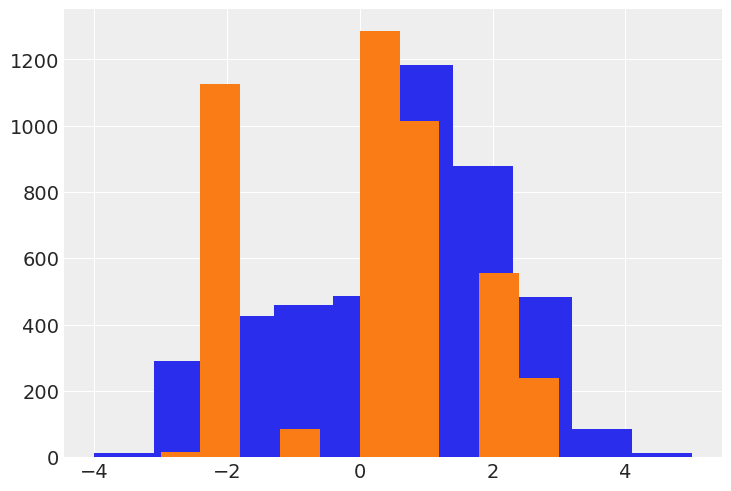

In [10]:
# Load data
exec(open("Joint_Trade_Landings_Data_AUGM.py").read())

In [11]:
# Numerical year
sdata['Year'] = sdata.year_spp_id+2012
txdata['Year'] = txdata.year_tax_id+2012
# Long country name
sdata['Country'] = biggest_countries_long[sdata.country_spp_id]
txdata['Country'] = biggest_countries_long[txdata.country_tax_id]
# un-log landings
sdata['Reported_species_landings'] = np.exp(sdata['logReported_species_landings'])
txdata['Reported_taxon_landings'] = np.exp(txdata['logReported_taxon_landings'])

# Make agumented objects
sdata_aug = sdata
txdata_aug = txdata
kdata_aug = kdata

# Grab group lists
group_a = group_
species_a = species_

In [12]:
# Grab augmented country list
biggest_countries_long_a = biggest_countries_long
biggest_countries_a = biggest_countries
country_a = country_

In [13]:
# Load data
#exec(open("Joint_Trade_Landings_Data.py").read())

# Import landings inference object

In [14]:
# Import MultiTrace objects
#idata_landings_x = az.from_netcdf("idata-landings-model.nc")
#idata_trade_x = az.from_netcdf("idata-trade-model.nc")

# Import MultiTrace objects
idata_trade_a = az.from_netcdf("idata-trade-model_AUGM.nc")
idata_landings_a = az.from_netcdf("idata-landings-model_AUGM.nc")

In [17]:
# Initalize backend
#ch_client = clickhouse_driver.Client(host="xxx.xxx.xxx.xxx", password='your-pwd', database='gsmtdb')
# Backend object
#ch_backend = mcbackend.ClickHouseBackend(ch_client)

In [18]:
# List backend runs available
#ch_backend.get_runs()

In [19]:
# Fetch the Landings run from the database (downloads just metadata)
#model_run = ch_backend.get_run('XXXXX')

In [20]:
# Import landings MultiTrace objects from server
#idata_landings_a = model_run.to_inferencedata(var_names=['Latent_landings'])

In [21]:
# Fetch the Landings run from the database (downloads just metadata)
#model_run = ch_backend.get_run('XXXXX')

In [22]:
# Import trade MultiTrace objects from server
#idata_trade_a = model_run.to_inferencedata(var_names=['Latent_landings'])

In [23]:
# Import species by habitat
hdata = pd.read_csv(bd+'Habitat.csv')
hdata = hdata[hdata.Superorder!='Holocephalimorpha']

In [24]:
# ArviZ doesn't handle MultiIndex yet
"""
# Making it aware of the real data labeling at the obs level
more_coords = {
    "Exporter": ("exporter", biggest_countries_long),
    "Importer": ("importer", biggest_countries_long)
}

# Update landings coords
idata_landings_x.prior = idata_landings_x.prior.assign_coords(more_coords)
idata_landings_x.prior_predictive = idata_landings_x.prior_predictive.assign_coords(more_coords)
idata_landings_x.posterior = idata_landings_x.posterior.assign_coords(more_coords)
idata_landings_x.posterior_predictive = idata_landings_x.posterior_predictive.assign_coords(
    more_coords
)
idata_landings_x.observed_data = idata_landings_x.observed_data.assign_coords(more_coords)
idata_landings_x.constant_data = idata_landings_x.constant_data.assign_coords(more_coords)

# Update trade coords
idata_trade_x.prior = idata_trade_x.prior.assign_coords(more_coords)
idata_trade_x.prior_predictive = idata_trade_x.prior_predictive.assign_coords(more_coords)
idata_trade_x.posterior = idata_trade_x.posterior.assign_coords(more_coords)
idata_trade_x.posterior_predictive = idata_trade_x.posterior_predictive.assign_coords(
    more_coords
)
idata_trade_x.observed_data = idata_trade_x.observed_data.assign_coords(more_coords)
idata_trade_x.constant_data = idata_trade_x.constant_data.assign_coords(more_coords)

#"""

more_coords_a = {
    "Exporter": ("exporter", biggest_countries_long_a),
    "Importer": ("importer", biggest_countries_long_a)
}

# Update landings coords
#idata_landings_a.prior = idata_landings_a.prior.assign_coords(more_coords_a)
#idata_landings_a.prior_predictive = idata_landings_a.prior_predictive.assign_coords(more_coords_a)
idata_landings_a.posterior = idata_landings_a.posterior.assign_coords(more_coords_a)
#idata_landings_a.posterior_predictive = idata_landings_a.posterior_predictive.assign_coords(    more_coords_a)
#idata_landings_x.observed_data = idata_landings_a.observed_data.assign_coords(more_coords_a)
#idata_landings_x.constant_data = idata_landings_a.constant_data.assign_coords(more_coords_a)

# Update trade coords
#idata_trade_a.prior = idata_trade_a.prior.assign_coords(more_coords_a)
#idata_trade_a.prior_predictive = idata_trade_a.prior_predictive.assign_coords(more_coords_a)
idata_trade_a.posterior = idata_trade_a.posterior.assign_coords(more_coords_a)
#idata_trade_a.posterior_predictive = idata_trade_a.posterior_predictive.assign_coords(
#    more_coords_a
#)
idata_trade_a.observed_data = idata_trade_a.observed_data.assign_coords(more_coords_a)
idata_trade_a.constant_data = idata_trade_a.constant_data.assign_coords(more_coords_a)

#"""

# Global summaries

## Grab temporal trends

In [25]:
# Annual augmented species landings
SppLandingsYear = (sdata_aug
                   .groupby('Year').sum()
                   .reset_index()[['Year','Reported_species_landings']]
                   .rename(columns={'Reported_species_landings':'Species'})
                  )
# Annual augmented taxon landings
TaxLandingsYear = (txdata_aug
                    .groupby('Year').sum()
                    .reset_index()[['Year','Reported_taxon_landings']]
                    .rename(columns={'Reported_taxon_landings':'NEI'}))
# Landings/year
LandingsYear = SppLandingsYear
LandingsYear['NEI'] = TaxLandingsYear.NEI
LandingsYear = LandingsYear.set_index(LandingsYear.Year).drop(columns=('Year'))

## Supplemental figure - NEI landings proportion

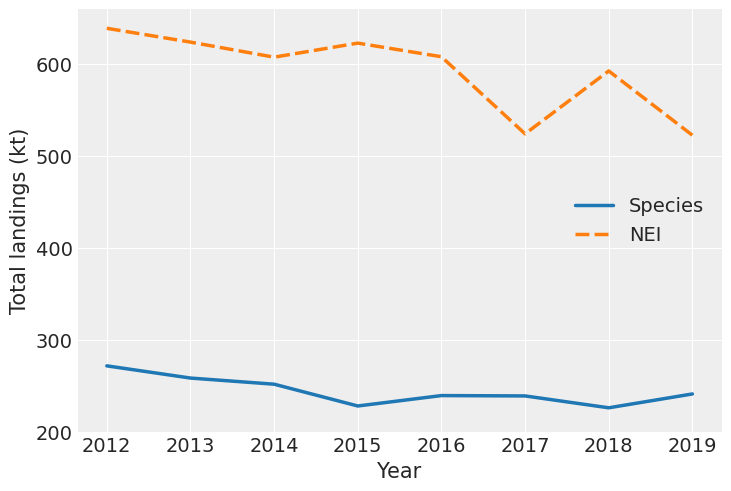

In [26]:
p = sns.lineplot(data=LandingsYear/1000, palette="tab10", linewidth=2.5)
p.set(yticks=(200,300,400,500,600),ylabel=('Total landings (kt)'))
plt.savefig(bf+'/Global/'+'Species_NEI_Landings.jpg',dpi=300);

In [27]:
# Average NEI landings proportion
np.mean(LandingsYear.NEI/(LandingsYear.NEI+LandingsYear.Species))

0.7076973000659901

## Plot reported and augmented latent landings

In [28]:
"""
# Plot reported and augmented estimated latent landings
c_landings_x = idata_landings_x.posterior['Latent_landings'].sum('species').to_dataframe().reset_index()
c_landings_x['Dataset'] = 'Reported'
c_landings_a = idata_landings_a.posterior['Latent_landings'].sum('species').to_dataframe().reset_index()
c_landings_a['Dataset'] = 'Augmented'
c_landings = c_landings_x.merge(c_landings_a,how='outer')
masxk = c_landings.Exporter=="Other Asia, nes"
c_landings.loc[masxk,'Exporter'] = 'Taiwan'
plot_order = c_landings.groupby('Exporter')['Latent_landings'].sum().sort_values(ascending=False).index.values
"""

'\n# Plot reported and augmented estimated latent landings\nc_landings_x = idata_landings_x.posterior[\'Latent_landings\'].sum(\'species\').to_dataframe().reset_index()\nc_landings_x[\'Dataset\'] = \'Reported\'\nc_landings_a = idata_landings_a.posterior[\'Latent_landings\'].sum(\'species\').to_dataframe().reset_index()\nc_landings_a[\'Dataset\'] = \'Augmented\'\nc_landings = c_landings_x.merge(c_landings_a,how=\'outer\')\nmasxk = c_landings.Exporter=="Other Asia, nes"\nc_landings.loc[masxk,\'Exporter\'] = \'Taiwan\'\nplot_order = c_landings.groupby(\'Exporter\')[\'Latent_landings\'].sum().sort_values(ascending=False).index.values\n'

In [29]:
#c_landings[c_landings.exporter=='CHN']

In [30]:
"""
# Draw a nested barplot
g = sns.catplot(
    data=c_landings, kind="bar",
    y="Exporter", x="Latent_landings", hue="Dataset", order=plot_order,
    errorbar="ci", palette="dark", alpha=.6, height=12,
    
)
g.despine(left=True)
g.set_axis_labels("Total landings (t/yr)","")
#g.legend.set_title("")
g.legend.set_title("Annual landings 2012-2019")
plt.savefig(bf+'/Global/'+'Latent_landings_reported_augmented_all.jpg',dpi=300);
"""

'\n# Draw a nested barplot\ng = sns.catplot(\n    data=c_landings, kind="bar",\n    y="Exporter", x="Latent_landings", hue="Dataset", order=plot_order,\n    errorbar="ci", palette="dark", alpha=.6, height=12,\n    \n)\ng.despine(left=True)\ng.set_axis_labels("Total landings (t/yr)","")\n#g.legend.set_title("")\ng.legend.set_title("Annual landings 2012-2019")\nplt.savefig(bf+\'/Global/\'+\'Latent_landings_reported_augmented_all.jpg\',dpi=300);\n'

In [31]:
"""
# Grab top N exporters
N = 35
exps = (c_landings.drop(columns=['exporter','Dataset'])
        .groupby('Exporter').sum().reset_index()
        .sort_values('Latent_landings',ascending=False)
        .Exporter[:N].values
       )
# Draw a nested barplot
g = sns.catplot(
    data=c_landings[c_landings.Exporter.isin(exps)], kind="bar",
    y="Exporter", x="Latent_landings", hue="Dataset", order=plot_order[match(exps,list(plot_order))],
    errorbar=('ci', 95), palette="dark", alpha=.6, height=7,
    
)
g.despine(left=True)
g.set_axis_labels("Total landings (t/yr)","")
#g.legend.set_title("")
g.legend.set_title("Annual landings 2012-2019")
#plt.savefig(bf+'/Global/'+'Latent_landings_reported_augmented_top_'+str(N)+'.jpg',dpi=300);
"""

'\n# Grab top N exporters\nN = 35\nexps = (c_landings.drop(columns=[\'exporter\',\'Dataset\'])\n        .groupby(\'Exporter\').sum().reset_index()\n        .sort_values(\'Latent_landings\',ascending=False)\n        .Exporter[:N].values\n       )\n# Draw a nested barplot\ng = sns.catplot(\n    data=c_landings[c_landings.Exporter.isin(exps)], kind="bar",\n    y="Exporter", x="Latent_landings", hue="Dataset", order=plot_order[match(exps,list(plot_order))],\n    errorbar=(\'ci\', 95), palette="dark", alpha=.6, height=7,\n    \n)\ng.despine(left=True)\ng.set_axis_labels("Total landings (t/yr)","")\n#g.legend.set_title("")\ng.legend.set_title("Annual landings 2012-2019")\n#plt.savefig(bf+\'/Global/\'+\'Latent_landings_reported_augmented_top_\'+str(N)+\'.jpg\',dpi=300);\n'

## Plot average percent re-exports among top 10 re-exporters

In [32]:
ReExportz = ReExports_AUGM.groupby(['Exporter','year']).sum().sort_values(by='Net_diff',ascending=False).drop(columns='exporter').reset_index()
ReExportz['Prop_ReEx'] = 1-ReExportz.Reduced/ReExportz.Original
ReExportz['Perc_ReEx'] = np.round(ReExportz['Prop_ReEx']*100,2)
ReExportz = ReExportz[ReExportz.Prop_ReEx!=1]
ReExportz = ReExportz[ReExportz.Net_diff>100]
plot_order = ReExportz.groupby('Exporter')['Net_diff'].mean().sort_values(ascending=False).index.values
ReExportz['hue'] = 'Landings'

/var/folders/0t/qrl_lm21285bvxnv0dg58ycm0000gn/T/ipykernel_17296/556126643.py:28: UserWarning: The figure layout has changed to tight
  plt.tight_layout()


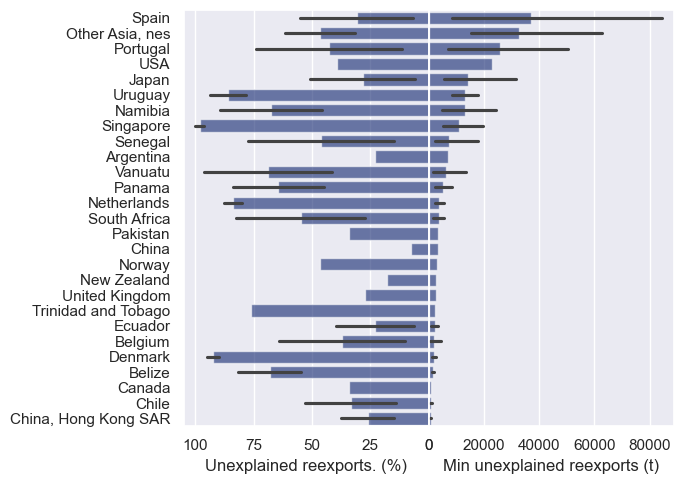

In [33]:
sns.set_theme()
fig, (ax1, ax2) = plt.subplots(ncols=2, figsize=(7, 5), sharey=True, gridspec_kw={'wspace': 0})

# draw total re-exports to the right
sns.barplot(
    data=ReExportz, hue='hue',
    y="Exporter", x="Net_diff", order=plot_order,
    errorbar="ci", palette="dark", alpha=.6, dodge=True, ax=ax2)

ax2.yaxis.set_label_position('right')
ax2.tick_params(axis='y', labelright=False, right=False)
ax2.legend_.remove()  # remove the legend; the legend will be in ax1
ax2.set_xlabel('Min unexplained reexports (t)')

# draw percent re-exports to the left
sns.barplot(
    data=ReExportz, hue='hue',
    y="Exporter", x="Perc_ReEx", order=plot_order,
    errorbar="sd", palette="dark", alpha=.6, dodge=True, 
    ax=ax1
    )

ax1.invert_xaxis()  # reverse the direction
#ax1.tick_params(labelleft=False, left=False)
ax1.set_ylabel('')
ax1.legend_.remove() 
ax1.set_xlabel('Unexplained reexports. (%)')
plt.tight_layout()
plt.savefig(bf+'/Global/'+'Avg_min_ReExports.jpg',dpi=300);

## Estimated numbers of sharks and rays annually

In [41]:
tidata = pd.read_csv(bd+'tax_iucn_size.csv')
tidata

,Class,Superorder,Order,Family,Genus,species_binomial,EDGE.Scientific.name,OldRLCategory,OldRLYear,GSTPRLCategory,GSTRLYear,MaxLinearDimension,MeasurementType,BodySizeClass,length.weight.a,length.weight.b,mass_50,mass_75,mass_max
0,Elasmobranchii,Batoidea,Myliobatiformes,Aetobatidae,Aetobatus,Aetobatus flagellum,Aetobatus flagellum,EN,2006.0,EN,2021,90.0,DW,medium,0.0123,3.11,1703.711400,6012.288955,14709.547590
1,Elasmobranchii,Batoidea,Myliobatiformes,Aetobatidae,Aetobatus,Aetobatus laticeps,NaN,NE,NaN,VU,2021,230.0,DW,large,0.0123,3.11,31526.473570,111254.916100,272194.083800
2,Elasmobranchii,Batoidea,Myliobatiformes,Aetobatidae,Aetobatus,Aetobatus narinari,Aetobatus narinari,NT,2006.0,EN,2021,226.0,DW,large,0.0123,3.11,29852.387520,105347.173100,257740.316300
3,Elasmobranchii,Batoidea,Myliobatiformes,Aetobatidae,Aetobatus,Aetobatus narutobiei,Aetobatus flagellum,NE,NaN,VU,2021,150.0,DW,medium,0.0123,3.11,8343.449479,29443.501500,72035.890140
4,Elasmobranchii,Batoidea,Myliobatiformes,Aetobatidae,Aetobatus,Aetobatus ocellatus,Aetobatus narinari,NE,NaN,VU,2016,330.0,DW,large,0.0123,3.11,96890.272630,341919.597500,836533.744600
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1212,Elasmobranchii,Batoidea,Myliobatiformes,Urotrygonidae,Urotrygon,Urotrygon rogersi,Urotrygon rogersi,DD,2008.0,NT,2020,46.0,DW,small,0.0269,3.02,348.473971,1185.675776,2826.707894
1213,Elasmobranchii,Batoidea,Myliobatiformes,Urotrygonidae,Urotrygon,Urotrygon simulatrix,Urotrygon simulatrix,VU,2008.0,VU,2020,27.0,DW,small,0.0269,3.02,69.720463,237.222492,565.549793
1214,Elasmobranchii,Batoidea,Myliobatiformes,Urotrygonidae,Urotrygon,Urotrygon venezuelae,Urotrygon venezuelae,NT,2007.0,EN,2020,36.0,DW,small,0.0269,3.02,166.216926,565.549793,1348.297820
1215,Elasmobranchii,Batoidea,Myliobatiformes,Zanobatidae,Zanobatus,Zanobatus maculatus,Zanobatus schoenleinii,NE,NaN,NT,2021,35.8,TL,small,0.0100,3.04,64.368474,220.795716,529.424946


In [42]:
txdata.loc[txdata.country=='CHN']

,logReported_taxon_landings,taxon_tax_id,country_tax_id,year_tax_id,country,year,taxon,Year,Country,Reported_taxon_landings
738,4.262680,19,9,0,CHN,year_1,Rajiformes,2012,China,71.0
739,4.605170,19,9,1,CHN,year_2,Rajiformes,2013,China,100.0
1147,10.610414,6,9,0,CHN,year_1,Elasmobranchii,2012,China,40555.0
1148,10.636913,6,9,1,CHN,year_2,Elasmobranchii,2013,China,41644.0
1149,10.661486,6,9,2,CHN,year_3,Elasmobranchii,2014,China,42680.0
1150,10.665251,6,9,3,CHN,year_4,Elasmobranchii,2015,China,42841.0
1151,10.649203,6,9,4,CHN,year_5,Elasmobranchii,2016,China,42159.0
1152,10.628715,6,9,5,CHN,year_6,Elasmobranchii,2017,China,41304.0
1153,10.504519,6,9,6,CHN,year_7,Elasmobranchii,2018,China,36480.0
1154,10.607451,6,9,7,CHN,year_8,Elasmobranchii,2019,China,40435.0


In [43]:
# Total indonesia trade
idata_trade_a.posterior['amount_exported'].sel(exporter='IDN').median(('chain','draw')).sum().values

array(2223.61176058)

In [44]:
# Indo blue, silky, bottlenose
idata_trade_a.posterior['amount_exported'].sel(exporter='IDN',species=['Prionace glauca','Carcharhinus falciformis','Rhynchobatus australiae']).median(('chain','draw')).sum(('importer')).values

array([934.66211748,   5.82174828, 245.32913365])

In [45]:
# Traded+retained
trade_spp = (
    idata_trade_a.copy().posterior['amount_exported']
    .rename('')
    .assign_coords({"Group": ("species", group_a),"Exporter": ("exporter", biggest_countries_long_a),"Importer": ("importer", biggest_countries_long_a)})
)

# Retain copy 
trade_spp_tot = trade_spp.copy()

# Domestic consumption
domestic_spp = trade_spp*0

# Store domestic and remove from trade
for c in country_a:
    # Add domestic consumption to domestic xarray
    domestic_spp.loc[dict(exporter=c,importer=c)] = trade_spp.sel(exporter=c,importer=c)
    # Remove domestic consumption from trade xarray
    trade_spp.loc[dict(exporter=c,importer=c)] = 0

# Split by group
total_shark_trade = trade_spp[:,:,:,group_a=='sharks',:].sum(('species'))
total_ray_trade = trade_spp[:,:,:,group_a=='rays',:].sum(('species'))

# Split by group for both trade and retained
total_shark = trade_spp_tot[:,:,:,group_a=='sharks',:].sum(('species'))
total_ray = trade_spp_tot[:,:,:,group_a=='rays',:].sum(('species'))

# Total trade
total_trade = total_shark_trade+total_ray_trade

In [46]:
species_a[match(idata_landings_a.posterior['Latent_landings'].species.values,list(tidata.species_binomial))==None]

array([], dtype='<U33')

In [47]:
# Latent landings by species
land_spp = idata_landings_a.posterior['Latent_landings']

In [55]:
# Vector of mass - convert g to tonnes
meanmass = tidata.mass_75.values[match(idata_landings_a.posterior['Latent_landings'].species.values,list(tidata.species_binomial))]/1000000

In [56]:
# Estimated tonnes of sharks landed annually
EstTsharks = (idata_landings_a.posterior['Latent_landings'].sum('exporter')).sel(species=species_[group_=='sharks']).sum('species')
# Estimated tonnes of rays landed annually
EstTrays = (idata_landings_a.posterior['Latent_landings'].sum('exporter')).sel(species=species_[group_=='rays']).sum('species')

# Estimated number of sharks landed annually
EstNsharks = (idata_landings_a.posterior['Latent_landings'].sum('exporter')/meanmass[None,None,]).sel(species=species_[group_=='sharks']).sum('species')
# Estimated number of rays landed annually
EstNrays = (idata_landings_a.posterior['Latent_landings'].sum('exporter')/meanmass[None,None,]).sel(species=species_[group_=='rays']).sum('species')


In [57]:
# Estimated tonnes of sharks traded annually
EstTsharks_trade = (trade_spp.sum(('exporter','importer'))).sel(species=species_[group_=='sharks']).sum('species')
# Estimated tonnes of rays traded annually
EstTrays_trade = (trade_spp.sum(('exporter','importer'))).sel(species=species_[group_=='rays']).sum('species')

# Estimated number of sharks traded annually
EstNsharks_trade = (trade_spp.sum(('exporter','importer'))/meanmass[None,None,]).sel(species=species_[group_=='sharks']).sum('species')
# Estimated number of rays traded annually
EstNrays_trade = (trade_spp.sum(('exporter','importer'))/meanmass[None,None,]).sel(species=species_[group_=='rays']).sum('species')

In [58]:
# Estimated tonnes of sharks+rays landed annually
EstTtotal = EstTsharks+EstTrays
# Estimated tonnes of sharks+rays traded annually
EstTtotal_trade = EstTsharks_trade+EstTrays_trade

# Estimated number of sharks+rays landed annually
EstNtotal = EstNsharks+EstNrays
# Estimated number of sharks+rays traded annually
EstNtotal_trade = EstNsharks_trade+EstNrays_trade

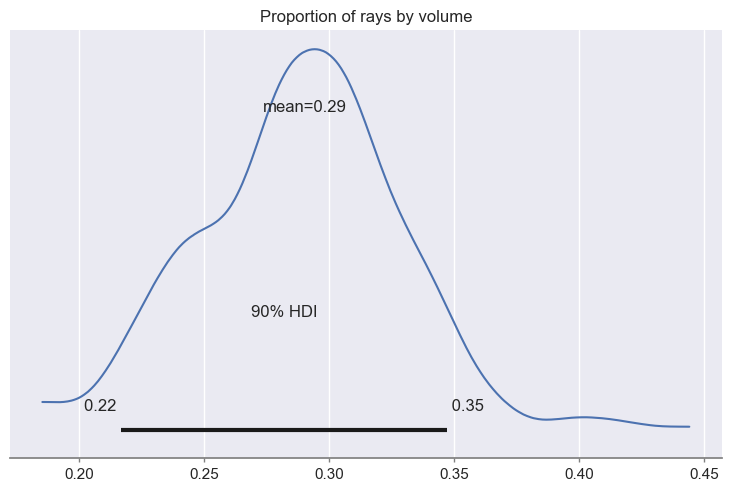

In [59]:
az.plot_posterior(EstTrays_trade/EstTtotal_trade, hdi_prob=.9)
plt.title('Proportion of rays by volume');

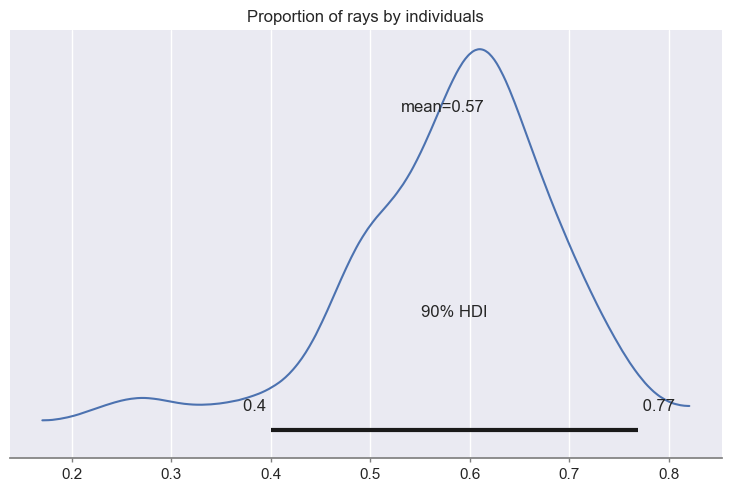

In [60]:
az.plot_posterior(EstNrays_trade/EstNtotal_trade, hdi_prob=.9)
plt.title('Proportion of rays by individuals');

In [61]:
# Data for the pie chart
labels = ['Sharks', 'Rays']

#plt.title("Proportion of Two Categories")


In [62]:
az.style.use("arviz-darkgrid")

Text(0.5, 0, 'Tonnes')

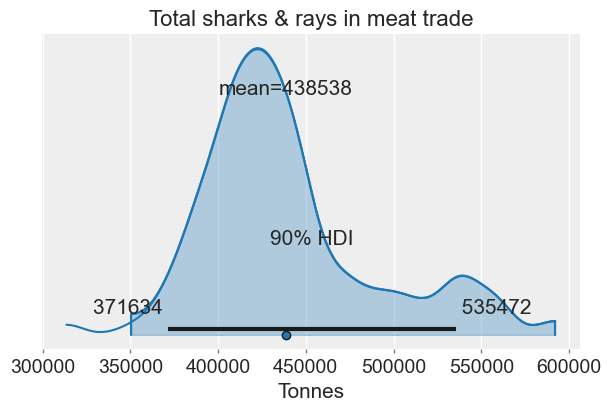

In [65]:
fig, ax = plt.subplots(1, 1,figsize=(6,4))
xout = EstTtotal_trade
az.plot_posterior(xout, color='#1f77b4', ax=ax, hdi_prob=0.9)
az.plot_density(xout, colors='#1f77b4', ax=ax, shade=0.3, hdi_prob=0.99)
plt.title('Total sharks & rays in meat trade')
plt.xlabel('Tonnes')
#plt.savefig(bf+'/Global/'+'Estimated_tonnes_total.jpg',dpi=300);

Text(0.5, 0, 'Millions')

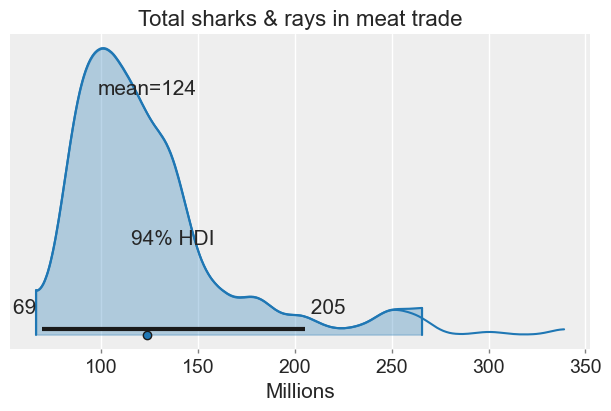

In [66]:
fig, ax = plt.subplots(1, 1,figsize=(6,4))
xout = EstNtotal_trade/1000000
az.plot_posterior(xout, color='#1f77b4', ax=ax)
az.plot_density(xout, colors='#1f77b4', ax=ax, shade=0.3, hdi_prob=0.99)
plt.title('Total sharks & rays in meat trade')
plt.xlabel('Millions')
#plt.savefig(bf+'/Global/'+'Estimated_individuals_total.jpg',dpi=300);

Text(0.5, 0, 'Millions')

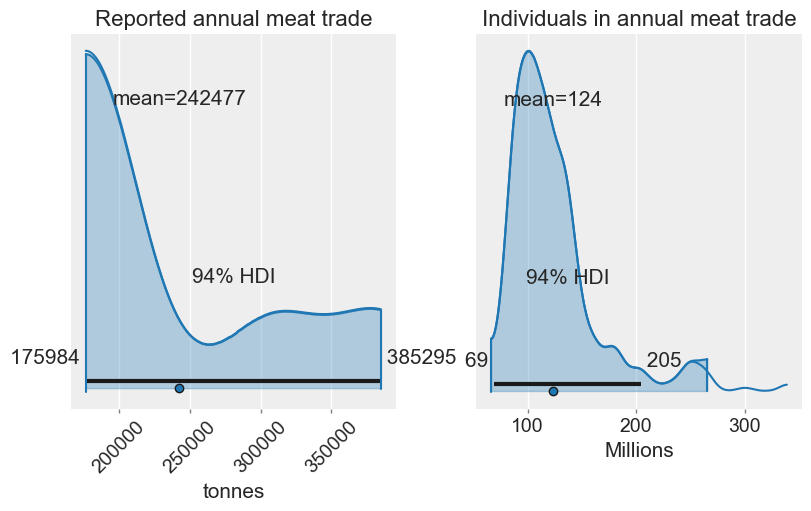

In [67]:
fig, ax = plt.subplots(1, 2,figsize=(8,5))
xout = tdata.groupby(('year_t')).sum().estimated_live_weight.values
az.plot_posterior(xout, color='#1f77b4', ax=ax[0])
az.plot_density(xout, colors='#1f77b4', ax=ax[0], shade=0.3, hdi_prob=0.99)
ax[0].set_title('Reported annual meat trade')
ax[0].set_xlabel('tonnes')
ax[0].tick_params(axis='x', labelrotation=45)

xout = EstNtotal_trade/1000000
az.plot_posterior(xout, color='#1f77b4', ax=ax[1])
az.plot_density(xout, colors='#1f77b4', ax=ax[1], shade=0.3, hdi_prob=0.99)
ax[1].set_title('Individuals in annual meat trade')


plt.xlabel('Millions')
#plt.savefig(bf+'/Global/'+'Estimated_reported_total.jpg',dpi=300);

In [68]:
xout = tdata.groupby(('year_t')).sum().estimated_live_weight.values

In [69]:
xout

array([196491.47155793, 175983.60871592, 192773.08965386, 183224.20790221,
       188665.37510852, 316708.49491392, 300678.41142158, 385295.23157881])

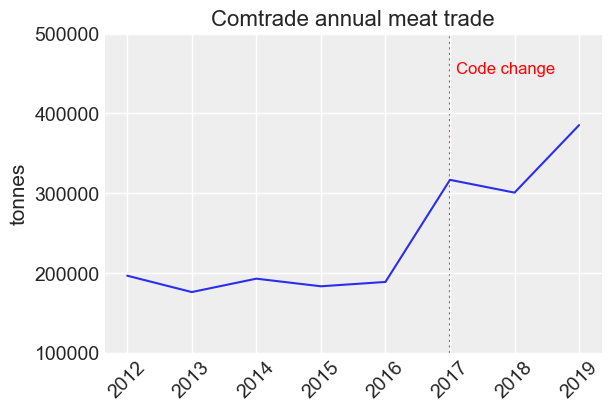

In [70]:
fig, ax = plt.subplots(1, 1,figsize=(6,4))

ax.plot(np.arange(2012,2020),xout)
#az.plot_posterior(xout, color='#1f77b4', ax=ax)
#az.plot_density(xout, colors='#1f77b4', ax=ax, shade=0.3, hdi_prob=0.99)
ax.set_title('Comtrade annual meat trade')
ax.set_ylabel('tonnes')
ax.tick_params(axis='x', labelrotation=45)
ax.set_ylim(100000,500000)
ax.set_yticks([100_000,200_000,300_000,400_000,500_000])
ax.axvline(x=2017, color='red', linestyle=':', zorder=0)
ax.text(2017.1,450_000,'Code change', color='red')


plt.savefig(bf+'/Global/'+'Reported_annual_trade.jpg',dpi=300);

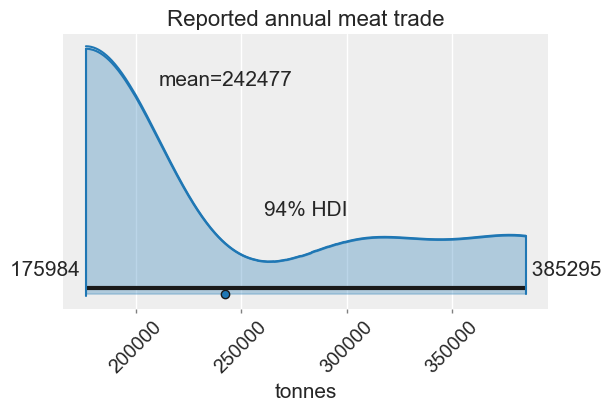

In [71]:
fig, ax = plt.subplots(1, 1,figsize=(6,4))
xout = tdata.groupby(('year_t')).sum().estimated_live_weight.values
az.plot_posterior(xout, color='#1f77b4', ax=ax)
az.plot_density(xout, colors='#1f77b4', ax=ax, shade=0.3, hdi_prob=0.99)
ax.set_title('Reported annual meat trade')
ax.set_xlabel('tonnes')
ax.tick_params(axis='x', labelrotation=45)

plt.savefig(bf+'/Global/'+'Reported_annual_total.jpg',dpi=300);

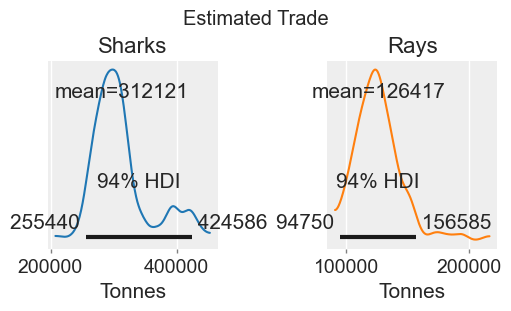

In [72]:
fig, ax = plt.subplots(1, 2,figsize=(5,3))
fig.suptitle("Estimated Trade")


az.plot_posterior(EstTsharks_trade, color='#1f77b4', ax=ax[0])
ax[0].set_title("Sharks")
ax[0].set_xlabel('Tonnes')


az.plot_posterior(EstTrays_trade, color='#ff7f0e', ax=ax[1])
ax[1].set_title("Rays")
ax[1].set_xlabel('Tonnes')

plt.savefig(bf+'/Global/'+'Estimated_tonnes.jpg',dpi=300);

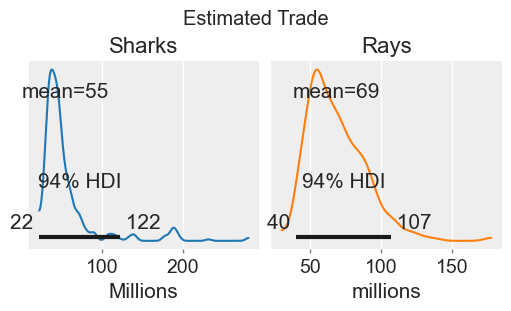

In [73]:
fig, ax = plt.subplots(1, 2,figsize=(5,3))
fig.suptitle("Estimated Trade")


az.plot_posterior(EstNsharks_trade/1000000, color='#1f77b4', ax=ax[0])
ax[0].set_title("Sharks")
ax[0].set_xlabel('Millions')


az.plot_posterior(EstNrays_trade/1000000, color='#ff7f0e', ax=ax[1])
ax[1].set_title("Rays")
ax[1].set_xlabel('millions')

plt.savefig(bf+'/Global/'+'Estimated_individuals.jpg',dpi=300);

## Plot top importers and exporters


In [74]:
# Grab top N 
N = 15
plot_order_ex = total_trade.sortby(total_trade.sum('importer').mean(('chain','draw')), ascending=False).exporter[:N]
plot_order_im = total_trade.sortby(total_trade.sum('exporter').mean(('chain','draw')), ascending=False).importer[:N]
plot_order_co = trade_spp_tot.sortby(trade_spp_tot.mean(('chain','draw','exporter','species')), ascending=False).importer[:N]

In [75]:
plot_order_co

<xarray.DataArray 'importer' (importer: 15)>
array(['IDN', 'IND', 'MEX', 'BRA', 'KOR', 'CHN', 'ESP', 'MYS', 'THA', 'ITA',
       'PRT', 'URY', 'FRA', 'TWN', 'PER'], dtype='<U3')
Coordinates:
  * importer  (importer) <U3 'IDN' 'IND' 'MEX' 'BRA' ... 'URY' 'FRA' 'TWN' 'PER'
    Importer  (importer) object 'Indonesia' 'India' ... 'Other Asia, nes' 'Peru'

In [76]:
# Total exports
tt_tmp_ex = total_trade.sum('importer').mean(('chain','draw')).astype(int).sortby(lambda x: x, ascending=False)
# Total percentage of exports represented by top N nations
top_ex_perc = tt_tmp_ex.to_dataframe().reset_index()[:N][''].sum()/tt_tmp_ex.to_dataframe().reset_index()[''].sum()
top_ex_perc

0.7411260584306151

In [77]:
tt_tmp_ex.to_dataframe()[:10]

,Exporter,
exporter,,
ESP,Spain,67316
USA,USA,36654
IDN,Indonesia,36480
CHN,China,33340
JPN,Japan,25300
TWN,"Other Asia, nes",23884
ARG,Argentina,21476
PRT,Portugal,14330
NGA,Nigeria,13363


In [78]:
tt_tmp_ex.sum()

<xarray.DataArray '' ()>
array(438503)

In [79]:
# Total imports
tt_tmp_im = total_trade.sum('exporter').mean(('chain','draw')).astype(int).sortby(lambda x: x, ascending=False)
# Total percentage of imports represented by top N nations
top_im_perc = tt_tmp_im.to_dataframe().reset_index()[:N][''].sum()/tt_tmp_im.to_dataframe().reset_index()[''].sum()
top_im_perc

0.719312488455197

In [80]:
tmpx = (total_trade.sum('exporter').mean(('chain','draw'))+domestic_spp.sum(('exporter')).mean(('chain','draw','species'))).astype(int).sortby(lambda x: x, ascending=False)

In [81]:
tmpx.astype(int).importer

<xarray.DataArray 'importer' (importer: 63)>
array(['KOR', 'BRA', 'CHN', 'ITA', 'PRT', 'ESP', 'URY', 'THA', 'FRA', 'TWN',
       'AUS', 'VNM', 'SGP', 'MEX', 'PER', 'MYS', 'JPN', 'ZAF', 'HKG', 'NLD',
       'COL', 'GRC', 'MAR', 'OMN', 'BEL', 'TTO', 'CRI', 'CAN', 'LKA', 'RUS',
       'GBR', 'SEN', 'PHL', 'DNK', 'USA', 'IDN', 'IND', 'PAN', 'TUN', 'NZL',
       'YEM', 'VEN', 'CHL', 'LBY', 'GHA', 'TZA', 'PAK', 'ARG', 'MRT', 'NAM',
       'BLZ', 'NOR', 'IRN', 'VUT', 'CUB', 'MOZ', 'AGO', 'ECU', 'MDG', 'BGD',
       'NGA', 'CMR', 'SLE'], dtype='<U3')
Coordinates:
  * importer  (importer) <U3 'KOR' 'BRA' 'CHN' 'ITA' ... 'BGD' 'NGA' 'CMR' 'SLE'
    Importer  (importer) object 'Rep. of Korea' 'Brazil' ... 'Sierra Leone'

In [82]:
# Total domestic
tt_tmp_d = domestic_spp.sum(('exporter','species')).mean(('chain','draw')).astype(int).sortby(lambda x: x, ascending=False)
# Total percentage of domestic consumptoin + imports represented by top N nations
top_d_perc = (tt_tmp_d.to_dataframe().reset_index()[:N][''].sum()+tt_tmp_im.to_dataframe().reset_index()[:N][''].sum())/(tt_tmp_d.to_dataframe().reset_index()[''].sum()+tt_tmp_im.to_dataframe().reset_index()[''].sum())
top_d_perc

0.7656350510188221

In [83]:
tt_tmp_d

<xarray.DataArray '' (importer: 63)>
array([96091, 57164, 45825, 26910, 12657, 12139, 12036,  9351,  8765,
        8615,  8343,  8113,  6968,  6263,  5680,  5081,  4727,  3966,
        3816,  3790,  3702,  3675,  3372,  3138,  3047,  2408,  2393,
        2364,  2341,  2200,  1934,  1865,  1849,  1843,  1803,  1397,
        1352,  1276,  1042,   953,   933,   913,   883,   781,   636,
         575,   416,   374,   348,   294,   279,   253,   226,   181,
         118,   115,    80,    64,    45,    43,    21,    11,     6])
Coordinates:
  * importer  (importer) <U3 'IDN' 'IND' 'MEX' 'MYS' ... 'NAM' 'BLZ' 'SGP' 'DNK'
    Importer  (importer) object 'Indonesia' 'India' ... 'Singapore' 'Denmark'

In [84]:
tdata.groupby(['year_t','ISOex_i']).sum().groupby(['ISOex_i']).mean('estimated_live_weight').sort_values(by='estimated_live_weight',ascending=False)[:N]

,Unnamed: 0,exporter_i,importer_j,hscode_k,value_v,quantity_q,fins,rays,estimated_live_weight
ISOex_i,,,,,,,,,
ESP,2128763.500,136836.00,76571.625,5742591.250,93084.379875,28422.942918,0.0,47.125,43136.774734
USA,1402478.000,109144.25,51579.000,3936993.250,54827.300500,14907.770874,0.0,59.250,23723.064867
TWN,403848.375,19845.00,18382.250,1230777.125,31484.948000,17743.447532,0.0,2.750,23447.024358
JPN,533114.125,20874.00,27159.000,1617726.375,22979.309500,12650.024684,0.0,17.625,19360.413560
IDN,460071.125,16695.00,20839.250,1408786.125,18517.111000,9909.229674,0.0,18.125,18598.875548
ARG,169457.750,812.00,10959.000,771010.125,26562.034625,11719.145683,0.0,16.500,17991.612952
CHN,608259.375,8677.50,24769.500,1691166.875,42040.230000,8172.101362,0.0,10.125,15208.231611
PRT,1408203.250,75562.50,50726.250,3702706.875,42774.562375,18858.155800,0.0,47.500,15003.186696
NZL,725080.625,39057.00,26897.000,2142164.375,13257.542250,3504.075270,0.0,31.500,6274.505145


In [86]:
# Data to locate exporter plot
tmpdata = total_trade.sum('importer').sel(exporter=plot_order_ex)
# Create dataframe for piecharts
piedata = tmpdata.median(('chain','draw')).to_dataframe().reset_index().rename(columns={"": "total_landings"})
piedata['median'] = tmpdata.quantile(.5,('chain','draw')).values
piedata['l90'] = tmpdata.quantile(.05,('chain','draw')).values
piedata['l50'] = tmpdata.quantile(.25,('chain','draw')).values
piedata['u50'] = tmpdata.quantile(.75,('chain','draw')).values
piedata['u90'] = tmpdata.quantile(.95,('chain','draw')).values
# Add sharks and rays
piedata['sharks'] = total_shark_trade.sum('importer').sel(exporter=plot_order_ex).mean(('chain','draw')).to_dataframe().reset_index()[""]
piedata['rays'] = total_ray_trade.sum('importer').sel(exporter=plot_order_ex).mean(('chain','draw')).to_dataframe().reset_index()[""]
# Convert to proportions
piedata['shark_prop'] = piedata['sharks']/(piedata['sharks']+piedata['rays'])
piedata['ray_prop'] = piedata['rays']/(piedata['sharks']+piedata['rays'])
# Add location for y plotting
piedata = piedata.sort_values(by='median',ascending=False).reset_index()
piedata['yloc'] = piedata.index.values[::-1]

# Data to locate importer plot
tmpdata = total_trade.sum('exporter').sel(importer=plot_order_im)
# Create dataframe for piecharts
piedata_im = tmpdata.median(('chain','draw')).to_dataframe().reset_index().rename(columns={"": "total_landings"})
piedata_im['median'] = tmpdata.quantile(.5,('chain','draw')).values
piedata_im['l90'] = tmpdata.quantile(.05,('chain','draw')).values
piedata_im['l50'] = tmpdata.quantile(.25,('chain','draw')).values
piedata_im['u50'] = tmpdata.quantile(.75,('chain','draw')).values
piedata_im['u90'] = tmpdata.quantile(.95,('chain','draw')).values
# Add sharks and rays
piedata_im['sharks'] = total_shark_trade.sum('exporter').sel(importer=plot_order_im).mean(('chain','draw')).to_dataframe().reset_index()[""]
piedata_im['rays'] = total_ray_trade.sum('exporter').sel(importer=plot_order_im).mean(('chain','draw')).to_dataframe().reset_index()[""]
# Convert to proportions
piedata_im['shark_prop'] = piedata_im['sharks']/(piedata_im['sharks']+piedata_im['rays'])
piedata_im['ray_prop'] = piedata_im['rays']/(piedata_im['sharks']+piedata_im['rays'])
# Add location for y plotting
piedata_im = piedata_im.sort_values(by='median',ascending=False).reset_index()
piedata_im['yloc'] = piedata_im.index.values[::-1]


# Data to locate utilizer plot - includes 'self' exports (domestic consumption) and imports
tmpdata = trade_spp_tot.sum(('exporter','species')).sel(importer=plot_order_co)
# Create dataframe for piecharts
piedata_ut = tmpdata.median(('chain','draw')).to_dataframe().reset_index().rename(columns={"": "total_landings"})
piedata_ut['median'] = tmpdata.quantile(.5,('chain','draw')).values
piedata_ut['l90'] = tmpdata.quantile(.05,('chain','draw')).values
piedata_ut['l50'] = tmpdata.quantile(.25,('chain','draw')).values
piedata_ut['u50'] = tmpdata.quantile(.75,('chain','draw')).values
piedata_ut['u90'] = tmpdata.quantile(.95,('chain','draw')).values
# Add sharks and rays
piedata_ut['sharks'] = total_shark.sum('exporter').sel(importer=plot_order_co).mean(('chain','draw')).to_dataframe().reset_index()[""]
piedata_ut['rays'] = total_ray.sum('exporter').sel(importer=plot_order_co).mean(('chain','draw')).to_dataframe().reset_index()[""]
# Convert to proportions
piedata_ut['shark_prop'] = piedata_ut['sharks']/(piedata_ut['sharks']+piedata_ut['rays'])
piedata_ut['ray_prop'] = piedata_ut['rays']/(piedata_ut['sharks']+piedata_ut['rays'])
# Add location for y plotting
piedata_ut = piedata_ut.sort_values(by='median',ascending=False).reset_index()
piedata_ut['yloc'] = piedata_ut.index.values[::-1]


In [87]:
# Calculate apparent consumption for everyone
apparent_consumption = (trade_spp_tot.sum(('exporter','species')).median(('chain','draw'))
                        .to_dataframe().reset_index().rename(columns={"": "total_landings"})
                       )

In [88]:
trade_spp_tot.sel(importer='IND').sum(('exporter','species')).median(('chain','draw'))

<xarray.DataArray '' ()>
array(59247.33441852)
Coordinates:
    importer  <U3 'IND'
    Importer  object 'India'

In [89]:
# Calculate proportion of global
apparent_consumption['elasmos_prop'] = apparent_consumption.total_landings/sum(apparent_consumption.total_landings)
# Sort by proportion of total consumption
apparent_consumption = apparent_consumption.sort_values(by='elasmos_prop',ascending=False)
# Add elasmos rank 
apparent_consumption['elasmos_rank'] = np.arange(apparent_consumption.shape[0])+1

In [90]:
apparent_consumption

,importer,Importer,total_landings,elasmos_prop,elasmos_rank
22,IDN,Indonesia,117372.654019,0.148591,1
23,IND,India,59247.334419,0.075006,2
32,MEX,Mexico,54865.282898,0.069458,3
6,BRA,Brazil,51118.593916,0.064715,4
27,KOR,Rep. of Korea,48890.780202,0.061895,5
35,MYS,Malaysia,34006.391191,0.043051,6
9,CHN,China,32750.695538,0.041462,7
16,ESP,Spain,30473.607359,0.038579,8
25,ITA,Italy,24845.911554,0.031454,9
51,THA,Thailand,24486.299155,0.030999,10


In [91]:
# Add ISOs to consumption data
apparent_consumption['ISO2'] = kdata.iso_2digit_alpha[match(apparent_consumption.importer,list(kdata.iso_3digit_alpha))].values

# Grab fish and seafood consumption data
xdata = pd.read_csv(bd+'fish-and-seafood-consumption-per-capita_2021.csv')
xdata = xdata.loc[xdata.Year==2021,]
# Grab population in 2021 data
ydata = pd.read_csv(bd+'SWOP-Data-2021.csv')

# Add total seafood consumption kg/yr per (millions)
apparent_consumption['seafood_consumption'] = (ydata.population_millions[match(apparent_consumption.ISO2,list(ydata.ISO2))].values*
                         xdata.consumption_per_capita.values[match(apparent_consumption.importer,list(xdata.Code))]
                        )
# Sort by proportion of total consumption
apparent_consumption = apparent_consumption.sort_values(by='seafood_consumption',ascending=False)
# Calculate proportion of global
apparent_consumption['seafood_prop'] = apparent_consumption.seafood_consumption/sum(apparent_consumption.seafood_consumption)
# Add seafood rank 
apparent_consumption['seafood_rank'] = np.arange(apparent_consumption.shape[0])+1
# Sort by proportion of total consumption
apparent_consumption = apparent_consumption.sort_values(by='elasmos_prop',ascending=False)

In [92]:
apparent_consumption.columns = ['importer', 'Importer', 'apparent_consumption', 'elasmos_prop', 'elasmos_rank',
                                'ISO2', 'seafood_consumption', 'seafood_prop', 'seafood_rank']

In [93]:
apparent_consumption['diff'] = (apparent_consumption.seafood_rank-apparent_consumption.elasmos_rank)
apparent_consumption['diff_sq'] = apparent_consumption['diff']**2

In [94]:
# Apparent consumption VS global seafood rankings
apparent_consumption.head(15)

,importer,Importer,apparent_consumption,elasmos_prop,elasmos_rank,ISO2,seafood_consumption,seafood_prop,seafood_rank,diff,diff_sq
22,IDN,Indonesia,117372.654019,0.148591,1,ID,12272.160000,0.087065,2,1,1
23,IND,India,59247.334419,0.075006,2,IN,11091.464000,0.078689,3,1,1
32,MEX,Mexico,54865.282898,0.069458,3,MX,1807.261130,0.012822,14,11,121
6,BRA,Brazil,51118.593916,0.064715,4,BR,1718.420000,0.012191,18,14,196
27,KOR,Rep. of Korea,48890.780202,0.061895,5,KR,2854.332154,0.020250,10,5,25
35,MYS,Malaysia,34006.391191,0.043051,6,MY,1729.872000,0.012273,17,11,121
9,CHN,China,32750.695538,0.041462,7,CN,57609.138000,0.408710,1,-6,36
16,ESP,Spain,30473.607359,0.038579,8,ES,1873.136860,0.013289,13,5,25
25,ITA,Italy,24845.911554,0.031454,9,IT,1783.007819,0.012650,15,6,36
51,THA,Thailand,24486.299155,0.030999,10,TH,2006.199860,0.014233,12,2,4


In [95]:
sp.stats.spearmanr(apparent_consumption.elasmos_rank,apparent_consumption.seafood_rank)

SignificanceResult(statistic=0.5856854838709677, pvalue=4.599073496138152e-07)

In [96]:
def statistic(x,y):  # explore all possible pairings by permuting `x`
    rs = sp.stats.spearmanr(x, y).statistic  # ignore pvalue
    dof = len(x)-2
    transformed = rs * np.sqrt(dof / ((rs+1.0)*(1.0-rs)))
    return transformed


In [97]:
ref = sp.stats.permutation_test((apparent_consumption.elasmos_rank,apparent_consumption.seafood_rank), statistic, alternative='greater',
                             permutation_type='pairings')

In [98]:
ref.pvalue

0.0001

In [99]:
# Correct names
piedata.loc[piedata.Exporter=='Rep. of Korea','Exporter'] = 'South Korea'
piedata.loc[piedata.Exporter=='Other Asia, nes','Exporter'] = 'Taiwan'
piedata_im.loc[piedata_im.Importer=='Rep. of Korea','Importer'] = 'South Korea'
piedata_im.loc[piedata_im.Importer=='Other Asia, nes','Importer'] = 'Taiwan'
piedata_ut.loc[piedata_ut.Importer=='Rep. of Korea','Importer'] = 'South Korea'
piedata_ut.loc[piedata_ut.Importer=='Other Asia, nes','Importer'] = 'Taiwan'

apparent_consumption.loc[apparent_consumption.Importer=='Rep. of Korea','Importer'] = 'South Korea'
apparent_consumption.loc[apparent_consumption.Importer=='Other Asia, nes','Importer'] = 'Taiwan'


In [100]:
apparent_consumption

,importer,Importer,apparent_consumption,elasmos_prop,elasmos_rank,ISO2,seafood_consumption,seafood_prop,seafood_rank,diff,diff_sq
22,IDN,Indonesia,117372.654019,0.148591,1,ID,12272.160000,8.706533e-02,2,1,1
23,IND,India,59247.334419,0.075006,2,IN,11091.464000,7.868883e-02,3,1,1
32,MEX,Mexico,54865.282898,0.069458,3,MX,1807.261130,1.282169e-02,14,11,121
6,BRA,Brazil,51118.593916,0.064715,4,BR,1718.420000,1.219140e-02,18,14,196
27,KOR,South Korea,48890.780202,0.061895,5,KR,2854.332154,2.025017e-02,10,5,25
35,MYS,Malaysia,34006.391191,0.043051,6,MY,1729.872000,1.227265e-02,17,11,121
9,CHN,China,32750.695538,0.041462,7,CN,57609.138000,4.087103e-01,1,-6,36
16,ESP,Spain,30473.607359,0.038579,8,ES,1873.136860,1.328904e-02,13,5,25
25,ITA,Italy,24845.911554,0.031454,9,IT,1783.007819,1.264962e-02,15,6,36
51,THA,Thailand,24486.299155,0.030999,10,TH,2006.199860,1.423306e-02,12,2,4


In [101]:
# Add seafood consumption rank to piedata
piedata_ut['seafood_c'] = (apparent_consumption
                           .seafood_rank.values[match(piedata_ut.importer.values,list(apparent_consumption.importer))]
                           .astype(str)
                          )

piedata_ut['seafood_sq'] = (apparent_consumption
                           .diff_sq.values[match(piedata_ut.importer.values,list(apparent_consumption.importer))]
                           .astype(str)
                          )

piedata_ut['diff'] = (apparent_consumption['diff']
                           .values[match(piedata_ut.importer.values,list(apparent_consumption.importer))]
                           .astype(str)
                          )

# Figure 1

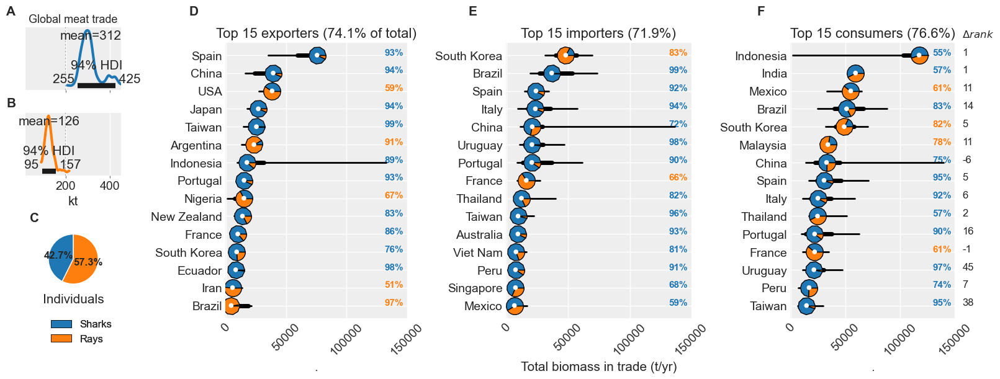

In [102]:
az.style.use("arviz-darkgrid")

fig = plt.figure(figsize=(16, 6))
(lftfig, rtfig1, rtfig2, rtfig3) = fig.subfigures(1,4, width_ratios=(1.,2,2,2))

fsz = 15

# - - - - - - - - - - - - - - - Initialize left plot
(lft_top_axs,lft_bot_axs,lft_bot_axs2,lft_dub) = lftfig.subplots(4, 1)

# Plot biomass retained
#az.plot_density(EstNsharks_trade/1000000, colors='#1f77b4', ax=lft_top_axs, shade=0.6, hdi_prob=0.94)
#az.plot_posterior(EstNsharks_trade/1000000, color='#1f77b4', ax=lft_top_axs, linewidth=3)
az.plot_posterior(EstTsharks_trade/1000, color='#1f77b4', ax=lft_top_axs, linewidth=3)
lft_top_axs.set_yticklabels("")
lft_top_axs.set_xticklabels("")
lft_top_axs.set_xlabel('')
#lft_top_axs.set_xticks((25,50,75,100))
lft_top_axs.set_title('Global meat trade', fontsize=13)
tmpx = 20
tmpy = 450
lft_top_axs.set_xlim(tmpx,tmpy)
lft_top_axs.axvline(x=200,color='grey', linestyle=':', zorder=0)
# Add journal letter
letter_annotation(lft_top_axs, -.2, 1.2, 'A', sz=fsz)

# Plot biomass retained
#az.plot_density(EstNrays_trade/1000000, colors='#ff7f0e', ax=lft_bot_axs, shade=0.6, hdi_prob=0.94)
#az.plot_posterior(EstNrays_trade/1000000, color='#ff7f0e', ax=lft_bot_axs, linewidth=3)
az.plot_posterior(EstTrays_trade/1000, color='#ff7f0e', ax=lft_bot_axs, linewidth=3)
lft_bot_axs.set_yticklabels("")
lft_bot_axs.set_xlabel('kt')
lft_bot_axs.set_title('')
#lft_bot_axs.set_xticks((25,50,75,100))
lft_bot_axs.set_xlim(tmpx,tmpy)
lft_bot_axs.axvline(x=200,color='grey', linestyle=':', zorder=0)
# Add journal letter
letter_annotation(lft_bot_axs, -.2, 1.1, 'B', sz=fsz)

sizes = [np.mean(EstNsharks_trade/EstNtotal_trade),np.mean(EstNrays_trade/EstNtotal_trade)]
# Draw the pie chart
lft_bot_axs2.pie(sizes, labels=None, autopct='%1.1f%%', startangle=90, colors=['#1f77b4','#ff7f0e'],textprops={'weight': 'bold'})
lft_bot_axs2.set_xlabel('Individuals')
# Add journal letter
letter_annotation(lft_bot_axs2, -.2, 1.1, 'C', sz=fsz)

# Turn off dummy plot
lft_dub.axis("off")
legend_elements1 = [patches.Patch(facecolor=c, label=i, edgecolor='black', linewidth=0.5) for i,c in zip(['Sharks','Rays'],['#1f77b4','#ff7f0e'])]
legend1 = lft_dub.legend(handles=legend_elements1, fontsize=12, loc='upper right')
lft_dub.add_artist(legend1)

# - - - - - - - - - - - - - - - Initialize next plot
# Max x value
topx = 150000
# Font size for percentages
fsx = 11

rtfig1_axs = rtfig1.subplots(1, 1)

# Exporters
rtfig1_axs.scatter(x=piedata['total_landings'], y=piedata['yloc'], s=30, facecolor='white', edgecolors='none', zorder=11)
rtfig1_axs.plot((piedata['l90'],piedata['u90']), (piedata['yloc'],piedata['yloc']), c='black', linewidth=2, zorder=9)
rtfig1_axs.plot((piedata['l50'],piedata['u50']), (piedata['yloc'],piedata['yloc']), c='black', linewidth=5, zorder=9)
rindx = piedata['ray_prop'].values>0.5
sindx = piedata['ray_prop'].values<0.5
[rtfig1_axs.text(147050,y,str(np.round(z*100,0).astype(int))+'%',horizontalalignment='right',fontsize=fsx,color='#ff7f0e', weight='bold') for y,z in zip(piedata['yloc'][rindx], piedata['ray_prop'].values[rindx])]
[rtfig1_axs.text(147050,y,str(np.round(z*100,0).astype(int))+'%',horizontalalignment='right',fontsize=fsx,color='#1f77b4', weight='bold') for y,z in zip(piedata['yloc'][sindx], piedata['shark_prop'].values[sindx])]

for xx,yy,xxr,yyr in zip(piedata['total_landings'],piedata['yloc'],piedata['shark_prop'].values,piedata['ray_prop'].values):
    drawPieMarker(xs=xx,
                  ys=yy,
                  ratios=[xxr,1-xxr],
                  sizes=[400],
                  colors=['#1f77b4','#ff7f0e'],
                  ax=rtfig1_axs)

tmp_lab = piedata.Exporter.to_numpy()[::-1]
tmp_lab[tmp_lab=="Other Asia, nes"] = 'Taiwan'
rtfig1_axs.set_yticks(np.arange(len(tmp_lab)))
rtfig1_axs.set_yticklabels(tmp_lab)
[tk.set_visible(True) for tk in rtfig1_axs.get_yticklabels()]
rtfig1_axs.set_xlabel('.')
rtfig1_axs.set_xlim(-500,topx)
rtfig1_axs.set_title('Top '+str(N)+' exporters ('+str(np.round(top_ex_perc*100,1))+'% of total)')
#rtfig1_axs.legend_.remove() 
for tick in rtfig1_axs.get_xticklabels():
    tick.set_rotation(45)
    # Add journal letter
letter_annotation(rtfig1_axs, -.2, 1.1, 'D', sz=fsz)

# - - - - - - - - - - - - - - - Initialize next plot
rtfig2_axs = rtfig2.subplots(1, 1)

# Importers
rtfig2_axs.scatter(x=piedata_im['total_landings'], y=piedata_im['yloc'], s=30, facecolor='white', edgecolors='none', zorder=11)
rtfig2_axs.plot((piedata_im['l90'],piedata_im['u90']), (piedata_im['yloc'],piedata_im['yloc']), c='black', linewidth=2, zorder=9)
rtfig2_axs.plot((piedata_im['l50'],piedata_im['u50']), (piedata_im['yloc'],piedata_im['yloc']), c='black', linewidth=5, zorder=9)
rindx = piedata_im['ray_prop'].values>0.5
sindx = piedata_im['ray_prop'].values<0.5
[rtfig2_axs.text(147050,y,str(np.round(z*100,0).astype(int))+'%',horizontalalignment='right',fontsize=fsx,color='#ff7f0e', weight='bold') for y,z in zip(piedata_im['yloc'][rindx], piedata_im['ray_prop'].values[rindx])]
[rtfig2_axs.text(147050,y,str(np.round(z*100,0).astype(int))+'%',horizontalalignment='right',fontsize=fsx,color='#1f77b4', weight='bold') for y,z in zip(piedata_im['yloc'][sindx], piedata_im['shark_prop'].values[sindx])]


for xx,yy,xxr,yyr in zip(piedata_im['total_landings'],piedata_im['yloc'],piedata_im['shark_prop'].values,piedata_im['ray_prop'].values):
    drawPieMarker(xs=xx,
                  ys=yy,
                  ratios=[xxr,1-xxr],
                  sizes=[400],
                  colors=['#1f77b4','#ff7f0e'],
                  ax=rtfig2_axs)

tmp_lab = piedata_im.Importer.to_numpy()[::-1]
tmp_lab[tmp_lab=="Other Asia, nes"] = 'Taiwan'
rtfig2_axs.set_yticks(np.arange(len(tmp_lab)))
rtfig2_axs.set_yticklabels(tmp_lab)
[tk.set_visible(True) for tk in rtfig2_axs.get_yticklabels()]
rtfig2_axs.set_xlabel('Total biomass in trade (t/yr)')
rtfig2_axs.set_xlim(-500,topx)
rtfig2_axs.set_title('Top '+str(N)+' importers ('+str(np.round(top_im_perc*100,1))+'%)')
for tick in rtfig2_axs.get_xticklabels():
    tick.set_rotation(45)
# Add journal letter
letter_annotation(rtfig2_axs, -.2, 1.1, 'E', sz=fsz)

# - - - - - - - - - - - - - - - Initialize next plot
rtfig3_axs = rtfig3.subplots(1, 1)

# Utilizers
rtfig3_axs.scatter(x=piedata_ut['total_landings'], y=piedata_ut['yloc'], s=30, facecolor='white', edgecolors='none', zorder=11)
rtfig3_axs.plot((piedata_ut['l90'],piedata_ut['u90']), (piedata_ut['yloc'],piedata_ut['yloc']), c='black', linewidth=2, zorder=9)
rtfig3_axs.plot((piedata_ut['l50'],piedata_ut['u50']), (piedata_ut['yloc'],piedata_ut['yloc']), c='black', linewidth=5, zorder=9)
rindx = piedata_ut['ray_prop'].values>0.5
sindx = piedata_ut['ray_prop'].values<0.5
[rtfig3_axs.text(147050,y,str(np.round(z*100,0).astype(int))+'%',horizontalalignment='right',fontsize=fsx,color='#ff7f0e', weight='bold') for y,z in zip(piedata_ut['yloc'][rindx], piedata_ut['ray_prop'].values[rindx])]
[rtfig3_axs.text(147050,y,str(np.round(z*100,0).astype(int))+'%',horizontalalignment='right',fontsize=fsx,color='#1f77b4', weight='bold') for y,z in zip(piedata_ut['yloc'][sindx], piedata_ut['shark_prop'].values[sindx])]

for xx,yy,xxr,yyr in zip(piedata_ut['total_landings'],piedata_ut['yloc'],piedata_ut['shark_prop'].values,piedata_ut['ray_prop'].values):
    drawPieMarker(xs=xx,
                  ys=yy,
                  ratios=[xxr,1-xxr],
                  sizes=[400],
                  colors=['#1f77b4','#ff7f0e'],
                  ax=rtfig3_axs)

# Add global seafood rank
#[rtfig3_axs.text(157000,y,t) for y,t in zip(piedata_ut['yloc'], piedata_ut.seafood_c)]
#rtfig3_axs.text(157000,max(piedata_ut['yloc'])+1,'Global\nseafood\nrank')

# Add global seafood difference squared
[rtfig3_axs.text(157000,y,t) for y,t in zip(piedata_ut['yloc'], piedata_ut['diff'])]
#rtfig3_axs.text(157000,max(piedata_ut['yloc'])+1,'Global\nseafood\nd$^{2}$')
rtfig3_axs.text(157000,max(piedata_ut['yloc'])+1,'$\Delta rank$')

tmp_lab = piedata_ut.Importer.to_numpy()[::-1]
tmp_lab[tmp_lab=="Other Asia, nes"] = 'Taiwan'
rtfig3_axs.set_yticks(np.arange(len(tmp_lab)))
rtfig3_axs.set_yticklabels(tmp_lab)
[tk.set_visible(True) for tk in rtfig3_axs.get_yticklabels()]
rtfig3_axs.set_xlabel('.')
rtfig3_axs.set_xlim(-500,topx)
rtfig3_axs.set_title('Top '+str(N)+' consumers ('+str(np.round(top_d_perc*100,1))+'%)')
for tick in rtfig3_axs.get_xticklabels():
    tick.set_rotation(45)
# Add journal letter
letter_annotation(rtfig3_axs, -.2, 1.1, 'F', sz=fsz)

plt.savefig(bf+'/Global/'+'Top_trading_nations.jpg',dpi=300);

In [103]:
# Grab average annual exports of sharks and rays
sharkexports = tdata_cut_sharks[['ISOex_i', 'quantity_q']].groupby('ISOex_i').sum().rename(columns={'quantity_q': 'shark_quantity_q'})
rayexports = tdata_cut_rays[['ISOex_i', 'quantity_q']].groupby('ISOex_i').sum().rename(columns={'quantity_q': 'ray_quantity_q'})
ObsExports = sharkexports.join(rayexports).fillna(0)
ObsExports['total_exports'] = ObsExports.shark_quantity_q+ObsExports.ray_quantity_q

In [104]:
ObsExports.head(3)

,shark_quantity_q,ray_quantity_q,total_exports
ISOex_i,,,
AGO,147.606595,256.389167,403.995762
ARG,404.045445,11662.347775,12066.393220
AUS,140.954750,18.941000,159.895750


In [105]:
tmp = ObsExports.join(piedata.set_index(['exporter'])['total_landings']).dropna()
tmp['ObsRank'] = tmp['total_exports'].rank(method='average')
tmp['EstRank'] = tmp['total_landings'].rank(method='average')
tmp['Diff'] = tmp['total_exports'] - tmp['total_landings']
tmp.sort_values('Diff',ascending=False)

,shark_quantity_q,ray_quantity_q,total_exports,total_landings,ObsRank,EstRank,Diff
ISOex_i,,,,,,,
PRT,18049.196397,833.157643,18882.354040,15061.906975,12.0,7.0,3820.447065
BRA,90.358909,1773.503500,1863.862409,4382.471518,2.0,1.0,-2518.609109
ECU,3394.602132,80.381667,3474.983799,8112.059767,6.0,3.0,-4637.075968
IRN,131.673667,693.192500,824.866167,5515.638258,1.0,2.0,-4690.772091
IDN,8024.681207,3346.509667,11371.190874,17426.572250,8.0,8.0,-6055.381376
KOR,1968.376644,640.493274,2608.869918,8966.547621,3.0,4.0,-6357.677703
TWN,18755.989344,143.480667,18899.470011,25307.196492,13.0,10.0,-6407.726481
FRA,2258.584925,528.610008,2787.194934,9862.345925,4.0,5.0,-7075.150991
NZL,2320.031894,1087.981550,3408.013444,13746.537442,5.0,6.0,-10338.523998


# Sankey

In [106]:
trdx = trade_spp.mean(('chain','draw'))

In [107]:
# Convert the xarray Dataset to a DataFrame for easier manipulation.
df = trdx.groupby(('Group')).sum('species').to_dataframe().reset_index()
poo = list(df.columns)
poo[-1] = 'Volume'
df.columns = poo

In [108]:
# Drop trade less than 1000t
df = df[df.Volume>1000]

In [118]:
# --- Global Country Colors ---
# Get all unique country names from both Exporter and Importer columns.
all_countries = sorted(set(df["Exporter"].unique()).union(set(df["Importer"].unique())))
# Use a Plotly qualitative color palette.
colors_palette = px.colors.qualitative.Plotly
global_country_color = {country: colors_palette[i % len(colors_palette)] 
                        for i, country in enumerate(all_countries)}

# --- Create a 1x2 Subplot Layout ---
# Left panel: "sharks", Right panel: "rays"
fig = make_subplots(
    rows=1, cols=2,
    specs=[[{"type": "domain"}, {"type": "domain"}]],
    #subplot_titles=("Shark trade", "Ray trade")
)

# --- Build a Sankey Diagram for Each Group ---
# We force the order: left panel for "sharks", right panel for "rays".
group_order = ['sharks', 'rays']
for idx, group in enumerate(group_order):
    df_group = df[df['Group'] == group].copy()
    
    # --- Define Nodes with Volume in the Label ---
    # For exporters: aggregate Volume and create labels "Country (Volume)"
    exporters_agg = df_group.groupby('Exporter')['Volume'].sum().sort_values(ascending=False)
    exporters_list = list(exporters_agg.index)
    exporter_labels = [f"{exp} ({int(round(exporters_agg[exp]))} t)" for exp in exporters_list]
    
    # For importers: aggregate Volume and create labels "Country (Volume)"
    importers_agg = df_group.groupby('Importer')['Volume'].sum().sort_values(ascending=False)
    importers_list = list(importers_agg.index)
    importer_labels = [f"{imp} ({int(round(importers_agg[imp]))} t)" for imp in importers_list]
    
    # Combine nodes: exporters on the left, importers on the right.
    nodes = exporter_labels + importer_labels
    
    # Build mapping for links:
    # Exporter nodes: use indices as in exporters_list,
    # Importer nodes: indices shifted by len(exporters_list).
    node_mapping = {}
    for i, exporter in enumerate(exporters_list):
        node_mapping[('Exporter', exporter)] = i
    for i, importer in enumerate(importers_list):
        node_mapping[('Importer', importer)] = len(exporters_list) + i
        
    # --- Build Links ---
    source_indices = df_group['Exporter'].map(lambda x: node_mapping[('Exporter', x)]).tolist()
    target_indices = df_group['Importer'].map(lambda x: node_mapping[('Importer', x)]).tolist()
    values = df_group['Volume'].tolist()
    
    # --- Set Node Positions ---
    # Force exporters at x = 0.0 and importers at x = 1.0.
    num_exporters = len(exporters_list)
    num_importers = len(importers_list)
    node_x = [0.0] * num_exporters + [1.0] * num_importers
    # Let node.y auto-arrange.
    
    # --- Set Node Colors Using the Global Mapping ---
    exporter_colors = [global_country_color.get(exp, "#CCCCCC") for exp in exporters_list]
    importer_colors = [global_country_color.get(imp, "#CCCCCC") for imp in importers_list]
    node_colors = exporter_colors + importer_colors
    
    # --- Create the Sankey Diagram Trace ---
    sankey_trace = go.Sankey(
        node=dict(
            pad=15,
            thickness=20,
            line=dict(color="black", width=0.5),
            label=nodes,
            x=node_x,
            color=node_colors
        ),
        link=dict(
            source=source_indices,
            target=target_indices,
            value=values
        )
    )
    
    # Place the sankey diagram in the appropriate column (row=1, col=idx+1)
    fig.add_trace(sankey_trace, row=1, col=idx+1)

# --- Update Overall Layout ---
fig.update_layout(
    #title_text="2-Panel Sankey Plot: Sharks on the Left and Rays on the Right",
    width=1100,
    height=600,
    margin=dict(l=50, r=50, t=100, b=50),
    font_size=10
)

fig.update_layout(font_family='Helvetica', font_size=14)

fig.show()

fig.write_image(bf+'/Global/'+'Top_trade_sankey.jpg', width=1200, height=600, scale=4);

ValueError: 
Image export using the "kaleido" engine requires the kaleido package,
which can be installed using pip:
    $ pip install -U kaleido


In [119]:
# --- Global Country Colors ---
# Get all unique country names from both Exporter and Importer columns.
all_countries = sorted(set(df["Exporter"].unique()).union(set(df["Importer"].unique())))
# Ensure we have 36 unique countries.
if len(all_countries) < 36:
    all_countries = countries

# Generate a palette of 36 distinct colors using the Viridis colorscale.
num_countries = len(all_countries)
# Generate 36 distinct colors.
colors_palette = generate_n_colors(num_countries)
global_country_color = {country: colors_palette[i] for i, country in enumerate(all_countries)}

# --- Create a 2x2 Subplot Layout ---
# The bottom row (row=2) will hold the two Sankey diagrams.
fig = make_subplots(
    rows=2, cols=2,
    specs=[[{"type": "xy"}, {"type": "xy"}],
           [{"type": "domain"}, {"type": "domain"}]],
    row_heights=[0.33, 0.67],  # Top row: 33%, Bottom row: 67%
    subplot_titles=("Panel 1", "Panel 2", "Sankey Diagram - Group1", "Sankey Diagram - Group2")
)

# --- Build a Sankey Diagram for Each Group ---
group_list = sorted(df['Group'].unique())
for idx, group in enumerate(group_list):
    df_group = df[df['Group'] == group].copy()
    
    # --- Define Nodes with Volume in the Label ---
    # For exporters: aggregate Volume and create labels "Country (Volume)"
    exporters_agg = df_group.groupby('Exporter')['Volume'].sum().sort_values(ascending=False)
    exporters_list = list(exporters_agg.index)
    exporter_labels = [f"{exp} ({int(round(exporters_agg[exp]))})" for exp in exporters_list]
    
    # For importers: aggregate Volume and create labels "Country (Volume)"
    importers_agg = df_group.groupby('Importer')['Volume'].sum().sort_values(ascending=False)
    importers_list = list(importers_agg.index)
    importer_labels = [f"{imp} ({int(round(importers_agg[imp]))})" for imp in importers_list]
    
    # Combine nodes: exporters on the left, importers on the right.
    nodes = exporter_labels + importer_labels
    
    # Build mapping for links:
    # Exporter nodes: use index from exporters_list.
    # Importer nodes: indices shifted by len(exporters_list).
    node_mapping = {}
    for i, exporter in enumerate(exporters_list):
        node_mapping[('Exporter', exporter)] = i
    for i, importer in enumerate(importers_list):
        node_mapping[('Importer', importer)] = len(exporters_list) + i
        
    # --- Build Links ---
    source_indices = df_group['Exporter'].map(lambda x: node_mapping[('Exporter', x)]).tolist()
    target_indices = df_group['Importer'].map(lambda x: node_mapping[('Importer', x)]).tolist()
    values = df_group['Volume'].tolist()
    
    # --- Set Node Positions ---
    # Force exporters at x = 0.0 and importers at x = 1.0.
    num_exporters = len(exporters_list)
    num_importers = len(importers_list)
    node_x = [0.0] * num_exporters + [1.0] * num_importers
    # Let node.y auto-arrange vertically.
    
    # --- Set Node Colors Based on the Global Mapping ---
    exporter_colors = [global_country_color.get(exp, "#CCCCCC") for exp in exporters_list]
    importer_colors = [global_country_color.get(imp, "#CCCCCC") for imp in importers_list]
    node_colors = exporter_colors + importer_colors
    
    # --- Create the Sankey Diagram Trace ---
    sankey_trace = go.Sankey(
        node=dict(
            pad=15,
            thickness=20,
            line=dict(color="black", width=0.5),
            label=nodes,
            x=node_x,
            color=node_colors
        ),
        link=dict(
            source=source_indices,
            target=target_indices,
            value=values
        )
    )
    
    # Place each Sankey diagram in the bottom row:
    # First group goes to row=2, col=1; second group goes to row=2, col=2.
    fig.add_trace(sankey_trace, row=2, col=idx+1)

# --- Update Overall Layout ---
fig.update_layout(
    title_text="Four-Panel Plot with Sankey Diagrams (36 Unique Countries with Distinct Colors)",
    width=1200,
    height=800,
    margin=dict(l=50, r=50, t=100, b=50),
    font_size=10
)

In [120]:
# Calculate proportion of catch exported
dom = domestic_spp.sum(('species','importer'))
tot = domestic_spp.sum(('species','importer'))+trade_spp.sum(('species','importer'))
prop_ex = 1-(dom/tot)
prop_ex = prop_ex.sortby(prop_ex.median(('chain','draw')))

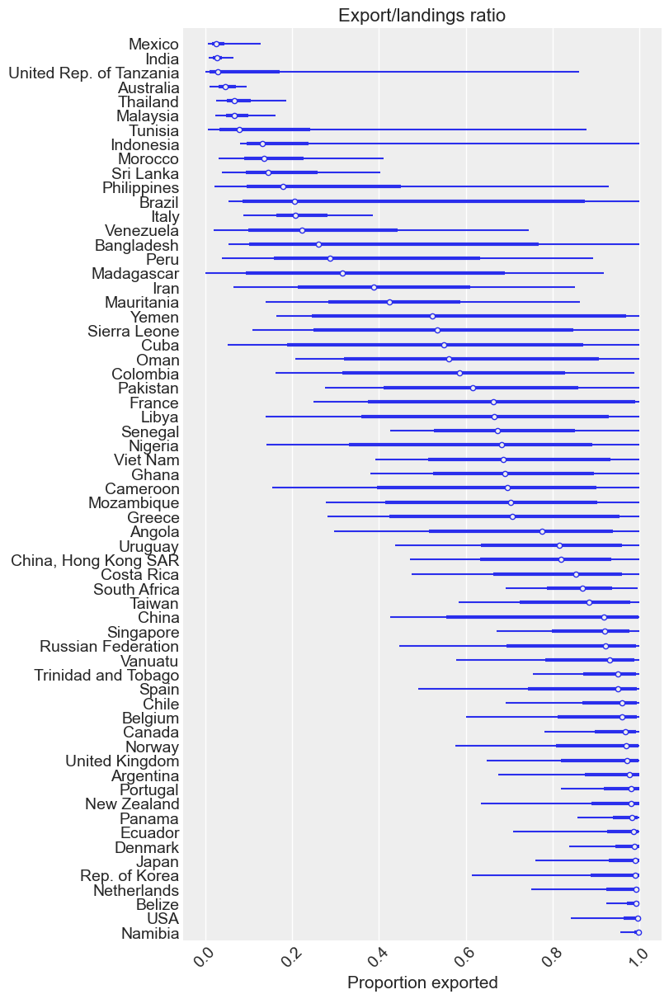

In [121]:
# Plot proportion of trade exported
ax = az.plot_forest(
        prop_ex,
        hdi_prob=0.9,
        combined=True,
        figsize=(8, 12)
        )
ax[0].set(
    title="Export/landings ratio",
    xlabel="Proportion exported",
    ylabel="",
);
for tick in ax[0].get_xticklabels():
    tick.set_rotation(45)

tmp_lab = prop_ex.Exporter.to_numpy()[::-1]
tmp_lab[tmp_lab=="Other Asia, nes"] = 'Taiwan'
ax[0].set_yticklabels(tmp_lab)

plt.savefig(bf+'/Global/'+'AUGM_Proportion_exports.jpg',dpi=300);

## Observed bits for plotting


In [122]:
# Grab species level estimates for observed data
(sdata.drop(columns=['year','year_spp_id','country_spp_id','species_spp_id','Country','Year'])
 .rename(columns={"Reported_species_landings": "Reported_landings"})
 .groupby(['country','species']).mean()
)

logReported_species_landings  \
country species                                                 
ARG     Atlantoraja castelnaui                       1.819424   
        Atlantoraja cyclophora                       3.441098   
        Bathyraja brachyurops                        2.927946   
        Bathyraja macloviana                         1.956012   
        Carcharhinus brachyurus                      1.370160   
...                                                       ...   
ZAF     Isurus oxyrinchus                            6.382149   
        Mustelus mustelus                            4.735991   
        Notorynchus cepedianus                       1.168980   
        Prionace glauca                              6.107405   
        Triakis megalopterus                         0.774240   

                                 Reported_landings  
country species                                     
ARG     Atlantoraja castelnaui               7.500  
        Atlantoraja cyclophora              44.500  
        Bathyraja brachyurops               28.200  
        Bathyraja macloviana                13.500  
        Carcharhinus brachyurus              4.750  
...                                            ...  
ZAF     Isurus oxyrinchus                  648.125  
        Mustelus mustelus                  166.125  
        Notorynchus cepedianus               3.500  
        Prionace glauca                    467.875  
        Triakis megalopterus                 2.200  

[492 rows x 2 columns]

In [123]:
# Grab species level estimates for observed data
Obs_spp_data = (sdata.drop(columns=['year','year_spp_id','country_spp_id','species_spp_id','Country','Year'])
 .rename(columns={"Reported_species_landings": "Reported_landings"})
 .groupby(['country','species']).mean()
)
# Create xarray data of totals by species
Obs_spp_sums = xr.Dataset(Obs_spp_data.groupby(level='species').sum().sort_values(by='Reported_landings', ascending=False))

# Grab taxon level estimates for observed data
Obs_tax_data = (txdata.drop(columns=['year','year_tax_id','country_tax_id','taxon_tax_id','Country','Year'])
                .groupby(['country','taxon']).mean()
                .rename(columns={"Reported_taxon_landings": "Reported_landings"})
               )
# Net estimated unreported species-level landings
Net_spp_landings = idata_landings_a.posterior['Latent_landings']-idata_landings_a.posterior['CountrySPP_landings']

## Species proporitons in latent landings

In [125]:
totalLanded = idata_landings_a.posterior['Latent_landings'].median(('chain','draw')).sum()
totalLanded.values

array(427246.29806068)

In [126]:
# Select top 10% of traded species
tmp = trade_spp.sum(('exporter','importer')).median(('chain','draw'))
#tmp = idata_landings_a.posterior['Latent_landings'].sum(('exporter')).median(('chain','draw'))
tmp = tmp.sortby(tmp, ascending=False)
sppx_trad = tmp[tmp>np.quantile(tmp,0.90)].species[:15]

late_land = idata_landings_a.posterior['Latent_landings'].sel(species=sppx_trad).sum(('exporter')).rename("")
tmp_ll = late_land.median(('chain','draw')).to_dataframe().reset_index()
tmp_ll.columns = ['species','group','value']
tmp_ll['proportion'] = tmp_ll['value']/totalLanded.values
tmp_ll.sort_values(by='value',ascending=False)

,species,group,value,proportion
0,Prionace glauca,sharks,165196.957585,0.386655
6,Carcharhinus falciformis,sharks,27079.746588,0.063382
3,Isurus oxyrinchus,sharks,20690.035076,0.048426
2,Squalus acanthias,sharks,17643.242617,0.041295
1,Dipturus brevicaudatus,rays,15679.107336,0.036698
5,Leucoraja ocellata,rays,15511.087715,0.036305
4,Alopias pelagicus,sharks,15264.483748,0.035728
9,Sphyrna lewini,sharks,9968.646014,0.023332
11,Rhizoprionodon acutus,sharks,8665.122558,0.020281
10,Raja clavata,rays,8530.668531,0.019967


In [127]:
# Latent trade
late_trad = trade_spp.sel(species=sppx_trad).sum(('exporter','importer')).rename("")
tmp_lt = late_trad.median(('chain','draw')).to_dataframe().reset_index()
tmp_lt.columns = ['species','group','value']
tmp_lt['proportion'] = tmp_lt['value']/totalLanded.values
tmp_lt.sort_values(by='value',ascending=False)

,species,group,value,proportion
0,Prionace glauca,sharks,116738.338897,0.273234
1,Dipturus brevicaudatus,rays,20539.379958,0.048074
2,Squalus acanthias,sharks,17067.561049,0.039948
3,Isurus oxyrinchus,sharks,15536.381119,0.036364
4,Alopias pelagicus,sharks,12106.341619,0.028336
5,Leucoraja ocellata,rays,10329.181021,0.024176
6,Carcharhinus falciformis,sharks,9665.269779,0.022622
7,Leucoraja erinacea,rays,7884.931268,0.018455
8,Mustelus mustelus,sharks,7160.830967,0.016760
9,Sphyrna lewini,sharks,4436.052352,0.010383


In [128]:
top_latent = tmp_lt.merge(tmp_ll,on='species').drop(columns=['group_y'])
top_latent.columns = ['species','group','trade','proportion_trade','landings','proportion_land']
top_latent['prop_exported'] = top_latent.trade/top_latent.landings
top_latent

,species,group,trade,proportion_trade,landings,proportion_land,prop_exported
0,Prionace glauca,sharks,116738.338897,0.273234,165196.957585,0.386655,0.706662
1,Dipturus brevicaudatus,rays,20539.379958,0.048074,15679.107336,0.036698,1.309984
2,Squalus acanthias,sharks,17067.561049,0.039948,17643.242617,0.041295,0.967371
3,Isurus oxyrinchus,sharks,15536.381119,0.036364,20690.035076,0.048426,0.750911
4,Alopias pelagicus,sharks,12106.341619,0.028336,15264.483748,0.035728,0.793105
5,Leucoraja ocellata,rays,10329.181021,0.024176,15511.087715,0.036305,0.665922
6,Carcharhinus falciformis,sharks,9665.269779,0.022622,27079.746588,0.063382,0.356919
7,Leucoraja erinacea,rays,7884.931268,0.018455,6778.984321,0.015867,1.163143
8,Mustelus mustelus,sharks,7160.830967,0.016760,6789.899186,0.015892,1.054630
9,Sphyrna lewini,sharks,4436.052352,0.010383,9968.646014,0.023332,0.445000


## Plot top reported and unreported species

In [129]:
# Select top 10% of traded species
tmp = trade_spp.sum(('exporter','importer')).median(('chain','draw'))
#tmp = idata_landings_a.posterior['Latent_landings'].sum(('exporter')).median(('chain','draw'))
tmp = tmp.sortby(tmp, ascending=False)
sppx_trad = tmp[tmp>np.quantile(tmp,0.90)].species[:15]

# Select reported landings
rep_land = idata_landings_a.posterior['CountrySPP_landings'].sel(species=sppx_trad).sum(('exporter')).rename("")

# Select unreported landings
unrep_land = idata_landings_a.posterior['CountrySPP_Taxonlandings'].sel(species=sppx_trad).sum(('exporter')).rename("")

# Proportion unreported
prop_land = unrep_land/(rep_land+unrep_land)

# Select trade
late_trad = trade_spp.sel(species=sppx_trad).sum(('exporter','importer')).rename("")

# Proporiton of unreported trade
un_trad = late_trad*prop_land

In [130]:
tmp = rep_land.mean(('chain','draw')).to_dataframe().reset_index()
tmp.columns = ['species','group','value']
tmp['proportion'] = tmp['value']/sum(tmp['value'])
tmp.sort_values(by='value',ascending=False)

,species,group,value,proportion
0,Prionace glauca,sharks,122917.239070,0.589352
2,Squalus acanthias,sharks,15506.728008,0.074350
3,Isurus oxyrinchus,sharks,12739.745703,0.061083
6,Carcharhinus falciformis,sharks,9109.545776,0.043678
4,Alopias pelagicus,sharks,7723.003083,0.037030
5,Leucoraja ocellata,rays,6701.548771,0.032132
12,Scyliorhinus canicula,sharks,6530.314766,0.031311
11,Rhizoprionodon acutus,sharks,5417.318106,0.025974
10,Raja clavata,rays,5210.613843,0.024983
7,Leucoraja erinacea,rays,4551.491155,0.021823


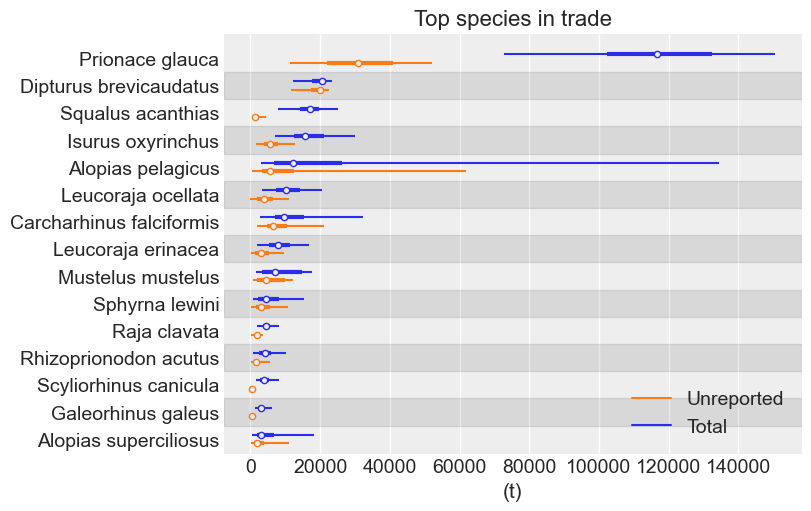

In [131]:
# = = = = = Set up plot
_, ax = plt.subplots(1,1,figsize=(8, 5))

# Exporters
az.plot_forest(
    [late_trad, un_trad],
    model_names=["Total", "Unreported"],
    figsize=(5, 12),
    combined=True,
    ax=ax
)
tmp_lab = sppx_trad.to_numpy()[::-1]
#ax.set_xlim(-2000, 25000)
#ax.set_xscale('log')
ax.set_yticklabels(tmp_lab)
ax.set_title("Top species in trade")
#ax.legend(loc="lower right")

ax.set_xlabel('(t)')
plt.savefig(bf+'/Global/'+'Top_traded_species.jpg',dpi=300);

#### 

## Plot non-blue shark trade

In [132]:
# Select traded species
tmp = trade_spp.sum(('exporter','importer')).median(('chain','draw'))
#tmp = idata_landings_a.posterior['Latent_landings'].sum(('exporter')).median(('chain','draw'))
tmp = tmp.sortby(tmp, ascending=False)
# Species with more than 100 tonnes traded globally/year
sppx_trad = tmp[tmp>100].species

In [133]:
# Total number of non-blue shark species >20t
len(tmp[tmp>20])

304

In [134]:
# Total number of non-blue shark species >50t
len(tmp[tmp>50])

217

In [135]:
# Number of non-blue shark species >100t
len(sppx_trad)-1

156

In [136]:
# Select traded species
tmp = trade_spp.sum(('exporter','importer')).median(('chain','draw'))
#tmp = idata_landings_a.posterior['Latent_landings'].sum(('exporter')).median(('chain','draw'))
tmp = tmp.sortby(tmp, ascending=False)
# Species with more than 100 tonnes traded globally/year
sppx_trad = tmp[tmp>100].species
# blue shark trade
bs_trad = sppx_trad[0]
# The other top species
sppx_trad = sppx_trad[1:]

# Select reported landings
rep_land = idata_landings_a.posterior['CountrySPP_landings'].sel(species=sppx_trad).sum(('exporter')).rename("")
rep_land_bs = idata_landings_a.posterior['CountrySPP_landings'].sel(species=bs_trad).sum(('exporter')).rename("")

# Select unreported landings
unrep_land = idata_landings_a.posterior['CountrySPP_Taxonlandings'].sel(species=sppx_trad).sum(('exporter')).rename("")
unrep_land_bs = idata_landings_a.posterior['CountrySPP_Taxonlandings'].sel(species=bs_trad).sum(('exporter')).rename("")

# Proportion unreported
prop_land = unrep_land/(rep_land+unrep_land)
prop_land_bs = unrep_land_bs/(rep_land_bs+unrep_land_bs)

# Select trade
late_trad = trade_spp.sel(species=sppx_trad).sum(('exporter','importer')).rename("")
late_trad_bs = trade_spp.sel(species=bs_trad).sum(('exporter','importer')).rename("")

# Proporiton of unreported trade
un_trad = late_trad*prop_land
un_trad_bs = late_trad_bs*prop_land_bs

In [137]:
sppx_trad

<xarray.DataArray 'species' (species: 156)>
array(['Dipturus brevicaudatus', 'Squalus acanthias', 'Isurus oxyrinchus',
       'Alopias pelagicus', 'Leucoraja ocellata', 'Carcharhinus falciformis',
       'Leucoraja erinacea', 'Mustelus mustelus', 'Sphyrna lewini',
       'Raja clavata', 'Rhizoprionodon acutus', 'Scyliorhinus canicula',
       'Galeorhinus galeus', 'Alopias superciliosus', 'Alopias vulpinus',
       'Sphyrna zygaena', 'Carcharhinus limbatus', 'Leucoraja naevus',
       'Carcharhinus longimanus', 'Potamotrygon motoro',
       'Acroteriobatus salalah', 'Raja brachyura', 'Amblyraja radiata',
       'Sphyrna mokarran', 'Dipturus nasutus', 'Galeocerdo cuvier',
       'Mustelus schmitti', 'Mustelus canis', 'Carcharhinus sorrah',
       'Mustelus lenticulatus', 'Carcharhinus plumbeus', 'Dalatias licha',
       'Aetobatus narutobiei', 'Carcharhinus leucas', 'Amblyraja hyperborea',
       'Rhinobatos irvinei', 'Carcharhinus brachyurus', 'Squalus blainville',
       'Centrophorus squamosus', 'Raja montagui', 'Gymnura poecilura',
       'Rhinobatos rhinobatos', 'Himantura uarnak', 'Carcharhinus signatus',
       'Rajella fyllae', 'Carcharhinus melanopterus',
       'Carcharhinus brevipinna', 'Glaucostegus cemiculus',
       'Scyliorhinus stellaris', 'Squatina argentina',
       'Rhinobatos albomaculatus', 'Dipturus innominatus', 'Triaenodon obesus',
       'Carcharhinus albimarginatus', 'Aetobatus ocellatus',
       'Rhynchobatus djiddensis', 'Dasyatis pastinaca', 'Hypanus americanus',
       'Heptranchias perlo', 'Squatina oculata', 'Carcharhinus amblyrhynchos',
       'Rhizoprionodon oligolinx', 'Rhynchobatus australiae',
       'Rhincodon typus', 'Carcharhinus amboinensis', 'Zanobatus schoenleinii',
       'Deania calcea', 'Mobula mobular', 'Isurus paucus',
       'Rhynchobatus luebberti', 'Notorynchus cepedianus', 'Galeus melastomus',
       'Centrophorus granulosus', 'Rhinoptera javanica', 'Hexanchus griseus',
       'Centroscymnus coelolepis', 'Mustelus mosis', 'Carcharodon carcharias',
       'Carcharhinus dussumieri', 'Rhizoprionodon terraenovae',
       'Dipturus chilensis', 'Gymnura altavela', 'Carcharhinus obscurus',
       'Squalus suckleyi', 'Glaucostegus granulatus', 'Taeniura lymma',
       'Scoliodon macrorhynchos', 'Raja microocellata', 'Leucoraja circularis',
       'Rhina ancylostoma', 'Mobula birostris', 'Loxodon macrorhinus',
       'Dipturus oxyrinchus', 'Chiloscyllium plagiosum', 'Lamna nasus',
       'Aetobatus narinari', 'Maculabatis gerrardi', 'Mustelus asterias',
       'Raja undulata', 'Rhinoptera marginata', 'Paragaleus pectoralis',
       'Urogymnus asperrimus', 'Hypanus guttatus', 'Malacoraja senta',
       'Himantura undulata', 'Mustelus manazo', 'Rhynchobatus laevis',
       'Himantura leoparda', 'Carcharhinus acronotus', 'Carcharhinus macloti',
       'Etmopterus spinax', 'Taeniurops meyeni', 'Chiloscyllium punctatum',
       'Beringraja binoculata', 'Hemitrygon akajei', 'Bathyraja spinicauda',
       'Mustelus punctulatus', 'Leucoraja fullonica', 'Squalus brevirostris',
       'Mustelus griseus', 'Scoliodon laticaudus', 'Nebrius ferrugineus',
       'Sphyrna tiburo', 'Deania profundorum', 'Cetorhinus maximus',
       'Pteroplatytrygon violacea', 'Aetomylaeus nichofii',
       'Rhizoprionodon porosus', 'Rostroraja alba', 'Leptocharias smithii',
       'Aetomylaeus maculatus', 'Carcharias taurus', 'Torpedo marmorata',
       'Pastinachus ater', 'Squalus japonicus', 'Negaprion brevirostris',
       'Pristis zijsron', 'Carcharhinus sealei', 'Myliobatis aquila',
       'Pseudocarcharias kamoharai', 'Squalus mitsukurii',
       'Etmopterus lucifer', 'Ginglymostoma cirratum', 'Mobula eregoodoo',
       'Dasyatis marmorata', 'Gymnura zonura', 'Raja asterias',
       'Torpedo mackayana', 'Bathytoshia lata', 'Negaprion acutidens',
       'Atelomycterus marmoratus', 'Mustelus henlei', 'Rostroraja eglanteria',
       'Stegostoma tigrinum', 'Carcharhinus hemiodon', 'Squatina californica'],
      dtyp

## Skate trade detail

In [138]:
trade_spp.sel(species=['Leucoraja ocellata','Leucoraja erinacea'],exporter='USA',importer=['KOR','FRA']).median(('chain','draw')).sum('species')

<xarray.DataArray '' (importer: 2)>
array([4366.30960226, 2247.63452701])
Coordinates:
    exporter  <U3 'USA'
  * importer  (importer) <U3 'KOR' 'FRA'
    Exporter  object 'USA'
    Importer  (importer) object 'Rep. of Korea' 'France'

### Blue shark proportion of total trade

In [139]:
# Blue shark proportion of total trade
bs_prop = late_trad_bs/(late_trad_bs+late_trad.sum('species'))
np.quantile(bs_prop,(0.5, 0.05, 0.95))

array([0.30009467, 0.20922002, 0.37703788])

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


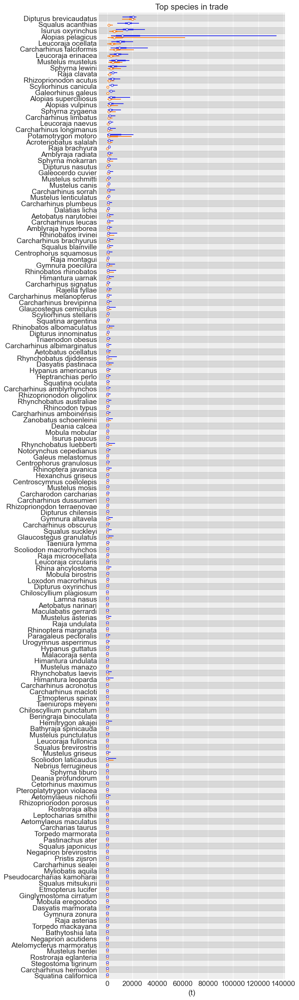

In [140]:
# = = = = = Set up plot
_, ax = plt.subplots(1,1,figsize=(8, 27))

# Exporters
az.plot_forest(
    [late_trad, un_trad],
    model_names=["Total", "Unreported"],
    figsize=(5, 12),
    combined=True,
    ax=ax
)
tmp_lab = sppx_trad.to_numpy()[::-1]
#ax.set_xlim(-2000, 25000)
#ax.set_xscale('log')
ax.set_yticklabels(tmp_lab)
ax.set_title("Top species in trade")
ax.legend(loc="lower right")

ax.set_xlabel('(t)')
plt.savefig(bf+'/Global/'+'Top_traded_species_long.jpg',dpi=300);

In [141]:
tmp = late_trad.quantile(.5,('chain','draw')).to_dataframe().reset_index()
tmp.columns = ['Species', 'Group', 'quantile', 'median']
tmp['l90'] = late_trad.quantile(.05,('chain','draw')).to_numpy()
tmp['u90'] = late_trad.quantile(.95,('chain','draw')).to_numpy()
tmp.drop('quantile', axis=1).to_csv("top_spp.csv", index=False)

In [142]:
tmp

,Species,Group,quantile,median,l90,u90
0,Dipturus brevicaudatus,rays,0.5,20539.379958,11069.943558,22693.997231
1,Squalus acanthias,sharks,0.5,17067.561049,9984.901646,24577.659686
2,Isurus oxyrinchus,sharks,0.5,15536.381119,8923.562038,30115.025138
3,Alopias pelagicus,sharks,0.5,12106.341619,3927.699235,134132.935970
4,Leucoraja ocellata,rays,0.5,10329.181021,3877.163031,19928.620732
...,...,...,...,...,...,...
151,Mustelus henlei,sharks,0.5,103.624481,18.192721,1053.217241
152,Rostroraja eglanteria,rays,0.5,103.234780,21.631821,460.373143
153,Stegostoma tigrinum,sharks,0.5,102.750507,14.721783,756.622030
154,Carcharhinus hemiodon,sharks,0.5,102.021876,13.275343,1145.759287


## Trade by group

## Plot traded vs CITES and ICUN status

In [143]:
# Download CITES 2013 status
cdata = pd.read_csv(bd+'cites_listing_2013.csv')
#cdata['CITES'] = np.array([s.split('(')[0] for s in list(cdata.CITES_YEAR.values.astype(str))])
#cdata['Year'] = np.array([s.split('(')[1][:-1] for s in list(cdata.CITES_YEAR.values.astype(str))]).astype(int)
CITES = np.array(['Not listed']*len(trade_spp.species))
tmp = match(list(cdata.Species.values),list(trade_spp.species.values))
CITES[np.array(tmp[tmp!=None]).astype(int)] = 'Listed'

In [144]:
# Download CITES status up to 2022
cdata22 = pd.read_csv(bd+'cites_listing.csv')
CITES22 = np.array(['Not listed']*len(trade_spp.species))
tmp = match(list(cdata22.Species.values),list(trade_spp.species.values))
CITES22[np.array(tmp[tmp!=None]).astype(int)] = 'Listed'

In [145]:
# Download redlist status
rdata = pd.read_excel(bd+'SHARKS_species_current_status_full_list.xlsx',header=0).sort_values(by='genus').reset_index()
# Full species name
rdata['species_a'] = rdata[['genus','species']].apply(lambda row: ' '.join(row.values.astype(str)), axis=1)

# Grab Current IUCN status
tmp = rdata.Rlcategory[match(species_a,list(rdata.species_a))].to_numpy()
# Make endangered and critically endangered 
IUCN = np.array(['Not','Endangered'])[((tmp=='CR') + (tmp=='EN'))*1]
# Make endangered and critically endangered plus vulnerable 
IUCN_vu = np.array(['Not','VUENCR'])[((tmp=='CR') + (tmp=='EN') + (tmp=='VU'))*1]
# Make all categories
IUCN_all = tmp

# Grab IUCN 2013 status
tmp = tidata.OldRLCategory[match(species_a,list(tidata.species_binomial))].to_numpy()
# Make endangered and critically endangered 
IUCN13 = np.array(['Not','Endangered'])[((tmp=='CR') + (tmp=='EN'))*1]
# Make endangered and critically endangered + vulnerable
IUCN13_vu = np.array(['Not','VUENCR'])[((tmp=='CR') + (tmp=='EN') + (tmp=='VU'))*1]
# Make all categories
IUCN13_all = tmp

In [146]:
# Download management status
mdata = pd.read_csv(bd+'measureTable.csv')
# Grab MGMT status by org per species
mdata = mdata[mdata.Year<2016][['RFMO','Species','Common']].groupby(['Species','RFMO','Common']).count().reset_index()

#Totals by RFMO
mdata.RFMO.value_counts()

RFMO
CMS      24
CITES    14
ICCAT     4
IOTC      2
IATTC     1
WCPFC     1
Name: count, dtype: int64

In [147]:


# Replace RFMO names with RFMO
mdata.RFMO[mdata.RFMO=='IATTC'] = 'RFMO'
mdata.RFMO[mdata.RFMO=='IOTC'] = 'RFMO'
mdata.RFMO[mdata.RFMO=='ICCAT'] = 'RFMO'
mdata.RFMO[mdata.RFMO=='WCPFC'] = 'RFMO'

# Create dummies dataframe for indexing
mdata = pd.get_dummies(mdata, columns=['RFMO'], prefix='',prefix_sep='')*1

# Grab CMS 2015 status
CMS = np.array(['Not listed']*len(species_a))
CMS[match(mdata.Species[mdata.CMS==1],list(species_a))] = 'Listed'

# Grab RFMO 2015 status
RFMO = np.array(['Not listed']*len(species_a))
RFMO[match(mdata.Species[mdata.RFMO==1],list(species_a))] = 'Listed'

# Grab common names
Common_name = np.array(['Placeholder for the names of fishes']*len(species_a))
Common_name[match(mdata.Species,list(species_a))] = mdata.Common[match(species_a[match(mdata.Species,list(species_a))], list(mdata.Species))].values

In [148]:
# Total landings in all species
tot_land = (idata_landings_a.posterior['Latent_landings'].sum('exporter').rename("")
            .assign_coords({"CITES": ("species", CITES), 
                            "CITES22": ("species", CITES22), 
                            "IUCN": ("species", IUCN), 
                            "IUCN13": ("species", IUCN13),
                           "IUCN_vu": ("species", IUCN_vu),
                           "IUCN13_vu": ("species", IUCN13_vu),
                             "Common": ("species", Common_name),
                           "CMS": ("species", CMS),
                           "RFMO": ("species", RFMO)
                           })
           )

## Drop blue shark
mu_tot_land = tot_land.median(('chain','draw')).to_dataframe(name='Landings').reset_index()

# Total trade in all species
tot_trade = (trade_spp.sum(('exporter','importer')).rename("")
             .assign_coords({"CITES": ("species", CITES),
                            "CITES22": ("species", CITES22), 
                             "IUCN": ("species", IUCN), 
                             "IUCN13": ("species", IUCN13),
                           "IUCN_vu": ("species", IUCN_vu),
                           "IUCN13_vu": ("species", IUCN13_vu),
                             "Common": ("species", Common_name),
                           "CMS": ("species", CMS),
                           "RFMO": ("species", RFMO)})
            )

## Total trade
mu_tot_trade = tot_trade.median(('chain','draw')).to_dataframe(name='Exports').reset_index()

# merge dataframes
mu_tot = mu_tot_land.merge(mu_tot_trade)

# Calculate sum of squares to 1:1 to determine level of domestic consumption
mu_tot['Exports/Landings'] = mu_tot.Exports/mu_tot.Landings

# Create column for boxplots of SSE
mu_tot['Listing'] = np.array(['Not listed']*len(mu_tot['IUCN13']))
mu_tot.loc[(1*(mu_tot.CITES=='Listed')+1*(mu_tot.CMS=='Listed')+1*(mu_tot.RFMO=='Listed'))>1,'Listing'] = 'Multiple'
mu_tot.loc[(mu_tot.CITES=='Listed')&(mu_tot.CMS!='Listed')&(mu_tot.RFMO!='Listed'),'Listing'] = 'CITES'
mu_tot.loc[(mu_tot.CITES!='Listed')&(mu_tot.CMS=='Listed')&(mu_tot.RFMO!='Listed'),'Listing'] = 'CMS'
mu_tot.loc[(mu_tot.CITES!='Listed')&(mu_tot.CMS!='Listed')&(mu_tot.RFMO=='Listed'),'Listing'] = 'RFMO'

# Drop blue shark
mu_tot = mu_tot.loc[mu_tot.species!="Prionace glauca"]

In [149]:
mu_tot[mu_tot.species=="Squalus acanthias"]

,species,CITES,CITES22,IUCN,IUCN13,IUCN_vu,IUCN13_vu,Common,CMS,RFMO,Landings,Group,Exports,Exports/Landings,Listing
581,Squalus acanthias,Not listed,Not listed,Not,Not,VUENCR,VUENCR,Picked dogfish,Listed,Not listed,17643.242617,sharks,17067.561049,0.967371,CMS


In [150]:
# Proportion of all trade as CITES listed spp
sum((mu_tot.CITES!='Not listed')*mu_tot.Exports)/sum(mu_tot.Exports)

0.057322444656564914

In [151]:
# Proportion of all trade as CMS in 2015
sum((mu_tot.CMS!='Not listed')*mu_tot.Exports)/sum(mu_tot.Exports)

0.3392562066596293

In [152]:
# Proportion of all trade as RFMO in 2015
sum((mu_tot.RFMO!='Not listed')*mu_tot.Exports)/sum(mu_tot.Exports)

0.07211023718104607

In [153]:
# Proportion of all trade as IUCN listed spp in 2024
sum((mu_tot.IUCN_vu!='Not')*mu_tot.Exports)/sum(mu_tot.Exports)

0.7781508831871228

In [154]:
len(mu_tot.CITES)

678

In [155]:
mu_tot.shape

(678, 15)

In [156]:
# Cut to >100 t
maskx = (mu_tot.Exports>100) & (mu_tot.Landings>100)
# Store spp >100t
spp_100 = mu_tot.species[maskx]
mu_tot = mu_tot.loc[maskx]

In [157]:
# Number of species with >100t of trade
len(spp_100)

155

In [158]:
# Estimated annual trade in CITES-listed species
tot_trade[:,:,tot_trade.CITES!='Not listed'].sum('species').quantile((0.5, 0.05, 0.95))

<xarray.DataArray '' (quantile: 3)>
array([16901.95203186,  8314.06178595, 34546.26221661])
Coordinates:
  * quantile  (quantile) float64 0.5 0.05 0.95

In [159]:
# Estimated annual trade in CMS-listed species
tot_trade[:,:,tot_trade.CMS!='Not listed'].sum('species').quantile((0.5, 0.05, 0.95))

<xarray.DataArray '' (quantile: 3)>
array([ 85544.62133278,  59531.44076216, 198822.92397572])
Coordinates:
  * quantile  (quantile) float64 0.5 0.05 0.95

In [160]:
# Estimated annual trade in RFMO-listed species
tot_trade[:,:,tot_trade.RFMO!='Not listed'].sum('species').quantile((0.5, 0.05, 0.95))

<xarray.DataArray '' (quantile: 3)>
array([18282.95304704,  9119.84666014, 42082.95921958])
Coordinates:
  * quantile  (quantile) float64 0.5 0.05 0.95

## Effects on landings model

In [161]:
# Response
ExLand_log = np.log(mu_tot['Landings'])
ExLand_log_z = (ExLand_log-np.mean(ExLand_log))/(2*np.std(ExLand_log))
# IUCN
IUCN_,Ii = indexall(mu_tot.IUCN13)
# CITES
CITES_,Ic = indexall(mu_tot.CITES)
# CMS
CMS_,Im = indexall(mu_tot.CMS)
# RFMO
RFMO_,Ir = indexall(mu_tot.RFMO)

# Coordinates
COORDS = {'cites':CITES_, 'cms':CMS_, 'rfmo':RFMO_, 'iucn':IUCN_, "observation": ExLand_log.index.values}

In [162]:
with pm.Model(coords=COORDS) as cites_direct_landings_model:

    # Intercept
    Avg = pm.Normal('Avg', 0, 1.5)
    # CITES direct effect
    b_cites = pm.Normal('CITES', 0, 1.5)
    # IUCN direct effect
    #b_iucn = pm.Normal('IUCN', 0, 1.5)

    # Linear model
    mu_listing = pm.Deterministic('mu_listing', Avg+b_cites*Ic, dims="observation")

    # Variance
    sd_listing = pm.Exponential('sd_listing',1)
    
    # Likelihood
    pm.Normal('Yi', mu_listing, sd_listing, observed=ExLand_log.values, dims="observation")
    
    # Average direct CITES effect on landings scale
    cites_direct = pm.Deterministic('cites_direct', pm.math.exp(Avg+b_cites)-pm.math.exp(Avg))

    pm.sample()

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [Avg, CITES, sd_listing]


Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 1 seconds.


In [163]:
with cites_direct_landings_model:
    cites_direct_land_idata = pm.sample()

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [Avg, CITES, sd_listing]


Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 1 seconds.


In [164]:
pm.summary(cites_direct_land_idata, var_names=['Avg', 'CITES', 'cites_direct'])

,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
Avg,6.982,0.105,6.787,7.179,0.002,0.001,4779.0,2998.0,1.0
CITES,0.067,0.389,-0.665,0.791,0.005,0.006,5102.0,2946.0,1.0
cites_direct,151.476,490.476,-666.811,1051.788,7.027,6.226,5082.0,2660.0,1.0


In [165]:
with pm.Model(coords=COORDS) as cms_direct_landings_model:

    # Intercept
    Avg = pm.Normal('Avg', 0, 1.5)
    # CMS direct effect
    b_cms = pm.Normal('CMS', 0, 1.5)
    # IUCN direct effect
    #b_iucn = pm.Normal('IUCN', 0, 1.5)

    # Linear model
    mu_listing = pm.Deterministic('mu_listing', Avg+b_cms*Im, dims="observation")

    # Variance
    sd_listing = pm.Exponential('sd_listing',1)
    
    # Likelihood
    pm.Normal('Yi', mu_listing, sd_listing, observed=ExLand_log.values, dims="observation")
    
    # Average direct CMS effect on landings scale
    cms_direct = pm.Deterministic('cms_direct', pm.math.exp(Avg+b_cms)-pm.math.exp(Avg))

In [166]:
with cms_direct_landings_model:
    cms_direct_land_idata = pm.sample()

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [Avg, CMS, sd_listing]


Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 1 seconds.


In [167]:
pm.summary(cms_direct_land_idata, var_names=['Avg', 'CMS', 'cms_direct'])

,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
Avg,6.907,0.103,6.711,7.093,0.001,0.001,4796.0,3519.0,1.0
CMS,0.840,0.320,0.233,1.422,0.005,0.003,4667.0,3173.0,1.0
cms_direct,1418.408,753.679,146.473,2801.823,11.115,8.707,4828.0,3226.0,1.0


In [168]:
with pm.Model(coords=COORDS) as rfmo_direct_landings_model:

    # Intercept
    Avg = pm.Normal('Avg', 0, 1.5)
    # RFMO direct effect
    b_rfmo = pm.Normal('RFMO', 0, 1.5)
    # IUCN direct effect
    #b_iucn = pm.Normal('IUCN', 0, 1.5)

    # Linear model
    mu_listing = pm.Deterministic('mu_listing', Avg+b_rfmo*Ir, dims="observation")

    # Variance
    sd_listing = pm.Exponential('sd_listing',1)
    
    # Likelihood
    pm.Normal('Yi', mu_listing, sd_listing, observed=ExLand_log.values, dims="observation")

    # Average direct RFMO effect on landings scale
    rfmo_direct = pm.Deterministic('rfmo_direct', pm.math.exp(Avg+b_rfmo)-pm.math.exp(Avg))

In [169]:
with rfmo_direct_landings_model:
    rfmo_direct_land_idata = pm.sample()

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [Avg, RFMO, sd_listing]


Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 1 seconds.


In [170]:
pm.summary(rfmo_direct_land_idata, var_names=['Avg', 'RFMO', 'rfmo_direct'])

,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
Avg,6.964,0.101,6.780,7.163,0.001,0.001,5698.0,3141.0,1.0
RFMO,0.719,0.520,-0.281,1.671,0.007,0.006,6352.0,3051.0,1.0
rfmo_direct,1412.523,1350.305,-553.757,3754.013,18.064,15.624,6387.0,3096.0,1.0


## Effects on trade model

In [171]:
# Response
Eprop = (mu_tot['Exports/Landings']*100).astype(int)
Eprop[Eprop>100] = 100
# IUCN
IUCN_,Ii = indexall(mu_tot.IUCN13)
# CITES
CITES_,Ic = indexall(mu_tot.CITES)
# CMS
CMS_,Im = indexall(mu_tot.CMS)
# RFMO
RFMO_,Ir = indexall(mu_tot.RFMO)
# Coordinates
COORDS = {'cites':CITES_, 'cms':CMS_, 'rfmo':RFMO_, 'iucn':IUCN_,"observation": mu_tot.index.values}

In [172]:
with pm.Model(coords=COORDS) as cites_direct_model:

    # Intercept
    Avg_prop = pm.Normal('Avg_prop', 0, 1.5)
    # CITES direct effect
    b_cites = pm.Normal('CITES', 0, 1.5)
    # IUCN direct effect
    #b_iucn = pm.Normal('IUCN', 0, 1.5)

    # Linear model
    p_listing = pm.Deterministic('p_listing', pm.math.invlogit(Avg_prop+b_cites*Ic), dims="observation")

    # Likelihood
    pm.Binomial('Yi', n=100, p=p_listing, observed=Eprop.values, dims="observation")
    
    # Average direct CITES effect on probability scale
    cites_direct = pm.Deterministic('cites_direct', pm.math.invlogit(Avg_prop)-pm.math.invlogit(Avg_prop+b_cites))

In [173]:
with cites_direct_model:
    cites_direct_idata = pm.sample()

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [Avg_prop, CITES]


Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 1 seconds.


In [174]:
pm.summary(cites_direct_idata, var_names=['Avg_prop', 'CITES', 'cites_direct'])

,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
Avg_prop,-0.114,0.017,-0.145,-0.081,0.000,0.000,3601.0,2899.0,1.0
CITES,0.318,0.066,0.198,0.443,0.001,0.001,3445.0,3140.0,1.0
cites_direct,-0.079,0.016,-0.110,-0.049,0.000,0.000,3445.0,3193.0,1.0


In [175]:
with pm.Model(coords=COORDS) as cms_direct_model:

    # Intercept
    Avg_prop = pm.Normal('Avg_prop', 0, 1.5)
    # CITES direct effect
    b_cms = pm.Normal('CMS', 0, 1.5)
    # IUCN direct effect
    #b_iucn = pm.Normal('IUCN', 0, 1.5)

    # Linear model
    p_listing = pm.Deterministic('p_listing', pm.math.invlogit(Avg_prop+b_cms*Im), dims="observation")

    # Likelihood
    pm.Binomial('Yi', n=100, p=p_listing, observed=Eprop.values, dims="observation")

    # Average direct CMS effect on probability scale
    cms_direct = pm.Deterministic('cms_direct', pm.math.invlogit(Avg_prop)-pm.math.invlogit(Avg_prop+b_cms))

In [176]:
with cms_direct_model:
    cms_direct_idata = pm.sample()

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [Avg_prop, CMS]


Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 1 seconds.


In [177]:
pm.summary(cms_direct_idata, var_names=['Avg_prop', 'CMS', 'cms_direct'])

,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
Avg_prop,-0.135,0.017,-0.165,-0.102,0.000,0.000,3480.0,2750.0,1.0
CMS,0.422,0.054,0.314,0.517,0.001,0.001,3532.0,3155.0,1.0
cms_direct,-0.105,0.013,-0.128,-0.078,0.000,0.000,3532.0,3173.0,1.0


In [178]:
with pm.Model(coords=COORDS) as rfmo_direct_model:

    # Intercept
    Avg_prop = pm.Normal('Avg_prop', 0, 1.5)
    # CITES direct effect
    b_rfmo = pm.Normal('RFMO', 0, 1.5)
    # IUCN direct effect
    b_iucn = pm.Normal('IUCN', 0, 1.5)

    # Linear model
    p_listing = pm.Deterministic('p_listing', pm.math.invlogit(Avg_prop+b_rfmo*Ir), dims="observation")

    # Likelihood
    pm.Binomial('Yi', n=100, p=p_listing, observed=Eprop.values, dims="observation")

    # Average direct RFMO effect on probability scale
    rfmo_direct = pm.Deterministic('rfmo_direct', pm.math.invlogit(Avg_prop)-pm.math.invlogit(Avg_prop+b_rfmo))

In [179]:
with rfmo_direct_model:
    rfmo_direct_idata = pm.sample()

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [Avg_prop, RFMO, IUCN]


Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 1 seconds.


In [180]:
pm.summary(rfmo_direct_idata, var_names=['Avg_prop', 'RFMO', 'rfmo_direct'])

,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
Avg_prop,-0.104,0.016,-0.135,-0.074,0.000,0.000,6574.0,3347.0,1.0
RFMO,0.320,0.089,0.146,0.478,0.001,0.001,5439.0,3407.0,1.0
rfmo_direct,-0.080,0.022,-0.121,-0.039,0.000,0.000,5438.0,3389.0,1.0


In [181]:
# Calculate effect sizes - landings
CITES_direct_l = (cites_direct_land_idata.posterior['cites_direct'])
CMS_direct_l = (cms_direct_land_idata.posterior['cms_direct'])
RFMO_direct_l = (rfmo_direct_land_idata.posterior['rfmo_direct'])

list_effects_l = pd.DataFrame({
                            'CITES':CITES_direct_l.to_numpy().flatten(),
                            'CMS':CMS_direct_l.to_numpy().flatten(),
                            'RFMO':RFMO_direct_l.to_numpy().flatten()
                              }
                             ).melt()

# Calculate effect sizes - trade
CITES_direct = (cites_direct_idata.posterior['cites_direct'])*-100
CMS_direct = (cms_direct_idata.posterior['cms_direct'])*-100
RFMO_direct = (rfmo_direct_idata.posterior['rfmo_direct'])*-100

list_effects = pd.DataFrame({
                            'CITES':CITES_direct.to_numpy().flatten(),
                            'CMS':CMS_direct.to_numpy().flatten(),
                            'RFMO':RFMO_direct.to_numpy().flatten()
                              }
                             ).melt()

In [340]:
# Add common names to species
mu_tot

,species,CITES,CITES22,IUCN,IUCN13,IUCN_vu,IUCN13_vu,Common,CMS,RFMO,Landings,Group,Exports,Exports/Landings,Listing
5,Acroteriobatus salalah,Not listed,Listed,Not,Not,Not,Not,Placeholder for the names of fishes,Not listed,Not listed,1247.427353,rays,1663.150367,1.333264,Not listed
10,Aetobatus narinari,Not listed,Not listed,Endangered,Not,VUENCR,Not,Placeholder for the names of fishes,Not listed,Not listed,734.055445,rays,225.480157,0.307170,Not listed
11,Aetobatus narutobiei,Not listed,Not listed,Not,Not,VUENCR,Not,Placeholder for the names of fishes,Not listed,Not listed,3911.301439,rays,998.003917,0.255159,Not listed
12,Aetobatus ocellatus,Not listed,Not listed,Not,Not,VUENCR,Not,Placeholder for the names of fishes,Not listed,Not listed,5631.743678,rays,515.910235,0.091608,Not listed
15,Aetomylaeus maculatus,Not listed,Not listed,Endangered,Endangered,VUENCR,VUENCR,Placeholder for the names of fishes,Not listed,Not listed,3065.422059,rays,137.846435,0.044968,Not listed
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
643,Torpedo mackayana,Not listed,Not listed,Endangered,Not,VUENCR,Not,Placeholder for the names of fishes,Not listed,Not listed,201.675498,rays,111.604686,0.553387,Not listed
644,Torpedo marmorata,Not listed,Not listed,Not,Not,VUENCR,Not,Placeholder for the names of fishes,Not listed,Not listed,309.554508,rays,135.077729,0.436362,Not listed
648,Triaenodon obesus,Not listed,Listed,Not,Not,VUENCR,Not,Placeholder for the names of fishes,Not listed,Not listed,1694.911711,sharks,537.014907,0.316839,Not listed
662,Urogymnus asperrimus,Not listed,Not listed,Not,Not,VUENCR,VUENCR,Placeholder for the names of fishes,Not listed,Not listed,1428.890629,rays,205.526590,0.143836,Not listed


In [352]:
# RE-assign dogfish
mu_tot.Common[mu_tot.Common=="Picked dogfish"] = 'Spiny dogfish'

In [353]:
mu_tot.Common[indx]

20           Pelagic thresher
21            Bigeye thresher
22            Common thresher
98                Silky shark
107    Oceanic whitetip shark
120         Great White Shark
148             Basking shark
316             Shortfin mako
317              Longfin Mako
321                 Porbeagle
345           Giant Manta Ray
346         Longhorned mobula
468          Longcomb sawfish
509               Whale Shark
572      Scalloped hammerhead
574          Great hammerhead
577         Smooth hammerhead
581             Spiny dogfish
Name: Common, dtype: object

# Figure 3

/var/folders/0t/qrl_lm21285bvxnv0dg58ycm0000gn/T/ipykernel_17296/2527563337.py:46: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.


/var/folders/0t/qrl_lm21285bvxnv0dg58ycm0000gn/T/ipykernel_17296/2527563337.py:89: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.




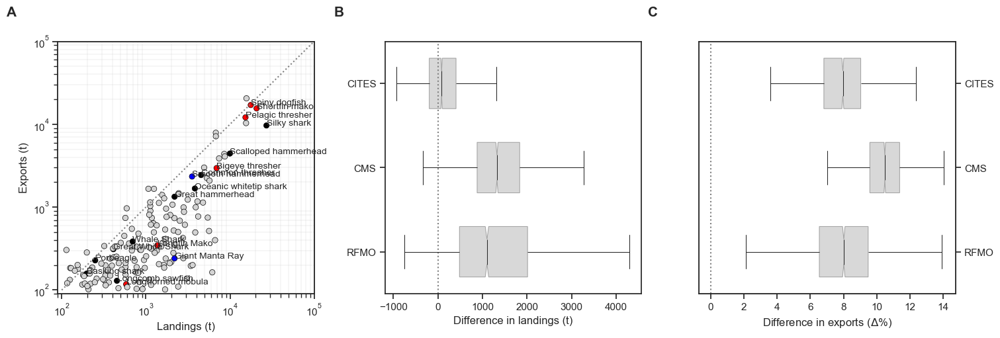

In [354]:
# Set up plot
sns.set_theme(style="ticks", palette="hls")
fsz = 15
#fig, axs = plt.subplots(ncols=2)
fig = plt.figure(figsize=(15,5))
ax0 = fig.add_subplot(131)
ax1 = fig.add_subplot(132)
ax2 = fig.add_subplot(133)

# -------------------------- Plot listing Status
g0 = sns.scatterplot(
    data=mu_tot,
    x="Landings", y="Exports",
    hue="Listing",
    palette=('lightgrey','red','black','blue'),
    edgecolor='black', linewidth=.5,
    legend=None,
    ax=ax0
)

indx = mu_tot.Listing!='Not listed'
label_point(mu_tot.Landings[indx], mu_tot.Exports[indx], mu_tot.Common[indx], ax=g0)

#g0.set(xscale="log", yscale="log", xlim=(90, None), ylim=(90, None))
g0.xaxis.grid(True, "minor", linewidth=.25)
g0.yaxis.grid(True, "minor", linewidth=.25)
g0.set_xlabel('Landings (t)')
g0.set_ylabel('Exports (t)')

# Add 1:1
ax0.plot((100,10e5), (100,10e5), color='grey', linestyle=':', zorder=10)
# Add journal letter
letter_annotation(ax0, -.2, 1.1, 'A', sz=fsz)

# iterate through each axes and increase the linewidth and add a color
ax0.patch.set_linewidth(.5)
ax0.patch.set_edgecolor('black')
ax2.patch.set_linewidth(.5)
ax2.patch.set_edgecolor('black')


g0.set(xscale="log", yscale="log", xlim=(90, 1e5), ylim=(90, 1e5))


# = = = = = = = = = = = DAG and effects on landings
g3 = sns.boxplot(data=list_effects_l, x="value", y="variable", 
                 #color='#FFFFFF00',
                 palette=('#87cefa','#006db0','#000080','grey'),
                 linewidth=.75, showfliers = False,  ax=ax1, widths = 0.6, notch=True)
[patch.set(facecolor='grey', edgecolor='black', alpha=0.3) for patch in g3.patches] 
#sns.stripplot(data=list_effects, x="value", y="variable", palette=('#87cefa','#006db0','#000080','grey'), 
#            edgecolor='black', linewidth=.5, zorder=1, ax=ax2)
ax1.yaxis.set_label_position("right")
#ax2.set_yticklabels(['Not listed', 'CITES listed (c. 2013)', 'Endangered (c. 2020)', 'Both'])
ax1.set_ylabel('')
ax1.set_xlabel('Difference in landings (t)')
#ax1.yaxis.tick_right()
ax1.axvline(x=0,color='grey', linestyle=':', zorder=0)
# Add journal letter
letter_annotation(ax1, -.2, 1.1, 'B', sz=fsz)
#ax1.set_xticks((-1,0,1))


# Inset DAG
"""
# These are in unitless percentages of the figure size. (0,0 is bottom left)
#left, bottom, width, height = [0.7, 0.23, 0.124, 0.225]
left, bottom, width, height = [0.51, 0.15, 0.1, 0.225]
ax4 = fig.add_axes([left, bottom, width, height])
# Turn off axes

G1 = nx.DiGraph(directed=True)G1.add_edges_from(
    [('I', 'C'), ('C', 'L'), ('I', 'L'), ('O', 'L')], width=3)
cdict = {'I':'red', 'C':'blue', 'L':'black', 'O':'black'}
options = {
    'node_color': 'white',
    'node_size': 200,
    'width': 2,
    'arrowstyle': '->',
    'arrowsize': 15,
    "edgecolors": [cdict[i] for i in np.array(G1.nodes)],
    "alpha": 0.7
}
nx.draw_networkx(G1, arrows=True, **options, ax=ax4)
ax4.axis("off")
ax4.margins(.1)
"""
# = = = = = = = = = = = DAG and effects on trade
g2 = sns.boxplot(data=list_effects, x="value", y="variable", 
                 #color='#FFFFFF00',
                 palette=('#87cefa','#006db0','#000080','grey'),
                 linewidth=.75, showfliers = False,  ax=ax2, widths = 0.6, notch=True)
[patch.set(facecolor='grey', edgecolor='black', alpha=0.3) for patch in g2.patches] 
#sns.stripplot(data=list_effects, x="value", y="variable", palette=('#87cefa','#006db0','#000080','grey'), 
#            edgecolor='black', linewidth=.5, zorder=1, ax=ax2)
ax2.yaxis.set_label_position("right")
#ax2.set_yticklabels(['Not listed', 'CITES listed (c. 2013)', 'Endangered (c. 2020)', 'Both'])
ax2.set_ylabel('')
ax2.set_xlabel('Difference in exports ($\Delta$%)')
ax2.yaxis.tick_right()
ax2.axvline(x=0,color='grey', linestyle=':', zorder=0)
# Add journal letter
letter_annotation(ax2, -.2, 1.1, 'C', sz=fsz)
#ax2.axes.get_yaxis().set_visible(False)

# Inset DAG

# These are in unitless percentages of the figure size. (0,0 is bottom left)
#left, bottom, width, height = [0.7, 0.23, 0.124, 0.225]
left, bottom, width, height = [.82, 0.37, 0.1, 0.22]
ax3 = fig.add_axes([left, bottom, width, height])
# Turn off axes
G = nx.DiGraph(directed=True)
G.add_edges_from(
    [('I', 'C'), ('I', 'M'), ('I', 'R'), ('C', 'E'), ('M', 'E'), ('R', 'E'), ('O', 'E')], width=3)
cdict = {'I':'red', 'C':'green', 'M':'blue', 'R':'brown', 'E':'black', 'O':'black'}
options = {
    'node_color': 'white',
    'node_size': 200,
    'width': 2,
    'arrowstyle': '->',
    'arrowsize': 15,
    "edgecolors": [cdict[i] for i in np.array(G.nodes)],
    "alpha": 0.7
}
#nx.draw_networkx(G, arrows=True, **options, ax=ax3)
ax3.axis("off")
#ax3.margins(.1)

#plt.tight_layout()
plt.savefig(bf+'/Global/'+'Landings_vs_trade_CITES_IUCN.jpg',dpi=300);

/var/folders/0t/qrl_lm21285bvxnv0dg58ycm0000gn/T/ipykernel_17296/1287311143.py:69: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.


/var/folders/0t/qrl_lm21285bvxnv0dg58ycm0000gn/T/ipykernel_17296/1287311143.py:89: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.




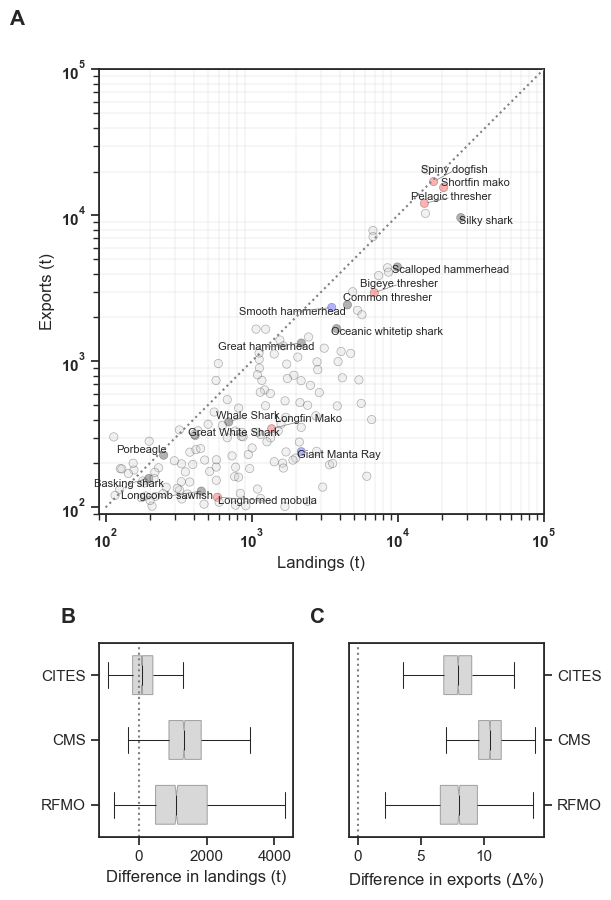

In [355]:
import matplotlib.pyplot as plt
import seaborn as sns
import networkx as nx
import numpy as np
from adjustText import adjust_text

# … (your label_point and letter_annotation functions here) …

# 1) Theme and figure/grid
sns.set_theme(style="ticks", palette="hls")
fsz = 15
fig = plt.figure(figsize=(6, 9))
gs = fig.add_gridspec(
    nrows=2, ncols=2,
    height_ratios=[2, 1],
    width_ratios=[1, 1],
    hspace=0., wspace=0.
)

# Axes
axA = fig.add_subplot(gs[0, :]); axA.set_box_aspect(1)
axB = fig.add_subplot(gs[1, 0]); axB.set_box_aspect(1)
axC = fig.add_subplot(gs[1, 1]); axC.set_box_aspect(1)

# 2) Panel A: faded points + repelled labels
gA = sns.scatterplot(
    data=mu_tot,
    x="Landings", y="Exports",
    hue="Listing",
    palette=("lightgrey","red","black","blue"),
    edgecolor="black", linewidth=.5,
    alpha=0.3,
    legend=None,
    ax=axA
)
gA.set(xscale="log", yscale="log", xlim=(90, 1e5), ylim=(90, 1e5))
gA.xaxis.grid(True, "minor", linewidth=.25)
gA.yaxis.grid(True, "minor", linewidth=.25)

axA.set_xlabel("Landings (t)")
axA.set_ylabel("Exports (t)")
for lbl in axA.get_xticklabels() + axA.get_yticklabels():
    lbl.set_weight("bold")  # still valid via the Text object

axA.plot((100, 1e5), (100, 1e5), color="grey", linestyle=":", zorder=10)

texts = []
for _, row in mu_tot[mu_tot.Listing != "Not listed"].iterrows():
    t = axA.text(
        row.Landings, row.Exports, row.Common,
        fontsize=8,
        ha="center", va="center"
    )
    texts.append(t)

adjust_text(
    texts,
    expand_points=(1.2, 1.2),
    expand_text=(1.2, 1.2),
    arrowprops=dict(arrowstyle="-", color="gray", lw=0.5),
    ax=axA
)

axA.patch.set_linewidth(.5)
axA.patch.set_edgecolor("black")
letter_annotation(axA, -0.2, 1.1, "A", sz=fsz)  # no fontweight here

# 3) Panel B: effects on landings
gB = sns.boxplot(
    data=list_effects_l, x="value", y="variable",
    palette=('#87cefa','#006db0','#000080','grey'),
    linewidth=0.75, showfliers=False,
    widths=0.6, notch=True,
    ax=axB
)
for p in gB.patches:
    p.set(facecolor='grey', edgecolor='black', alpha=0.3)

axB.set_xlabel("Difference in landings (t)")
axB.set_ylabel("")
axB.yaxis.set_label_position("right")
axB.axvline(0, color='grey', linestyle=':', zorder=0)

axB.patch.set_linewidth(.5)
axB.patch.set_edgecolor("black")
letter_annotation(axB, -0.2, 1.1, "B", sz=fsz)

# 4) Panel C: effects on exports + inset DAG
gC = sns.boxplot(
    data=list_effects, x="value", y="variable",
    palette=('#87cefa','#006db0','#000080','grey'),
    linewidth=0.75, showfliers=False,
    widths=0.6, notch=True,
    ax=axC
)
for p in gC.patches:
    p.set(facecolor='grey', edgecolor='black', alpha=0.3)

axC.set_xlabel('Difference in exports ($\\Delta$%)')
axC.set_ylabel("")
axC.yaxis.tick_right()
axC.axvline(0, color='grey', linestyle=':', zorder=0)

axC.patch.set_linewidth(.5)
axC.patch.set_edgecolor("black")
letter_annotation(axC, -0.2, 1.1, "C", sz=fsz)

# inset DAG in C
left, bottom, width, height = 0.82, 0.37, 0.1, 0.22
axD = fig.add_axes([left, bottom, width, height])
G = nx.DiGraph()
G.add_edges_from([
    ('I','C'),('I','M'),('I','R'),
    ('C','E'),('M','E'),('R','E'),
    ('O','E')
])
# … (draw your DAG here) …
axD.axis("off")

# 5) Save and show
plt.savefig(
    bf + '/Global/Landings_vs_trade_CITES_IUCN.pdf',
    dpi=300, bbox_inches='tight'
)
plt.show()


In [356]:
list_effects_l.value[list_effects_l.variable=='CITES'].quantile((0.5,0.05,0.95)).values

array([  84.0521339 , -499.41785371, 1058.38841224])

In [357]:
list_effects_l.value[list_effects_l.variable=='CMS'].quantile((0.5,0.05,0.95)).values

array([1326.2076798 ,  391.85394555, 2782.73341459])

In [358]:
list_effects_l.value[list_effects_l.variable=='RFMO'].quantile((0.5,0.05,0.95)).values

array([1102.51581631, -141.20029216, 3891.94653207])

In [187]:
list_effects.value[list_effects.variable=='CITES'].quantile((0.5,0.05,0.95)).values

array([ 7.95405659,  5.30623366, 10.66310716])

In [188]:
list_effects.value[list_effects.variable=='CMS'].quantile((0.5,0.05,0.95)).values

array([10.48008889,  8.28796924, 12.64853699])

In [189]:
list_effects.value[list_effects.variable=='RFMO'].quantile((0.5,0.05,0.95)).values

array([ 8.01199724,  4.34257268, 11.52179113])

/var/folders/0t/qrl_lm21285bvxnv0dg58ycm0000gn/T/ipykernel_17296/4058973426.py:32: UserWarning:

The figure layout has changed to tight



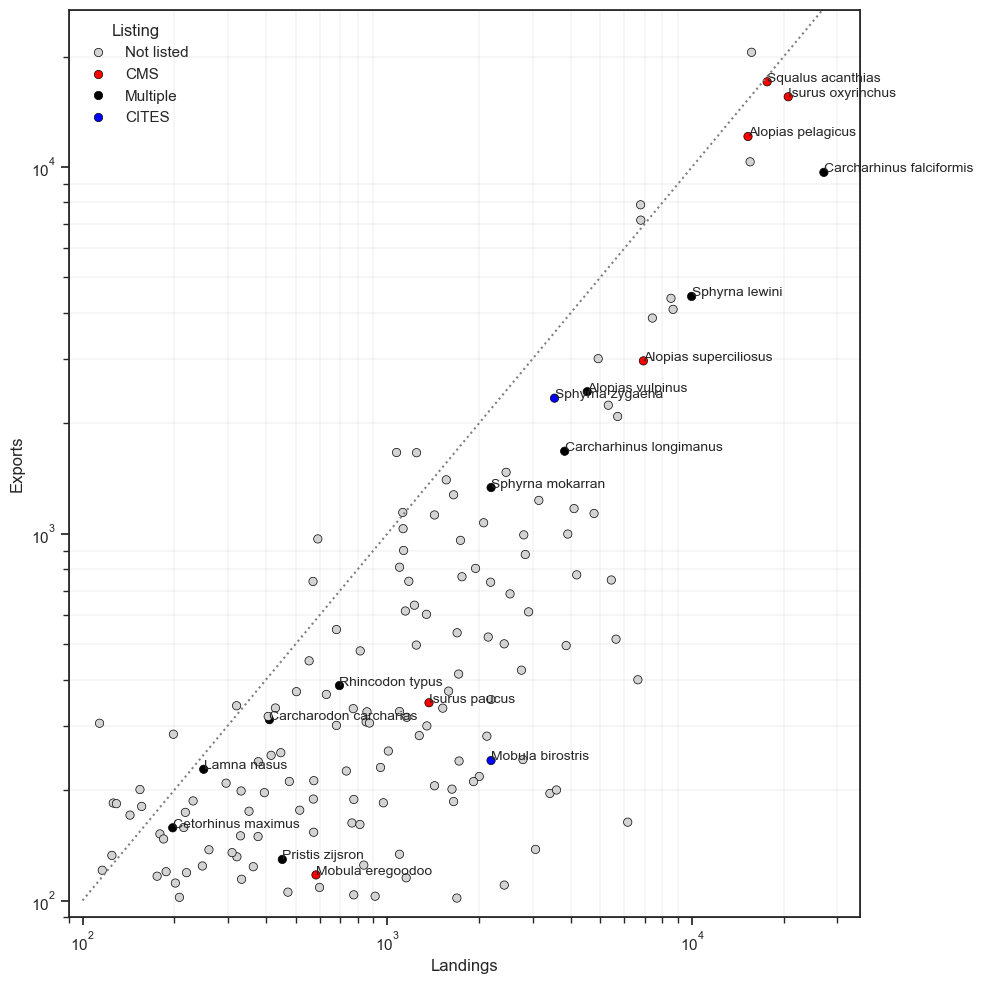

In [190]:
# Set up plot
sns.set_theme(style="ticks", palette="hls")

#fig, axs = plt.subplots(ncols=2)
fig = plt.figure(figsize=(10,10))
ax0 = fig.add_subplot(111)
#ax2 = fig.add_subplot(122)

# -------------------------- Plot CITES Status
g0 = sns.scatterplot(
    data=mu_tot,
    x="Landings", y="Exports",
    hue="Listing",
    palette=('lightgrey','red','black','blue'),
    edgecolor='black', linewidth=.5,
    #legend=None,
    ax=ax0
)
g0.set(xscale="log", yscale="log", xlim=(90, None), ylim=(90, None))
g0.xaxis.grid(True, "minor", linewidth=.25)
g0.yaxis.grid(True, "minor", linewidth=.25)
# Add 1:1
ax0.plot((100,10e5), (100,10e5), color='grey', linestyle=':', zorder=10)

indx = mu_tot.Listing!='Not listed'
label_point(mu_tot.Landings[indx], mu_tot.Exports[indx], mu_tot.species[indx], ax=g0)

# iterate through each axes and increase the linewidth and add a color
ax0.patch.set_linewidth(.5)
ax0.patch.set_edgecolor('black')

plt.tight_layout()
plt.savefig(bf+'/Global/'+'Landings_vs_trade_CITES_IUCN_labels.jpg',dpi=300);

In [191]:
mu_tot[np.array(['Sphyrna' in s for s in mu_tot.species])]

,species,CITES,CITES22,IUCN,IUCN13,IUCN_vu,IUCN13_vu,Common,CMS,RFMO,Landings,Group,Exports,Exports/Landings,Listing
572,Sphyrna lewini,Listed,Listed,Endangered,Endangered,VUENCR,VUENCR,Scalloped hammerhead,Listed,Not listed,9968.646014,sharks,4436.052352,0.445000,Multiple
574,Sphyrna mokarran,Listed,Listed,Endangered,Endangered,VUENCR,VUENCR,Great hammerhead,Listed,Not listed,2191.418355,sharks,1336.494098,0.609876,Multiple
575,Sphyrna tiburo,Not listed,Listed,Endangered,Not,VUENCR,Not,Placeholder for the names of fishes,Not listed,Not listed,813.302719,sharks,161.191789,0.198194,Not listed
577,Sphyrna zygaena,Listed,Listed,Not,Not,VUENCR,VUENCR,Smooth hammerhead,Not listed,Not listed,3538.543443,sharks,2342.371312,0.661959,CITES


In [192]:
mu_tot[np.array(['Mustelus' in s for s in mu_tot.species])]

,species,CITES,CITES22,IUCN,IUCN13,IUCN_vu,IUCN13_vu,Common,CMS,RFMO,Landings,Group,Exports,Exports/Landings,Listing
354,Mustelus asterias,Not listed,Not listed,Not,Not,Not,Not,Placeholder for the names of fishes,Not listed,Not listed,573.999378,sharks,212.214095,0.369711,Not listed
356,Mustelus canis,Not listed,Not listed,Not,Not,Not,Not,Placeholder for the names of fishes,Not listed,Not listed,1124.197157,sharks,1142.763894,1.016516,Not listed
359,Mustelus griseus,Not listed,Not listed,Endangered,Not,VUENCR,Not,Placeholder for the names of fishes,Not listed,Not listed,143.150496,sharks,170.930035,1.194058,Not listed
360,Mustelus henlei,Not listed,Not listed,Not,Not,Not,Not,Placeholder for the names of fishes,Not listed,Not listed,776.199683,sharks,103.624481,0.133502,Not listed
362,Mustelus lenticulatus,Not listed,Not listed,Not,Not,Not,Not,Placeholder for the names of fishes,Not listed,Not listed,1428.603642,sharks,1124.973388,0.787464,Not listed
364,Mustelus manazo,Not listed,Not listed,Endangered,Not,VUENCR,Not,Placeholder for the names of fishes,Not listed,Not listed,331.404383,sharks,198.909945,0.600203,Not listed
367,Mustelus mosis,Not listed,Not listed,Not,Not,Not,Not,Placeholder for the names of fishes,Not listed,Not listed,1158.382777,sharks,315.852645,0.272667,Not listed
368,Mustelus mustelus,Not listed,Not listed,Endangered,Not,VUENCR,VUENCR,Placeholder for the names of fishes,Not listed,Not listed,6789.899186,sharks,7160.830967,1.054630,Not listed
371,Mustelus punctulatus,Not listed,Not listed,Not,Not,VUENCR,Not,Placeholder for the names of fishes,Not listed,Not listed,516.103816,sharks,176.302096,0.341602,Not listed
373,Mustelus schmitti,Not listed,Not listed,Endangered,Endangered,VUENCR,VUENCR,Placeholder for the names of fishes,Not listed,Not listed,4101.262999,sharks,1171.020030,0.285527,Not listed


In [193]:
mu_tot[np.array(['longimanus' in s for s in mu_tot.species])]

,species,CITES,CITES22,IUCN,IUCN13,IUCN_vu,IUCN13_vu,Common,CMS,RFMO,Landings,Group,Exports,Exports/Landings,Listing
107,Carcharhinus longimanus,Listed,Listed,Endangered,Not,VUENCR,VUENCR,Oceanic whitetip shark,Not listed,Listed,3820.248229,sharks,1678.548102,0.439382,Multiple


## Percent listed exports per country

In [194]:
# Species >100t not blue shark
spp_100_noBS = spp_100[spp_100!='Prionace glauca'].values

In [195]:
spp_100_noBS

array(['Acroteriobatus salalah', 'Aetobatus narinari',
       'Aetobatus narutobiei', 'Aetobatus ocellatus',
       'Aetomylaeus maculatus', 'Aetomylaeus nichofii',
       'Alopias pelagicus', 'Alopias superciliosus', 'Alopias vulpinus',
       'Amblyraja hyperborea', 'Amblyraja radiata',
       'Atelomycterus marmoratus', 'Bathyraja spinicauda',
       'Bathytoshia lata', 'Beringraja binoculata',
       'Carcharhinus acronotus', 'Carcharhinus albimarginatus',
       'Carcharhinus amblyrhynchos', 'Carcharhinus amboinensis',
       'Carcharhinus brachyurus', 'Carcharhinus brevipinna',
       'Carcharhinus dussumieri', 'Carcharhinus falciformis',
       'Carcharhinus hemiodon', 'Carcharhinus leucas',
       'Carcharhinus limbatus', 'Carcharhinus longimanus',
       'Carcharhinus macloti', 'Carcharhinus melanopterus',
       'Carcharhinus obscurus', 'Carcharhinus plumbeus',
       'Carcharhinus sealei', 'Carcharhinus signatus',
       'Carcharhinus sorrah', 'Carcharias taurus',
       'Ca

In [196]:
# Select top 10 trading countires
tmp = trade_spp.sel(species=spp_100_noBS).sum(('species','importer')).median(('chain','draw'))
tmp = tmp.sortby(tmp, ascending=False)
cou_ex = tmp[tmp>np.quantile(tmp,0.60)].exporter[:10]

tmp = trade_spp.sel(species=spp_100_noBS).sum(('species','exporter')).median(('chain','draw'))
tmp = tmp.sortby(tmp, ascending=False)
cou_im = tmp[tmp>np.quantile(tmp,0.60)].importer[:10]

# Grab countires
trade_cou = np.unique(list(cou_im.values)+list(cou_ex.values))

In [197]:
# Exports
spp_exports = trade_spp.sel(exporter=trade_cou).sum(('importer')).rename("").assign_coords({"CITES": ("species", CITES), 
                            "CITES22": ("species", CITES22)}).sel(species=spp_100_noBS)
listed_exports = spp_exports[:,:,:,spp_exports.CITES=='Listed']
unlisted_exports = spp_exports[:,:,:,spp_exports.CITES!='Listed']
prop_listed_exports = listed_exports.sum('species')/spp_exports.sum('species')

# Imports
spp_imports = trade_spp.sel(importer=trade_cou).sum(('exporter')).rename("").assign_coords({"CITES": ("species", CITES), 
                            "CITES22": ("species", CITES22)}).sel(species=spp_100_noBS)
listed_imports = spp_imports[:,:,spp_imports.CITES=='Listed',:]
unlisted_imports = spp_imports[:,:,spp_imports.CITES!='Listed',:]
prop_listed_imports = listed_imports.sum('species')/spp_imports.sum('species')

In [198]:
plot_order_ex = prop_listed_exports.sortby(prop_listed_exports.sum(('chain','draw')), ascending=False).exporter
plot_order_im = prop_listed_imports.sortby(prop_listed_imports.sum(('chain','draw')), ascending=False).importer

In [199]:
# Habitat
hdata['Group'] = hdata.Superorder.values
maskx = hdata.Group=='Batoidea'
hdata.loc[maskx,'Group'] = 'Rays'
maskx = hdata.Group=='Selachimorpha'
hdata.loc[maskx,'Group'] = 'Sharks'
hdata['HabitatGroup'] = np.array([x+' '+y for x,y in zip(hdata.PrimaryHabitat.values, hdata.Group.values)])
Habitat_ = hdata.HabitatGroup.values[match(species_a,list(hdata.species_binomial.values))]
Habitat = hdata.Dulvy_priority.values[match(species_a,list(hdata.species_binomial.values))]

In [200]:
# Exports
spp_exports = (trade_spp.sel(exporter=plot_order_ex).sum(('importer'))
               .rename("").assign_coords({"IUCN": ("species", IUCN)})
               .assign_coords({"Habitat": ("species", Habitat)})
               .assign_coords({"CITES": ("species", CITES)})
                .assign_coords({"CITES22": ("species", CITES22)})
                .assign_coords({"IUCN_vu": ("species", IUCN_vu)})
              ).sel(species=spp_100_noBS)
tmp_ex = (spp_exports.to_dataframe(name='trade').reset_index()
          .groupby(['Exporter','IUCN','chain','draw']).sum()
          .reset_index().drop(columns=['exporter','Group','species'])
         )
# Imports
spp_imports = (trade_spp.sel(importer=plot_order_im).sum(('exporter')).rename("")
               .assign_coords({"IUCN": ("species", IUCN)}).assign_coords({"Habitat": ("species", Habitat)})
               .assign_coords({"CITES": ("species", CITES)})
                .assign_coords({"CITES22": ("species", CITES22)})
                .assign_coords({"IUCN_vu": ("species", IUCN_vu)})
              ).sel(species=spp_100_noBS)
tmp_im = (spp_imports.to_dataframe(name='trade').reset_index()
          .groupby(['Importer','IUCN','chain','draw']).sum()
          .reset_index().drop(columns=['importer','Group','species'])
         )

tmp_im.Importer.loc[tmp_im.Importer=='Rep. of Korea'] = 'South Korea'
plot_order_imx = plot_order_im
maskx = plot_order_imx.Importer=='Rep. of Korea'
plot_order_imx.Importer.loc[maskx] = 'South Korea'

/var/folders/0t/qrl_lm21285bvxnv0dg58ycm0000gn/T/ipykernel_17296/4225888564.py:25: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [201]:
# Order for IUCN categories
cat_ord = ['CR', 'EN', 'VU', 'NT', 'LC', 'DD']

In [202]:
plot_order_exx = plot_order_ex.copy()
plot_order_exx.Exporter.loc[plot_order_exx.Exporter=='Other Asia, nes'] = 'Taiwan'

In [203]:
# Original subset of countries for species exports
#spp_exports = trade_spp.sel(exporter=plot_order_ex).sum(('importer')).rename("").assign_coords({"IUCN": ("species", IUCN)}).assign_coords({"Habitat": ("species", Habitat)}).assign_coords({"CITES": ("species", CITES)})
# Exports all countries
spp_exports = (trade_spp.sum(('importer')).rename("").assign_coords({"IUCN": ("species", IUCN)})
               .assign_coords({"IUCN": ("species", IUCN)})
               .assign_coords({"IUCN_vu": ("species", IUCN_vu)})
               .assign_coords({"Habitat": ("species", Habitat)})
               .assign_coords({"CITES": ("species", CITES)})
               .assign_coords({"CITES22": ("species", CITES22)})
               .sel(species=spp_100_noBS)
              )

# Domestic retention all countries
spp_domestic = (domestic_spp.sum(('importer')).rename("").assign_coords({"IUCN": ("species", IUCN)})
               .assign_coords({"IUCN": ("species", IUCN)})
               .assign_coords({"IUCN_vu": ("species", IUCN_vu)})
               .assign_coords({"Habitat": ("species", Habitat)})
               .assign_coords({"CITES": ("species", CITES)})
               .assign_coords({"CITES22": ("species", CITES22)})
               .sel(species=spp_100_noBS)
              )

In [204]:

#"""
# Habitat ordering - DULVY categories
hab_ord = ['Tropical rays', 'Tropical requiem sharks', 'Skates', 
           'Deepwater sharks', 'Other', 'Hammerhead sharks', 
           'Epipelagic sharks', 'Smoothhounds, dogfish, tope']
# Habitat colouring
hab_col = ['#d2b48c', '#654321', '#778899','#000000', 'lightgreen', '#add8e6','dodgerblue', 'mediumorchid']
# Dictonary for habitats and colours
hab_dic = dict(zip(hab_ord, hab_col))

"""

# Habitat ordering - Habitat
hab_ord = ['Coastal Rays', 'Coastal Sharks', 'Deepwater Rays',
            'Deepwater Sharks', 'Freshwater Rays', 'Pelagic Rays',
               'Pelagic Sharks']
# Habitat colouring
hab_col = ['#d2b48c', '#654321', '#333333','#000000', '#FFFFFF', '#add8e6','#00008b']
# Dictonary for habitats and colours
hab_dic = dict(zip(hab_ord, hab_col))
#"""


"\n\n# Habitat ordering - Habitat\nhab_ord = ['Coastal Rays', 'Coastal Sharks', 'Deepwater Rays',\n            'Deepwater Sharks', 'Freshwater Rays', 'Pelagic Rays',\n               'Pelagic Sharks']\n# Habitat colouring\nhab_col = ['#d2b48c', '#654321', '#333333','#000000', '#FFFFFF', '#add8e6','#00008b']\n# Dictonary for habitats and colours\nhab_dic = dict(zip(hab_ord, hab_col))\n#"

In [205]:
spp_exports

<xarray.DataArray '' (chain: 4, draw: 100, exporter: 63, species: 155)>
array([[[[4.89391149e-05, 3.15385130e-02, 4.88907334e-05, ...,
          4.81504246e-05, 4.89246047e-05, 4.25835958e+00],
         [2.89231423e-05, 3.08809790e-05, 3.10021768e-05, ...,
          3.09903830e-05, 3.09305124e-05, 3.09996242e-05],
         [9.69608103e-08, 1.94547877e-06, 1.60522562e-06, ...,
          2.43119781e-03, 4.07010656e-05, 7.30689838e-06],
         ...,
         [7.13735312e-05, 5.92127752e-05, 4.65320218e-05, ...,
          5.05920436e-01, 5.62780570e-07, 7.57658244e-05],
         [3.10592625e-04, 3.06675288e-04, 3.10474346e-04, ...,
          7.66903679e+02, 3.09739071e-04, 3.10581937e-04],
         [7.18391820e-05, 7.20405720e-05, 3.61328567e-05, ...,
          7.20482654e-05, 7.17012406e-05, 3.15704014e-05]],

        [[1.25106630e-04, 9.66641519e+01, 6.75737777e-05, ...,
          5.30886905e-05, 8.48443639e-05, 2.96743959e+00],
         [7.44483389e-05, 7.44486736e-05, 7.42365816e-05, ...,
          7.44447108e-05, 7.39587267e-05, 6.96839547e-05],
         [5.34340679e-08, 3.98506092e-07, 2.01328637e-07, ...,
          4.24127813e-01, 6.29433327e-06, 3.10510609e-06],
...
         [8.82105936e-05, 4.46260084e-05, 8.77282663e-05, ...,
          2.48926750e-01, 8.84863271e-05, 8.67395271e-05],
         [2.03732933e-04, 2.10956570e-04, 5.01462852e-05, ...,
          3.81762699e+00, 1.20857682e-04, 3.37862630e-06],
         [2.67230043e-06, 5.29899273e-08, 3.67065089e-05, ...,
          7.02494852e-05, 7.38004938e-05, 3.76356408e-05]],

        [[1.10908666e-04, 4.91193013e+00, 1.00453793e-04, ...,
          2.15584894e-07, 1.33896223e-04, 1.33474950e+02],
         [1.35997739e-05, 2.22940120e-05, 5.04008142e-05, ...,
          3.27282473e-05, 2.19880061e-06, 1.94442900e-05],
         [3.68655903e-07, 5.76953059e-05, 2.71996125e-07, ...,
          7.70561581e-03, 9.45358478e-06, 1.29817242e-08],
         ...,
         [1.16040884e-04, 1.67770585e-04, 9.52420246e-05, ...,
          3.14560988e-01, 9.00048316e-05, 1.66441279e-04],
         [1.45241659e-05, 7.01463912e-07, 6.50292722e-05, ...,
          9.34206532e-03, 4.11383930e-05, 7.94758824e-05],
         [5.52253294e-05, 5.52696663e-05, 5.53241441e-05, ...,
          5.44759851e-05, 5.32414293e-05, 5.53090032e-05]]]])
Coordinates:
  * chain     (chain) int64 0 1 2 3
  * draw      (draw) int64 0 1 2 3 4 5 6 7 8 9 ... 90 91 92 93 94 95 96 97 98 99
  * exporter  (exporter) <U3 'AGO' 'ARG' 'AUS' 'BEL' ... 'VNM' 'VUT' 'YEM' 'ZAF'
  * species   (species) <U33 'Acroteriobatus salalah' ... 'Zanobatus schoenle...
    Exporter  (exporter) object 'Angola' 'Argentina' ... 'Yemen' 'South Africa'
    Group     (species) object 'rays' 'rays' 'rays' ... 'sharks' 'rays' 'rays'
    IUCN      (species) <U10 'Not' 'Endangered' 'Not' ... 'Not' 'Not' 'Not'
    IUCN_vu   (species) <U6 'Not' 'VUENCR' 'VUENCR' ... 'VUENCR' 'VUENCR'
    Habitat   (species) object 'Other' 'Tropical rays' ... 'Tropical rays'
    CITES     (species) <U10 'Not listed' 'Not listed' ... 'Not listed'
    CITES22   (species) <U10 'Listed' 'Not listed' ... 'Not listed' 'Not listed'

/var/folders/0t/qrl_lm21285bvxnv0dg58ycm0000gn/T/ipykernel_17296/1262080775.py:30: UserWarning:

set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.



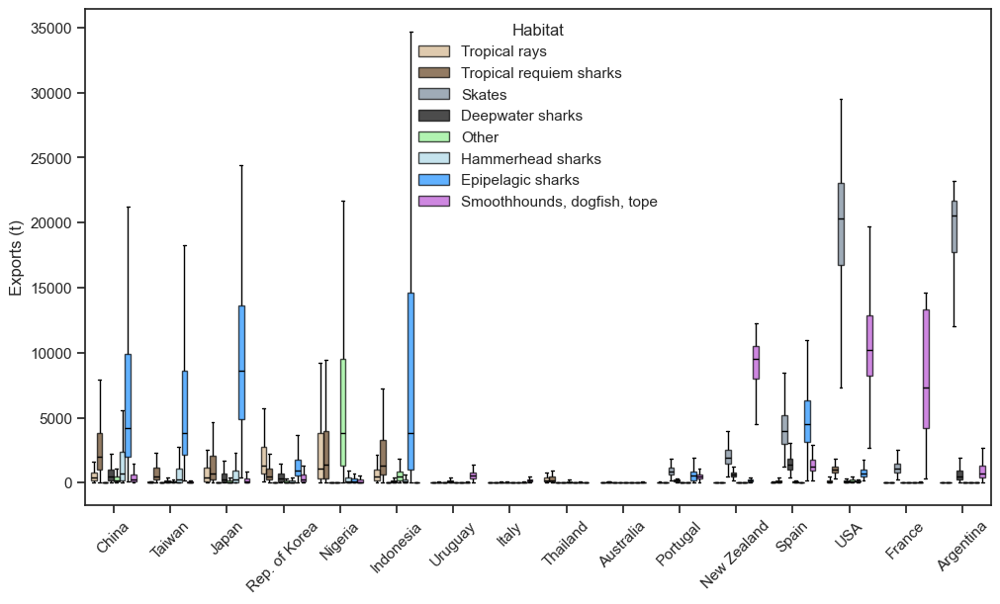

In [206]:
tmp_exH = (spp_exports
           #.drop_sel(species='Prionace glauca')
           .to_dataframe(name='trade').reset_index()
           .groupby(['Exporter','Habitat','chain','draw']).sum()
           .reset_index().drop(columns=['exporter','Group','species'])

          )
# = = = = = Set up plot
_, ax = plt.subplots(1,1,figsize=(10, 6))

# Set colour pallette
sns.set_theme(style="ticks", palette="hls")

# Draw a nested boxplot to show bills by day and time
sns.boxplot(x="Exporter", y="trade",
            hue="Habitat", 
            hue_order=hab_ord,
            palette=hab_col,
            saturation=1,
            data=tmp_exH,
            showfliers=False,
            order=plot_order_ex.Exporter.values,
            ax=ax, 
            boxprops=dict(alpha=.7)
           ).set(
    xlabel='', 
    ylabel='Exports (t)',
)

ax.set_xticklabels(plot_order_exx.Exporter.values, rotation=45);
plt.savefig(bf+'/Global/'+'Exports_vs_Habitat_by_Country.jpg',dpi=300);

In [207]:
# Grab trade without blue sharks
trade_noBS = (spp_exports
              #.drop_sel(species='Prionace glauca')
           .to_dataframe(name='trade').reset_index()
             .drop(columns=['IUCN','CITES','IUCN_vu','CITES22','Group'])
)
trade_HAB = trade_noBS.drop(columns=['exporter','species','Exporter']).groupby(['Habitat','chain','draw']).sum().reset_index()

# Grab domestic without blue sharks
domestic_noBS = (spp_domestic
              #.drop_sel(species='Prionace glauca')
           .to_dataframe(name='trade').reset_index()
             .drop(columns=['IUCN','CITES','IUCN_vu','CITES22','Group'])
)
domestic_HAB = domestic_noBS.drop(columns=['exporter','species','Exporter']).groupby(['Habitat','chain','draw']).sum().reset_index()

In [208]:
# Calculate order by habtiat group
plot_order_habitat = ((spp_exports
                       #.drop_sel(species='Prionace glauca')
            .mean(('chain','draw','exporter')).to_dataframe(name='trade').reset_index()
            .groupby(['Habitat']).sum()).reset_index().drop(columns=['species','Group','IUCN','CITES','IUCN_vu','CITES22'])
            .sort_values(by='trade').Habitat.values
                     )[::-1]

In [209]:
# Grab reported composition of species
sdata['Habitat'] = hdata.Dulvy_priority.values[match(sdata.species,list(hdata.species_binomial))]
#sdata['Habitat'] = hdata.HabitatGroup.values[match(sdata.species,list(hdata.species_binomial))]
sdata['Reported_species_landings'] = np.exp(sdata.logReported_species_landings)

In [210]:
hprops_old = sdata.groupby('Habitat').sum().drop(columns=['year_spp_id','species_spp_id',
                                             'logReported_species_landings','country',
                                             'year','species','country_spp_id']).loc[plot_order_habitat[:-1]]
hprops_old = hprops_old.Reported_species_landings/hprops_old.Reported_species_landings.sum()

In [211]:
hprops_new = trade_HAB.drop(columns=['draw','chain']).groupby('Habitat').mean().loc[plot_order_habitat]
hprops_new = hprops_new.trade/hprops_new.trade.sum()

In [212]:
# Net difference in species compositions between landings and trade
props_diff = (hprops_new-hprops_old).loc[plot_order_habitat]
# Deal with freshwater rays
props_diff[np.isnan(props_diff)] = 0

In [213]:
# Grab 2020 IUCN status
tmp = rdata.Rlcategory[match(trade_noBS.species,list(rdata.species_a))].to_numpy()

In [214]:
np.array(['Not','VUENCR'])[((tmp=='CR') + (tmp=='EN') + (tmp=='VU'))*1]

array(['Not', 'VUENCR', 'VUENCR', ..., 'VUENCR', 'VUENCR', 'VUENCR'],
      dtype='<U6')

In [215]:
# Make endangered and critically endangered 
trade_noBS['iucn'] = np.array(['Not','Endangered'])[((tmp=='CR') + (tmp=='EN'))*1]
trade_noBS['iucn_vu'] = np.array(['Not','VUENCR'])[((tmp=='CR') + (tmp=='EN') + (tmp=='VU'))*1]

In [216]:
trade_noBS

,chain,draw,exporter,species,Exporter,Habitat,trade,iucn,iucn_vu
0,0,0,AGO,Acroteriobatus salalah,Angola,Other,0.000049,Not,Not
1,0,0,AGO,Aetobatus narinari,Angola,Tropical rays,0.031539,Endangered,VUENCR
2,0,0,AGO,Aetobatus narutobiei,Angola,Tropical rays,0.000049,Not,VUENCR
3,0,0,AGO,Aetobatus ocellatus,Angola,Tropical rays,0.000049,Not,VUENCR
4,0,0,AGO,Aetomylaeus maculatus,Angola,Tropical rays,0.000049,Endangered,VUENCR
...,...,...,...,...,...,...,...,...,...
3905995,3,99,ZAF,Torpedo mackayana,South Africa,Other,0.000055,Endangered,VUENCR
3905996,3,99,ZAF,Torpedo marmorata,South Africa,Other,0.000005,Not,VUENCR
3905997,3,99,ZAF,Triaenodon obesus,South Africa,Tropical requiem sharks,0.000054,Not,VUENCR
3905998,3,99,ZAF,Urogymnus asperrimus,South Africa,Tropical rays,0.000053,Not,VUENCR


In [217]:
trade_noBS_hi = (trade_noBS.drop(columns=['exporter','species','Exporter','iucn'])
                 .groupby(['chain','draw','Habitat','iucn_vu']).sum()
                 .reset_index())
domestic_noBS_hi = (domestic_noBS.drop(columns=['exporter','species','Exporter'])
                 .groupby(['chain','draw','Habitat']).sum()
                 .reset_index())

In [218]:
# Global proporiton of endangered 2020 species in 2012-2019 meat trade
tmp = trade_noBS_hi.groupby('iucn_vu').mean('trade')
tmp['prop'] = tmp.trade/sum(tmp.trade)
tmp

,chain,draw,trade,prop
iucn_vu,,,,
Not,1.5,49.5,8585.226683,0.240503
VUENCR,1.5,49.5,27111.678679,0.759497


In [219]:
# Domestic retention totals by habitat
domestic_hab = (domestic_noBS_hi.drop(columns=['chain','draw'])
                 .groupby(['Habitat']).median()
                 )

In [220]:
trade_noBS_hi.drop(columns=['chain','draw']).drop(columns='iucn_vu').groupby(['Habitat']).median().reset_index().sort_values(by='trade')

,Habitat,trade
0,Deepwater sharks,4361.553178
6,Tropical rays,8086.711334
2,Hammerhead sharks,10550.588954
3,Other,13017.092333
7,Tropical requiem sharks,13645.358990
1,Epipelagic sharks,17718.478626
5,"Smoothhounds, dogfish, tope",20967.516373
4,Skates,28434.383491


In [221]:
tmp = trade_noBS_hi.drop(columns=['chain','draw']).groupby(['Habitat','iucn_vu']).median().reset_index()
trad_hab_en = tmp[tmp.iucn_vu=='VUENCR'][['Habitat','trade']].set_index('Habitat')
trad_hab_no = tmp[tmp.iucn_vu!='VUENCR'][['Habitat','trade']].set_index('Habitat')
trad_hab_no.loc['Hammerhead sharks'] = [0]
trad_hab_no.loc['Tropical rays'] = [0]
trad_hab_no = trad_hab_no.loc[trad_hab_en.index]

In [222]:
# Create IUCN pie for habitat plot
piedata_H = trad_hab_en
piedata_H['Threatened'] = trad_hab_en.trade.values
piedata_H['Not_threatened'] = trad_hab_no.trade.values
piedata_H['trade'] = trad_hab_en.trade.values+trad_hab_no.trade.values
piedata_H['Threatened_prop'] = piedata_H.Threatened.values/(piedata_H.Threatened.values+piedata_H.Not_threatened.values)
piedata_H['Not_prop'] = piedata_H.Not_threatened.values/(piedata_H.Threatened.values+piedata_H.Not_threatened.values)
piedata_H['retained'] = domestic_hab.trade.values
piedata_H['Retained_prop'] = piedata_H['retained']/(piedata_H['trade']+piedata_H['retained'])

In [223]:
piedata_H['l90'] = trade_HAB.groupby(['Habitat']).quantile(0.05).trade.values
piedata_H['l50'] = trade_HAB.groupby(['Habitat']).quantile(0.25).trade.values
piedata_H['u50'] = trade_HAB.groupby(['Habitat']).quantile(0.75).trade.values
piedata_H['u90'] = trade_HAB.groupby(['Habitat']).quantile(0.95).trade.values

In [224]:
# Index order
piedata_H['yloc'] = match(piedata_H.index.values,list(plot_order_habitat[::-1]))

In [225]:
# Label with of species per habitat group
piedata_H['ylab'] = piedata_H.index
piedata_H['ylab_n'] = [x+' ('+str(dict(Counter(trade_noBS.Habitat[match(spp_100_noBS,list(trade_noBS.species))]))[x])+')' for x in piedata_H.index.values]

In [226]:
# Colour
piedata_H['col'] = [hab_dic[x] for x in piedata_H.ylab.values]

In [227]:
# Drop freshwater rays
#piedata_H = piedata_H.drop(['Freshwater Rays'], axis='index')

In [228]:
"""
# Get trade by species without blue shark
tmp = (spp_exports
       #.drop_sel(species='Prionace glauca')
       .median(('chain','draw')).to_dataframe().rename(columns={"":'trade'}).reset_index()
      )
tmp = tmp[tmp.trade>100]
tmp['Habitat'] = hdata.Dulvy_priority.values[match(tmp.species,list(hdata.species_binomial))]
#tmp['Habitat'] = hdata.HabitatGroup.values[match(tmp.species,list(hdata.species_binomial))]

# Grab Habitat numbers of species per habitat >100t in trade
values, counts = np.unique(tmp['Habitat'], return_counts=True)
hab_spp_counts = pd.Series(counts,index=values)[piedata_H['ylab'][:-1]]

"""

'\n# Get trade by species without blue shark\ntmp = (spp_exports\n       #.drop_sel(species=\'Prionace glauca\')\n       .median((\'chain\',\'draw\')).to_dataframe().rename(columns={"":\'trade\'}).reset_index()\n      )\ntmp = tmp[tmp.trade>100]\ntmp[\'Habitat\'] = hdata.Dulvy_priority.values[match(tmp.species,list(hdata.species_binomial))]\n#tmp[\'Habitat\'] = hdata.HabitatGroup.values[match(tmp.species,list(hdata.species_binomial))]\n\n# Grab Habitat numbers of species per habitat >100t in trade\nvalues, counts = np.unique(tmp[\'Habitat\'], return_counts=True)\nhab_spp_counts = pd.Series(counts,index=values)[piedata_H[\'ylab\'][:-1]]\n\n'

In [229]:
piedata_H

,trade,Threatened,Not_threatened,Threatened_prop,Not_prop,retained,Retained_prop,l90,l50,u50,u90,yloc,ylab,ylab_n,col
Habitat,,,,,,,,,,,,,,,
Deepwater sharks,8661.309405,4454.063594,4207.245811,0.514248,0.485752,4361.920061,0.334934,5988.516710,7516.922446,11790.413638,16091.154279,0,Deepwater sharks,Deepwater sharks (15),#000000
Epipelagic sharks,59482.901016,59359.263932,123.637084,0.997921,0.002079,46881.571270,0.440763,38404.486422,49589.373406,80559.829304,178789.935046,7,Epipelagic sharks,Epipelagic sharks (13),dodgerblue
Hammerhead sharks,10550.588954,10550.588954,0.000000,1.000000,0.000000,7435.075707,0.413389,4146.712807,7321.379909,16498.155659,27583.870975,1,Hammerhead sharks,Hammerhead sharks (4),#add8e6
Other,23196.000174,18059.361215,5136.638959,0.778555,0.221445,33836.151499,0.593282,13713.123526,19358.610580,34881.564238,50108.651125,3,Other,Other (28),lightgreen
Skates,57329.375584,33466.207046,23863.168539,0.583753,0.416247,7498.405006,0.115667,45857.313301,53180.370124,62826.133718,67656.129665,6,Skates,Skates (23),#778899
"Smoothhounds, dogfish, tope",41396.303351,32606.511993,8789.791358,0.787667,0.212333,11707.371476,0.220463,30956.529806,37727.215675,47783.148920,55105.078003,5,"Smoothhounds, dogfish, tope","Smoothhounds, dogfish, tope (17)",mediumorchid
Tropical rays,15358.261810,15358.261810,0.000000,1.000000,0.000000,66360.579900,0.812060,10146.744471,13744.642075,25201.430108,34572.934046,2,Tropical rays,Tropical rays (26),#d2b48c
Tropical requiem sharks,27307.437791,21011.790627,6295.647164,0.769453,0.230547,41159.619385,0.601159,18195.926625,23182.054736,34523.713709,46323.960732,4,Tropical requiem sharks,Tropical requiem sharks (29),#654321


In [230]:
# Proportion of meat trade that are threatened species
sum(piedata_H.Threatened)/sum(piedata_H.trade)

0.8009877694462069

In [374]:
props_diff.rename(index={'Epipelagic sharks': 'Pelagic sharks'}, inplace=True)
piedata_H.rename(index={'Epipelagic sharks': 'Pelagic sharks'}, inplace=True)
piedata_H.ylab[piedata_H.ylab=='Epipelagic sharks'] = 'Pelagic sharks'
piedata_H.ylab_n[piedata_H.ylab_n=='Epipelagic sharks (13)'] = 'Pelagic sharks (13)'

/var/folders/0t/qrl_lm21285bvxnv0dg58ycm0000gn/T/ipykernel_17296/778753151.py:3: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/var/folders/0t/qrl_lm21285bvxnv0dg58ycm0000gn/T/ipykernel_17296/778753151.py:4: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [379]:
plot_order_habitat[plot_order_habitat=='Epipelagic sharks'] = 'Pelagic sharks'

In [384]:
hab_dic['Pelagic sharks'] = hab_dic.pop('Epipelagic sharks')
hab_dic

{'Tropical rays': '#d2b48c',
 'Tropical requiem sharks': '#654321',
 'Skates': '#778899',
 'Deepwater sharks': '#000000',
 'Other': 'lightgreen',
 'Hammerhead sharks': '#add8e6',
 'Smoothhounds, dogfish, tope': 'mediumorchid',
 'Pelagic sharks': 'dodgerblue'}

In [380]:
props_diff

Habitat
Pelagic sharks                -0.378823
Skates                         0.085161
Smoothhounds, dogfish, tope   -0.007464
Tropical requiem sharks        0.077156
Other                          0.078893
Tropical rays                  0.064444
Hammerhead sharks              0.044432
Deepwater sharks               0.000000
dtype: float64

In [381]:
piedata_H

,trade,Threatened,Not_threatened,Threatened_prop,Not_prop,retained,Retained_prop,l90,l50,u50,u90,yloc,ylab,ylab_n,col
Habitat,,,,,,,,,,,,,,,
Deepwater sharks,8661.309405,4454.063594,4207.245811,0.514248,0.485752,4361.920061,0.334934,5988.516710,7516.922446,11790.413638,16091.154279,0,Deepwater sharks,Deepwater sharks (15),#000000
Pelagic sharks,59482.901016,59359.263932,123.637084,0.997921,0.002079,46881.571270,0.440763,38404.486422,49589.373406,80559.829304,178789.935046,7,Pelagic sharks,Pelagic sharks (13),dodgerblue
Hammerhead sharks,10550.588954,10550.588954,0.000000,1.000000,0.000000,7435.075707,0.413389,4146.712807,7321.379909,16498.155659,27583.870975,1,Hammerhead sharks,Hammerhead sharks (4),#add8e6
Other,23196.000174,18059.361215,5136.638959,0.778555,0.221445,33836.151499,0.593282,13713.123526,19358.610580,34881.564238,50108.651125,3,Other,Other (28),lightgreen
Skates,57329.375584,33466.207046,23863.168539,0.583753,0.416247,7498.405006,0.115667,45857.313301,53180.370124,62826.133718,67656.129665,6,Skates,Skates (23),#778899
"Smoothhounds, dogfish, tope",41396.303351,32606.511993,8789.791358,0.787667,0.212333,11707.371476,0.220463,30956.529806,37727.215675,47783.148920,55105.078003,5,"Smoothhounds, dogfish, tope","Smoothhounds, dogfish, tope (17)",mediumorchid
Tropical rays,15358.261810,15358.261810,0.000000,1.000000,0.000000,66360.579900,0.812060,10146.744471,13744.642075,25201.430108,34572.934046,2,Tropical rays,Tropical rays (26),#d2b48c
Tropical requiem sharks,27307.437791,21011.790627,6295.647164,0.769453,0.230547,41159.619385,0.601159,18195.926625,23182.054736,34523.713709,46323.960732,4,Tropical requiem sharks,Tropical requiem sharks (29),#654321


# Figure 2

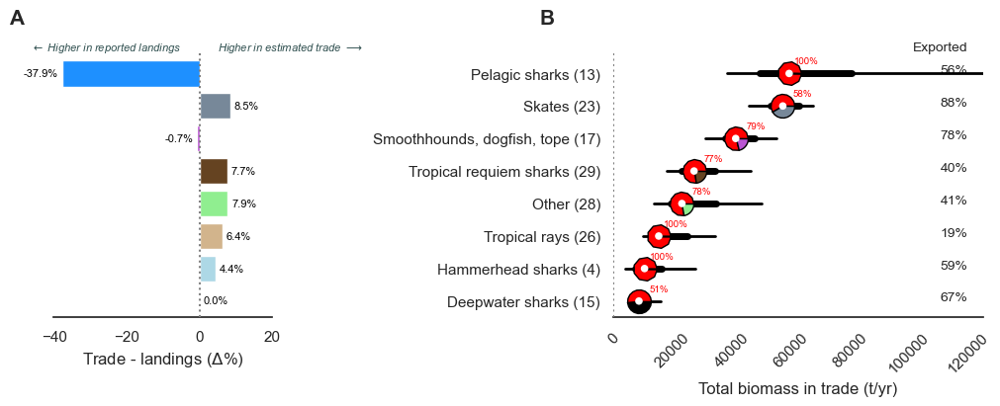

In [385]:
# = = = = = Set up plot
_, ax = plt.subplots(1,2,figsize=(10, 4),width_ratios=(1.3,2.2))

# Set colour pallette
sns.set_style("white")
#sns.set_theme(style="ticks", palette="hls")

# Top location for text
toploc = 7.7

# Barplot of relative change in composition
bars = ax[0].barh(y=np.arange(len(hprops_new)), width=props_diff[::-1]*100, color=[hab_dic[x] for x in plot_order_habitat][::-1],
        )
ax[0].axvline(x=0,color='grey', linestyle=':', zorder=10)

# Annotate each bar with its Δ%
for bar in bars:
    x = bar.get_width()
    y = bar.get_y() + bar.get_height() / 2
    label = f"{x:.1f}%"
    if x < 0:
        # negative: just to the left of zero
        ax[0].text(
            x - 1, y, label,
            va='center', ha='right',
            fontsize=8, color='black'
        )
    else:
        # positive: just to the right of zero
        ax[0].text(
            x + 1, y, label,
            va='center', ha='left',
            fontsize=8, color='black'
        )

ax[0].set_xlabel('Trade - landings ($\Delta$%)', loc='center')
ax[0].axes.get_yaxis().set_visible(False)
ax[0].spines[['left','right','top']].set_color('none')
#ax[0].set_xlim(-40,80)
ax[0].set_ylim(-.5,toploc)
ax[0].set_xticks((-40,-20,0,20))
# Add text
ax[0].text(-5, toploc, '$\leftarrow$ Higher in reported landings', horizontalalignment='right', fontsize=8, style='italic', c='darkslategrey')
ax[0].text(5, toploc, 'Higher in estimated trade '+'$\longrightarrow$', horizontalalignment='left', fontsize=8, style='italic', c='darkslategrey')


# Add journal letter
letter_annotation(ax[0], -.2, 1.1, 'A', sz=fsz)

# Exporters
ax[1].scatter(x=piedata_H['trade'], y=piedata_H['yloc'], s=30, facecolor='white', edgecolors='none', zorder=11)
ax[1].plot((piedata_H['l90'],piedata_H['u90']), (piedata_H['yloc'],piedata_H['yloc']), c='black', linewidth=2, zorder=9)
ax[1].plot((piedata_H['l50'],piedata_H['u50']), (piedata_H['yloc'],piedata_H['yloc']), c='black', linewidth=5, zorder=9)

for xx,yy,xxr,yyr,c in zip(piedata_H['trade'],
                         piedata_H['yloc'],
                         piedata_H['Threatened_prop'].values,
                         piedata_H['Not_prop'].values-0.001,
                        piedata_H['col'].values):
    drawPieMarker(xs=xx,
                  ys=yy,
                  ratios=[xxr,yyr],
                  sizes=[300],
                  colors=['red', c],
                  #edgecolor='black',
                  ax=ax[1])
tmpx_loc = 120000
[ax[1].text(x+10000,y+0.3,str(np.round(z*100,0).astype(int))+'%',horizontalalignment='right',fontsize=7, color='red') for x,y,z in zip(piedata_H['trade'],piedata_H['yloc'].values, piedata_H['Threatened_prop'].values)]
[ax[1].text(tmpx_loc,y,str(np.round((1-z)*100,0).astype(int))+'%',horizontalalignment='right',fontsize=10) for y,z in zip(piedata_H['yloc'].values, piedata_H['Retained_prop'].values)]
ax[1].text(tmpx_loc,toploc,"Exported", ha='right', fontsize=10)
ax[1].set_yticks(np.arange(len(piedata_H['ylab'])))
ax[1].set_yticklabels(piedata_H.ylab_n.values[match(list(plot_order_habitat),list(piedata_H.ylab),)][::-1])
#[tk.set_visible(True) for tk in ax[1].get_yticklabels()]
ax[1].set_xlabel('Total biomass in trade (t/yr)')
ax[1].set_ylim(-.5,toploc)
ax[1].set_xlim(-.5,125000)
#ax[1].set_title('')
#ax[1].legend_.remove()
#legend_elements = [patches.Patch(facecolor='red', label='endangered c.2020')]
#ax[1].legend(handles=legend_elements, loc='lower right', bbox_to_anchor=(1.8, .00))
ax[1].axvline(x=0,color='grey', linestyle=':', zorder=10)
ax[1].tick_params(axis='x', labelrotation=45)
ax[1].spines[['left','right','top']].set_color('none')
# Add journal letter
letter_annotation(ax[1], -.2, 1.1, 'B', sz=fsz)

#plt.tight_layout(pad=0.4)
#ADD NUMBER OF SPECIES>100t IN PARENTHESES NEXT TO GROUP
plt.savefig(bf+'/Global/'+'Exports_vs_Habitat.jpg',dpi=300);

## Skates

In [233]:
trade_spp.sel(species=['Raja clavata','Raja undulata','Raja asterias','Raja brachyura']).median(('chain','draw')).sum(('importer','exporter'))

<xarray.DataArray '' (species: 4)>
array([2003.37085373,   18.81939471,    9.15280191,  728.88142889])
Coordinates:
  * species  (species) <U33 'Raja clavata' 'Raja undulata' ... 'Raja brachyura'
    Group    (species) object 'rays' 'rays' 'rays' 'rays'

## Plot strong demand scores among top trading nations

In [234]:
spp_demand = trade_spp.sel(importer=trade_cou).sum(('importer')).rename("").assign_coords({"CITES": ("species", CITES)})
listed_exports = spp_exports[:,:,:,spp_exports.CITES=='Listed']
unlisted_exports = spp_exports[:,:,:,spp_exports.CITES!='Listed']
prop_listed_exports = listed_exports.sum('species')/spp_exports.sum('species')

In [235]:
spp_demand = idata_trade_a.posterior['importer_species_effect'].sel(importer=trade_cou)

In [236]:
# Top trading nations species demand scores
demand_spp = []
demand_c = []
for c in trade_cou:
    # Select top 10% of traded species
    tmp = idata_trade_a.posterior['importer_species_effect'].sel(importer=c).mean(('chain'))
    if np.any(tmp.quantile(0.5,dim='draw')>0):
        try:
            spx = tmp.species[tmp.quantile(0.05,dim='draw')>0].values
            demand_spp += list(spx)
            demand_c += [c]*len(spx)
        except:
            pass
demand_spp = np.array(demand_spp).flatten()
demand_c = np.array(demand_c)

In [237]:
# All trading nations species demand scores
demand_spp_A = []
demand_c_A = []
for c in country_:
    # Select top 10% of traded species
    tmp = idata_trade_a.posterior['importer_species_effect'].sel(importer=c).mean(('chain'))
    if np.any(tmp.quantile(0.5,dim='draw')>0):
        try:
            spx = tmp.species[tmp.quantile(0.05,dim='draw')>0].values
            demand_spp_A += list(spx)
            demand_c_A += [c]*len(spx)
        except:
            pass
demand_spp_A = np.array(demand_spp_A).flatten()
demand_c_A = np.array(demand_c_A)

In [238]:
# Grab IUCN for augmented data
IUCN_t = rdata.Rlcategory[match(idata_trade_a.posterior['importer_species_effect'].species,list(rdata.species_a))].to_numpy()

# Information prioritization

In [239]:
# Add blue shark back in 
spp_100 = spp_100.values
spp_100 = np.append(spp_100,'Prionace glauca')

Reconstruct PsppIdent

In [240]:
# Index flag
isppx = SppPRIOR > -5

# Probability of species ID
PsppIdent_ = pm.math.invlogit(idata_landings_a.posterior['PsppIdent_odds'].values + NoTaxaSppWT[isppx]*10).eval()

In [241]:
# Make full rank - make impossibles guaranteed to be spp ID'd
PsppIdent = np.ones((idata_landings_a.posterior.chain.shape[0],idata_landings_a.posterior.draw.shape[0])+SppPRIOR.shape)

In [242]:
# Assign samples to numpy array
PsppIdent[:,:,isppx] = PsppIdent_

In [243]:
# Make xarray
PsppIdent = xr.DataArray(PsppIdent, 
coords={'species': idata_landings_a.posterior.species,'exporter': idata_landings_a.posterior.exporter,
        'chain': idata_landings_a.posterior.chain, 'draw':idata_landings_a.posterior.draw}, 
dims=["chain", "draw", "exporter", "species"])

In [244]:
# Need to multiply this by 0 where species are impossible (i.e. ==1)

In [245]:
PsppIdent.sel(species=spp_100)

<xarray.DataArray (chain: 4, draw: 1000, exporter: 63, species: 156)>
array([[[[1.        , 0.35352351, 1.        , ..., 1.        ,
          0.14703766, 0.64045454],
         [1.        , 1.        , 1.        , ..., 1.        ,
          1.        , 0.33025321],
         [1.        , 1.        , 1.        , ..., 0.19044827,
          1.        , 0.70364684],
         ...,
         [1.        , 1.        , 1.        , ..., 1.        ,
          1.        , 0.97806282],
         [1.        , 1.        , 1.        , ..., 1.        ,
          1.        , 0.10554986],
         [1.        , 1.        , 1.        , ..., 1.        ,
          1.        , 0.59298327]],

        [[1.        , 0.60796665, 1.        , ..., 1.        ,
          0.40020921, 0.16879896],
         [1.        , 1.        , 1.        , ..., 1.        ,
          1.        , 0.11958839],
         [1.        , 1.        , 1.        , ..., 0.066275  ,
          1.        , 0.5116005 ],
...
         [1.        , 1.        , 1.        , ..., 1.        ,
          1.        , 0.60608888],
         [1.        , 1.        , 1.        , ..., 1.        ,
          1.        , 0.40834195],
         [1.        , 1.        , 1.        , ..., 1.        ,
          1.        , 0.58346542]],

        [[1.        , 0.26138744, 1.        , ..., 1.        ,
          0.70882365, 0.58892032],
         [1.        , 1.        , 1.        , ..., 1.        ,
          1.        , 0.12364339],
         [1.        , 1.        , 1.        , ..., 0.04240721,
          1.        , 0.32480963],
         ...,
         [1.        , 1.        , 1.        , ..., 1.        ,
          1.        , 0.60608888],
         [1.        , 1.        , 1.        , ..., 1.        ,
          1.        , 0.40834195],
         [1.        , 1.        , 1.        , ..., 1.        ,
          1.        , 0.58346542]]]])
Coordinates:
  * species   (species) <U33 'Acroteriobatus salalah' ... 'Prionace glauca'
  * exporter  (exporter) <U3 'AGO' 'ARG' 'AUS' 'BEL' ... 'VNM' 'VUT' 'YEM' 'ZAF'
  * chain     (chain) int64 0 1 2 3
  * draw      (draw) int64 0 1 2 3 4 5 6 7 8 ... 992 993 994 995 996 997 998 999

In [246]:
# Information present for assigning to species in FAO data
IE_obs = -np.log(PsppIdent.sel(species=spp_100))

In [247]:
IUCN_vu[:10]

array(['VUENCR', 'Not', 'VUENCR', 'Not', 'Not', 'Not', 'VUENCR', 'Not',
       'VUENCR', 'VUENCR'], dtype='<U6')

In [248]:
IUCN_all[:10]

array(['VU', 'LC', 'EN', 'DD', 'DD', 'NT', 'CR', 'NT', 'EN', 'VU'],
      dtype=object)

In [249]:
len(IUCN_vu)

679

In [444]:
IE_obs.where(IE_obs != 0.).median(('chain','draw','exporter'))

<xarray.DataArray (species: 156)>
array([1.48342529, 0.75797879, 0.82137916, 0.84741006, 0.86233864,
       0.72555223, 0.68027014, 0.68372622, 0.60452289, 0.55546487,
       0.61704393, 0.68543618, 0.52180254, 0.61554108, 0.36730662,
       0.59007157, 0.71776773, 0.68043475, 0.7387611 , 0.61667468,
       0.69299621, 0.54393883, 0.59747914, 0.71780902, 0.67446723,
       0.68798444, 0.63457778, 0.7345155 , 0.65068563, 0.70777671,
       0.70736174, 0.73015302, 0.61775381, 0.66194074, 0.67847292,
       0.64303766, 0.51674947, 0.52959153, 0.54567471, 0.65485739,
       0.73013929, 0.77374665, 0.49908737, 0.80015615, 0.70598096,
       0.53581882, 0.5048474 , 1.48480193, 1.07223668, 0.01187955,
       0.00607194, 0.40572962, 0.7179216 , 0.50968981, 0.65047264,
       0.31043069, 0.34032724, 0.64491197, 0.67913559, 0.85524722,
       0.60928219, 0.79016703, 0.7345967 , 0.8582225 , 0.64601079,
       0.62153595, 0.75927104, 0.74482624, 0.82868104, 0.70762956,
       0.76624101, 0.41661461, 0.60935255, 0.40230841, 0.65072149,
       0.37511142, 0.64778241, 0.38659494, 0.33321459, 0.88550913,
       0.71049872, 0.78549525, 0.54489304, 0.68939896, 0.74118895,
       0.68848559, 0.62102408, 0.64819596, 0.71967161, 0.62487379,
       0.04184504, 0.6784306 , 0.76028891, 0.58184398, 0.97492385,
       0.11880219, 0.59364454, 0.72558875, 0.77734041, 0.70405044,
       0.61788769, 0.65464416, 0.75825045, 1.07517832, 0.72468205,
       0.66579677, 0.66147087, 0.47015523, 0.18924543, 0.38685896,
       0.33557028, 0.25272711, 0.44882648, 0.72841798, 0.78960315,
       0.69132263, 0.95466164, 0.95136484, 0.83743804, 0.74257296,
       0.5397929 , 0.66341608, 0.78148882, 0.53323511, 0.30869562,
       0.76024773, 0.78165886, 0.71470337, 0.7684671 , 0.56391164,
       0.98178948, 0.74176159, 0.29367954, 0.36144427, 0.77401343,
       0.72150825, 0.74599718, 0.64243411, 0.50265544, 0.7008812 ,
       0.763424  , 0.71574387, 0.71383659, 0.5748603 , 0.10883916,
       0.48171841, 0.74035028, 0.6968561 , 0.75079974, 0.74237925,
       0.72109582, 0.58759679, 0.71534511, 0.74198936, 0.80530214,
       0.36355925])
Coordinates:
  * species  (species) <U33 'Acroteriobatus salalah' ... 'Prionace glauca'

In [445]:
IE_obs.where(IE_obs != 0.).sum(('chain','draw','exporter'))

<xarray.DataArray (species: 156)>
array([2.00151810e+04, 5.92797852e+04, 3.01162980e+04, 5.38988778e+04,
       4.52780019e+04, 1.82495286e+04, 1.07057378e+05, 1.78585129e+05,
       1.54319582e+05, 5.10997802e+04, 4.29494987e+04, 5.59394692e+04,
       1.10241823e+04, 5.60628054e+04, 2.51965798e+03, 4.34664885e+04,
       7.26306570e+04, 7.69756479e+04, 6.30726351e+04, 1.03255256e+05,
       1.24363555e+05, 1.88386848e+04, 1.95898838e+05, 3.01352815e+04,
       1.30323427e+05, 2.03002604e+05, 1.92370275e+05, 6.15893482e+04,
       8.88081904e+04, 1.03435095e+05, 1.72701020e+05, 3.50577192e+04,
       6.00146197e+04, 8.91422723e+04, 1.23488387e+05, 1.49974608e+05,
       6.20399348e+04, 8.20182467e+04, 7.88121485e+04, 1.33205963e+05,
       4.88997289e+04, 5.03740597e+04, 8.53850683e+04, 2.79199244e+04,
       9.26105549e+04, 7.22615614e+04, 6.38590865e+04, 2.23198200e+04,
       5.32199233e+03, 1.27041990e+02, 6.30639281e+01, 4.24999769e+04,
       3.41699615e+04, 6.54613220e+04, 1.93414521e+05, 6.77489291e+04,
       4.36731526e+04, 7.34519328e+04, 5.28668523e+04, 2.99497531e+04,
       8.09455828e+04, 7.03420107e+04, 4.50019165e+04, 9.22548605e+03,
       1.26803484e+05, 1.73361229e+05, 4.66520254e+04, 7.70770318e+04,
       3.39212340e+04, 3.26321705e+04, 3.05886722e+04, 2.02027143e+05,
       1.11406961e+05, 6.72023091e+04, 2.83413167e+04, 4.03299007e+04,
       8.20769093e+03, 3.01496491e+04, 4.10484719e+04, 7.75014225e+03,
       8.34707105e+04, 4.22595448e+04, 7.73742740e+03, 1.12432045e+05,
       4.48665135e+04, 1.28315112e+05, 4.27268713e+04, 5.40316196e+04,
       2.63862575e+04, 3.25491961e+04, 2.56044493e+02, 3.41967567e+04,
       4.10581906e+04, 9.32188033e+04, 3.14789119e+04, 9.16038571e+03,
       7.22647761e+04, 8.33300967e+04, 4.09269400e+04, 5.61393479e+04,
       7.16589268e+04, 2.94175399e+04, 4.48890113e+04, 2.78393236e+04,
       6.06591131e+04, 7.98430876e+04, 9.16592590e+04, 3.73840039e+04,
       3.27378213e+04, 7.85500047e+04, 3.05145544e+04, 3.53881736e+04,
       5.33997824e+04, 4.54428784e+04, 7.46665800e+04, 1.57966921e+05,
       3.67941216e+04, 3.73053261e+04, 6.46059010e+04, 6.03547691e+04,
       3.18356265e+04, 1.31229305e+05, 6.07921428e+04, 3.73941313e+04,
       5.28514117e+03, 5.88985682e+04, 1.93991074e+04, 3.51643748e+04,
       2.40166813e+04, 8.05672963e+04, 2.17138950e+04, 2.66230102e+04,
       3.90971492e+04, 3.93618444e+04, 2.08712056e+05, 1.40485857e+05,
       5.82949000e+04, 1.67217841e+05, 8.84389309e+04, 9.40373430e+04,
       2.27416564e+04, 1.33836162e+04, 2.26406241e+04, 1.16718299e+04,
       4.92719579e+03, 1.22926606e+04, 5.92894440e+04, 4.30177663e+04,
       6.87534986e+04, 6.60611218e+04, 2.68263717e+04, 8.59694856e+04,
       1.09258944e+05, 5.41546244e+04, 2.38658433e+04, 1.94819844e+05])
Coordinates:
  * species  (species) <U33 'Acroteriobatus salalah' ... 'Prionace glauca'

In [446]:
# Average information gap per species - note IE is 0 where PsppIdent=1 (meaning impossible species)
mean_IG_spp = IE_obs.where(IE_obs != 0.).sum(('chain','draw','exporter'))

# Average information gap per exporter - calculated for species >0 (i.e. that are present)
mean_IG_ex = IE_obs.where(IE_obs != 0.).sum(('chain','draw','species'), skipna=None)

# Trade object
tmp_trade = idata_trade_a.posterior.amount_exported.mean(('chain','draw'))

# Continent variable
continent_ = kdata_aug.continent[match(trade_spp.exporter, list(kdata_aug.iso_3digit_alpha))]

# REMOVE DOMESTIC RETENTION
for c in country_a:
    # Remove domestic consumption
    tmp_trade.loc[dict(exporter=c,importer=c)] = 0

# Total biomass in the trade
trade_vol_spp = (tmp_trade.sum(('exporter','importer'))
                 .assign_coords({"IUCN": ("species", IUCN_vu)})
                 .assign_coords({"CITES": ("species", CITES22)})
                #.assign_coords({"Habitat": ("species", hdata.HabitatGroup[match(species_,list(hdata.species_binomial))].values)})
                 .assign_coords({"Habitat": ("species", hdata.Dulvy_priority.values[match(species_a,list(hdata.species_binomial))])})
                 .sel(species=spp_100)
                )
                
# Exporter's volume of trade
trade_vol_ex = tmp_trade.sel(species=spp_100).sum(('species','importer')).assign_coords({"Continent": ("exporter", continent_)})
# Exporter's proportion of trade
trade_vol_prop = trade_vol_ex/sum(trade_vol_ex)

# Total information per country
total_IG_ex = IE_obs.mean(('chain','draw')).sum('species')

# Exporter's volume of trade per species
trade_vol_ex_spp = tmp_trade.sum(('importer')).assign_coords({"Continent": ("exporter", continent_)}).sel(species=spp_100)
# Exporter's proportion of trade per species
tmp = trade_vol_ex_spp.sum('species').values
tmp[tmp==0] = -1
trade_prop_ex_spp = (trade_vol_ex_spp.values/tmp[:,None])

# Weighted information per country over species
mean_IGw_ex = (IE_obs.sum(('chain','draw')).values*trade_prop_ex_spp).sum(1)/4000

# Weighted information per species over country
mean_IGw_spp = (IE_obs.sum(('chain','draw')).values*trade_prop_ex_spp).sum(0)/4000




In [447]:
# China blue shark information gap
IE_obs.sel(species='Prionace glauca',exporter='CHN').sum()/4000

<xarray.DataArray ()>
array(1.55838258)
Coordinates:
    species   <U33 'Prionace glauca'
    exporter  <U3 'CHN'

In [448]:
# Correct Taiwan
biggest_countries_long_a[biggest_countries_long_a=='Other Asia, nes'] = 'Taiwan'

In [449]:
# Grab blue shark numbers
bsx = str(trade_vol_spp.sel(species='Prionace glauca').values.astype(int))
bsy = mean_IGw_spp[match(['Prionace glauca'], list(spp_100))].round(2)[0].astype(str)

# Figure 4

In [450]:
# Current Information Gap calculation
#mean(-log(mean(PsppIdent)[isppx]))

# New Information Gap calculation
#mean(-log(mean(PsppIdent)[isppx]/(mean(PsppIdent)[isppx]+sd(PsppIdent)[isppx])))


In [451]:
#match(tmp_sppx, list(spp_100))

In [452]:
#tmp_sppx

In [453]:
list(spp_100)

['Acroteriobatus salalah',
 'Aetobatus narinari',
 'Aetobatus narutobiei',
 'Aetobatus ocellatus',
 'Aetomylaeus maculatus',
 'Aetomylaeus nichofii',
 'Alopias pelagicus',
 'Alopias superciliosus',
 'Alopias vulpinus',
 'Amblyraja hyperborea',
 'Amblyraja radiata',
 'Atelomycterus marmoratus',
 'Bathyraja spinicauda',
 'Bathytoshia lata',
 'Beringraja binoculata',
 'Carcharhinus acronotus',
 'Carcharhinus albimarginatus',
 'Carcharhinus amblyrhynchos',
 'Carcharhinus amboinensis',
 'Carcharhinus brachyurus',
 'Carcharhinus brevipinna',
 'Carcharhinus dussumieri',
 'Carcharhinus falciformis',
 'Carcharhinus hemiodon',
 'Carcharhinus leucas',
 'Carcharhinus limbatus',
 'Carcharhinus longimanus',
 'Carcharhinus macloti',
 'Carcharhinus melanopterus',
 'Carcharhinus obscurus',
 'Carcharhinus plumbeus',
 'Carcharhinus sealei',
 'Carcharhinus signatus',
 'Carcharhinus sorrah',
 'Carcharias taurus',
 'Carcharodon carcharias',
 'Centrophorus granulosus',
 'Centrophorus squamosus',
 'Centroscym

/var/folders/0t/qrl_lm21285bvxnv0dg58ycm0000gn/T/ipykernel_17296/228450264.py:152: UserWarning:

The figure layout has changed to tight



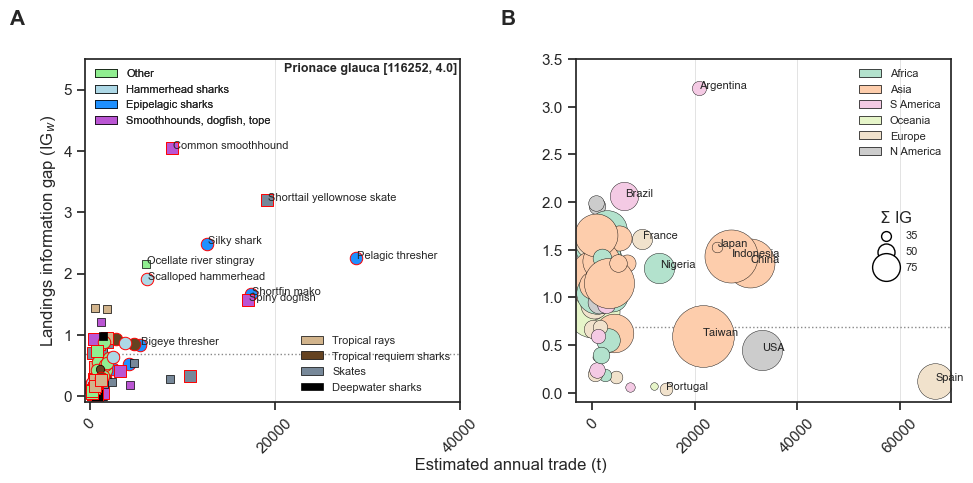

In [454]:
# = = = = = Set up plot
fig, ax = plt.subplots(1,2,figsize=(10, 5))

# Set up plot
sns.set_theme(style="ticks", palette="hls")

# ylimits
miy = -.1
may = 5.5

# legend font size
fsx = 8

# a) Average information gap vs biomass in the trade, coloured by IUCN category
#cony = ['DD', 'LC', 'NT', 'VU', 'EN', 'CR']
cony = ['Not','VUENCR']
#ccoy = np.array([3,2,2,3,4,4])[match(trade_vol_spp.IUCN.values,cony)]
ccoy = np.array([2,3])[match(trade_vol_spp.IUCN.values,cony)]
#ccox = np.array(['black','black','black','red','red','red'])[match(trade_vol_spp.IUCN,cony)]
ccox = np.array(['black','red'])[match(trade_vol_spp.IUCN,cony)]
#ccow = np.array([.5,.5,.5,.5,.7,.7])[match(trade_vol_spp.IUCN,cony)]
ccow = np.array([.5,.7])[match(trade_vol_spp.IUCN,cony)]
#ccoz = np.array(['s',"o","o","o","o","o"])[match(trade_vol_spp.IUCN,cony)]
ccoz = np.array(['s',"o"])[match(trade_vol_spp.CITES,['Not listed','Listed'])]
#ccoz = np.array(['s',"o"])[match(trade_vol_spp.IUCN,cony)]

#conx = ['Coastal Rays','Coastal Sharks','Deepwater Rays','Deepwater Sharks','Pelagic Rays','Pelagic Sharks']
#colx = ['#d2b48c', '#654321', '#555555','#000000', '#add8e6','#00008b']
conx = hab_ord
colx = hab_col
ccol = np.array(colx)[match(trade_vol_spp.sel(species=spp_100).Habitat,conx)]
cutz = match(spp_100,list(species_))
icol = ccol
[ax[0].scatter(x, y, facecolor=c, s=(3*s)**2, marker=m,
               edgecolor=z,linewidth=w) for x,y,c,s,m,z,w in zip(
                (trade_vol_spp.sel(species=spp_100)), 
                mean_IGw_spp, 
                icol,
                ccoy,
                ccoz,
                ccox,
                ccow
                )]

#legend_elements = [patches.Patch(facecolor='red', label='Endangered c.2020', edgecolor='black', linewidth=0.5)]
sx = 4
legend_elements1 = [patches.Patch(facecolor=c, label=i, edgecolor='black', linewidth=0.5) for i,c in zip(conx[:sx], colx[:sx])]
legend1 = ax[0].legend(handles=legend_elements1, fontsize=fsx, loc='lower right')
ax[0].add_artist(legend1)

legend_elements1b = [patches.Patch(facecolor=c, label=i, edgecolor='black', linewidth=0.5) for i,c in zip(conx[sx:], colx[sx:])]
legend1b = ax[0].legend(handles=legend_elements1b, fontsize=fsx, loc='upper left')
ax[0].add_artist(legend1b)


# Selected text labels
tmp_sppx = ['Isurus oxyrinchus', 'Dipturus brevicaudatus','Alopias pelagicus', 
            #'Sphyrna mokarran', 
            'Sphyrna lewini', 'Carcharhinus falciformis',
           'Potamotrygon motoro', 'Mustelus mustelus',
            'Squalus acanthias','Alopias superciliosus']
tmp_sppx_c = ['Shortfin mako', 'Shorttail yellownose skate','Pelagic thresher', 
            #'Great hammerhead', 
              'Scalloped hammerhead', 'Silky shark',
           'Ocellate river stingray', 'Common smoothhound',
            'Spiny dogfish','Bigeye thresher']
tindx = match(tmp_sppx, list(spp_100))
[ax[0].text(x+100, y, t, fontsize=8) for x,y,t in zip(
                trade_vol_spp.sel(species=spp_100)[tindx], 
                mean_IGw_spp[tindx], 
                tmp_sppx_c
                )]

# blue shark
ax[0].text(21000, may-0.2, 'Prionace glauca [' + bsx + ', ' + bsy + ']', fontsize=9, fontweight='bold')
ax[0].set_xticks((0, 20000, 40000))
ax[0].axvline(x=20000, color='#88888855', zorder=0, linewidth=.5)
ax[0].axvline(x=40000, color='#88888855', zorder=0, linewidth=.5)
#ax[0].legend()
ax[0].set_xlabel('')
ax[0].set_ylabel('Landings information gap (IG$_{w}$)')
ax[0].set(
    #xscale="log", 
    xlim=(-500, 40000),
    ylim=(miy, may)
)
ax[0].xaxis.grid(True, "minor", linewidth=.5)
ax[0].yaxis.grid(False)
for tick in ax[0].get_xticklabels():
    tick.set_rotation(45)
#ax[0].axvline(x=10000, color='#88888855', zorder=0, linewidth=.5)
ax[0].axhline(y=-np.log(0.5), color='#888888', zorder=0, linewidth=1, linestyle=":")
# Add journal letter
letter_annotation(ax[0], -.2, 1.1, 'A', sz=fsz)

# = = = = = = = = = = = = = = = = = = = = = = = = = = = = = = = = #
# = = = = = = = = = = = = = = = = = = = = = = = = = = = = = = = = #


# b) Average information gap per species vs total weighted information gap per country, shapes/colours by continent
conx = ['Africa', 'Asia', 'S America', 'Oceania', 'Europe','N America']
colx = mp.colormaps['Pastel2'].resampled(len(conx))
ccol = colx(match(trade_vol_ex.Continent.values,['Africa', 'Asia', 'South America', 'Oceania', 'Europe','North America']))
[ax[1].scatter(x,y,color=c, s=(s/6)**3, edgecolor='black', linewidth=0.3) for x,y,s,c in zip(trade_vol_ex, mean_IGw_ex, total_IG_ex, ccol)]
legend_elements1 = [patches.Patch(facecolor=c, label=i, edgecolor='black', linewidth=0.5) for i,c in zip(conx, colx(np.arange(len(conx))))]
legend1 = ax[1].legend(handles=legend_elements1, fontsize=fsx, loc='upper right')
ax[1].add_artist(legend1)

# Selected text labels
tmp_coux = ['Argentina', 'China', 'Nigeria', 'Indonesia', 'Japan', 'Taiwan', 'France', 'USA', 'Spain', 'Portugal', 'Brazil']
tindx = match(tmp_coux, list(biggest_countries_long_a))
[ax[1].text(x+100, s+.0, t, fontsize=8, fontweight='bold', name='Helvetica') for x,s,t in zip(trade_vol_ex[tindx], mean_IGw_ex[tindx], biggest_countries_long_a[tindx])]

gll = plt.scatter([],[], s=5, marker='o', color='white', edgecolor='black')
gl = plt.scatter([],[], s=50, marker='o', color='white', edgecolor='black')
ga = plt.scatter([],[], s=150, marker='o', color='white', edgecolor='black')
gk = plt.scatter([],[], s=400, marker='o', color='white', edgecolor='black')

ax[1].legend((gl,ga,gk),
       ('35', '50','75'),
       scatterpoints=1,
       loc='lower left',
       ncol=1,
       fontsize=fsx,
        title='$\Sigma$ IG',
        bbox_to_anchor=(.77, .35))


ax[1].set_xlabel('')
ax[1].set_ylabel('')
ax[1].set(
    #xscale="log", 
    xlim=(None, 70000),
    ylim=(miy, may-2)
)
ax[1].xaxis.grid(True, "minor", linewidth=.5)
for tick in ax[1].get_xticklabels():
    tick.set_rotation(45)
ax[1].set_xticks((0, 20000, 40000, 60000))
#ax[1].axes.get_yaxis().set_visible(False)
ax[1].axvline(x=20000, color='#88888855', zorder=0, linewidth=.5)
ax[1].axvline(x=40000, color='#88888855', zorder=0, linewidth=.5)
ax[1].axvline(x=60000, color='#88888855', zorder=0, linewidth=.5)
ax[1].axvline(x=80000, color='#88888855', zorder=0, linewidth=.5)

ax[1].axhline(y=-np.log(0.5), color='#888888', zorder=0, linewidth=1, linestyle=":")
# Add journal letter
letter_annotation(ax[1], -.2, 1.1, 'B', sz=fsz)

# Set common labels
fig.text(.5, 0.03, '         Estimated annual trade (t)', ha='center', va='center')
plt.tight_layout(pad=1.5)
plt.savefig(bf+'/Global/'+'Information_gaps.jpg',dpi=300);

/var/folders/0t/qrl_lm21285bvxnv0dg58ycm0000gn/T/ipykernel_17296/669865767.py:156: UserWarning:

The figure layout has changed to tight



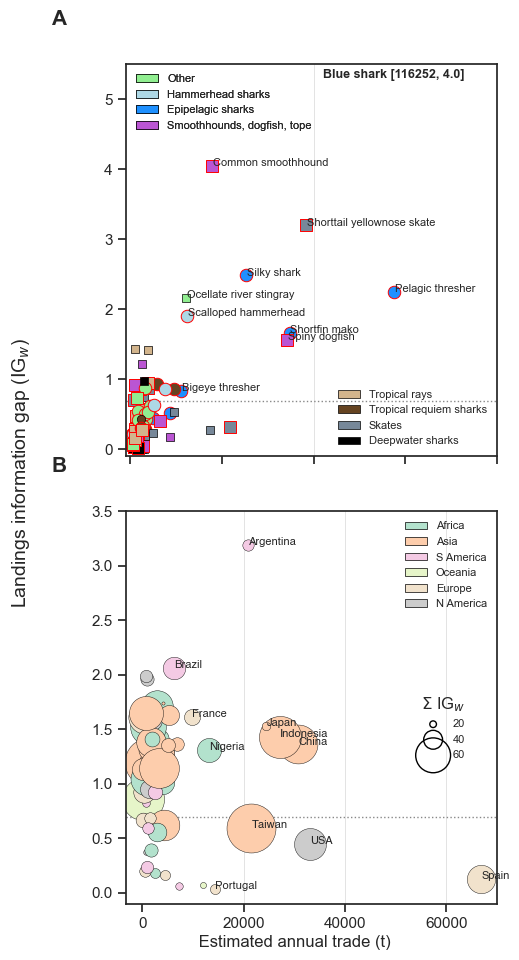

In [456]:
# = = = = = Set up plot
fig, ax = plt.subplots(2,1,figsize=(5.5, 10))

# Set up plot
sns.set_theme(style="ticks", palette="hls")

# ylimits
miy = -.1
may = 5.5

# legend font size
fsx = 8

# a) Average information gap vs biomass in the trade, coloured by IUCN category
#cony = ['DD', 'LC', 'NT', 'VU', 'EN', 'CR']
cony = ['Not','VUENCR']
#ccoy = np.array([3,2,2,3,4,4])[match(trade_vol_spp.IUCN.values,cony)]
ccoy = np.array([2,3])[match(trade_vol_spp.IUCN.values,cony)]
#ccox = np.array(['black','black','black','red','red','red'])[match(trade_vol_spp.IUCN,cony)]
ccox = np.array(['black','red'])[match(trade_vol_spp.IUCN,cony)]
#ccow = np.array([.5,.5,.5,.5,.7,.7])[match(trade_vol_spp.IUCN,cony)]
ccow = np.array([.5,.7])[match(trade_vol_spp.IUCN,cony)]
#ccoz = np.array(['s',"o","o","o","o","o"])[match(trade_vol_spp.IUCN,cony)]
ccoz = np.array(['s',"o"])[match(trade_vol_spp.CITES,['Not listed','Listed'])]
#ccoz = np.array(['s',"o"])[match(trade_vol_spp.IUCN,cony)]

#conx = ['Coastal Rays','Coastal Sharks','Deepwater Rays','Deepwater Sharks','Pelagic Rays','Pelagic Sharks']
#colx = ['#d2b48c', '#654321', '#555555','#000000', '#add8e6','#00008b']
conx = hab_ord
colx = hab_col
ccol = np.array(colx)[match(trade_vol_spp.sel(species=spp_100).Habitat,conx)]
cutz = match(spp_100,list(species_))
icol = ccol
[ax[0].scatter(x, y, facecolor=c, s=(3*s)**2, marker=m,
               edgecolor=z,linewidth=w) for x,y,c,s,m,z,w in zip(
                (trade_vol_spp.sel(species=spp_100)), 
                mean_IGw_spp, 
                icol,
                ccoy,
                ccoz,
                ccox,
                ccow
                )]

#legend_elements = [patches.Patch(facecolor='red', label='Endangered c.2020', edgecolor='black', linewidth=0.5)]
sx = 4
legend_elements1 = [patches.Patch(facecolor=c, label=i, edgecolor='black', linewidth=0.5) for i,c in zip(conx[:sx], colx[:sx])]
legend1 = ax[0].legend(handles=legend_elements1, fontsize=fsx, loc='lower right')
ax[0].add_artist(legend1)

legend_elements1b = [patches.Patch(facecolor=c, label=i, edgecolor='black', linewidth=0.5) for i,c in zip(conx[sx:], colx[sx:])]
legend1b = ax[0].legend(handles=legend_elements1b, fontsize=fsx, loc='upper left')
ax[0].add_artist(legend1b)


# Selected text labels
tmp_sppx = ['Isurus oxyrinchus', 'Dipturus brevicaudatus','Alopias pelagicus', 
            #'Sphyrna mokarran', 
            'Sphyrna lewini', 'Carcharhinus falciformis',
           'Potamotrygon motoro', 'Mustelus mustelus',
            'Squalus acanthias','Alopias superciliosus']
tmp_sppx_c = ['Shortfin mako', 'Shorttail yellownose skate','Pelagic thresher', 
            #'Great hammerhead', 
              'Scalloped hammerhead', 'Silky shark',
           'Ocellate river stingray', 'Common smoothhound',
            'Spiny dogfish','Bigeye thresher']
tindx = match(tmp_sppx, list(spp_100))
[ax[0].text(x+100, y, t, fontsize=8) for x,y,t in zip(
                trade_vol_spp.sel(species=spp_100)[tindx], 
                mean_IGw_spp[tindx], 
                tmp_sppx_c
                )]

# blue shark
ax[0].text(21000, may-0.2, 'Blue shark [' + bsx + ', ' + bsy + ']', fontsize=9, fontweight='bold')
#ax[0].set_xticks((0, 20000, 40000))
# Turn off all x‑axis tick labels on A
ax[0].tick_params(axis='x', which='both', labelbottom=False)
ax[0].axvline(x=20000, color='#88888855', zorder=0, linewidth=.5)
ax[0].axvline(x=40000, color='#88888855', zorder=0, linewidth=.5)
#ax[0].legend()
ax[0].set_xlabel('')
#ax[0].set_ylabel('Landings information gap (IG$_{w}$)')
ax[0].set(
    #xscale="log", 
    xlim=(-500, 40000),
    ylim=(miy, may)
)
ax[0].xaxis.grid(True, "minor", linewidth=.5)
ax[0].yaxis.grid(False)
for tick in ax[0].get_xticklabels():
    tick.set_rotation(45)
#ax[0].axvline(x=10000, color='#88888855', zorder=0, linewidth=.5)
ax[0].axhline(y=-np.log(0.5), color='#888888', zorder=0, linewidth=1, linestyle=":")
# Add journal letter
letter_annotation(ax[0], -.2, 1.1, 'A', sz=fsz)

# = = = = = = = = = = = = = = = = = = = = = = = = = = = = = = = = #
# = = = = = = = = = = = = = = = = = = = = = = = = = = = = = = = = #


# b) Average information gap per species vs total weighted information gap per country, shapes/colours by continent
conx = ['Africa', 'Asia', 'S America', 'Oceania', 'Europe','N America']
colx = mp.colormaps['Pastel2'].resampled(len(conx))
ccol = colx(match(trade_vol_ex.Continent.values,['Africa', 'Asia', 'South America', 'Oceania', 'Europe','North America']))
[ax[1].scatter(x,y,color=c, s=(s/7)**3, edgecolor='black', linewidth=0.3) for x,y,s,c in zip(trade_vol_ex, mean_IGw_ex, total_IG_ex, ccol)]
legend_elements1 = [patches.Patch(facecolor=c, label=i, edgecolor='black', linewidth=0.5) for i,c in zip(conx, colx(np.arange(len(conx))))]
legend1 = ax[1].legend(handles=legend_elements1, fontsize=fsx, loc='upper right')
ax[1].add_artist(legend1)

# Selected text labels
tmp_coux = ['Argentina', 'China', 'Nigeria', 'Indonesia', 'Japan', 'Taiwan', 'France', 'USA', 'Spain', 'Portugal', 'Brazil']
tindx = match(tmp_coux, list(biggest_countries_long_a))
[ax[1].text(x+100, s+.0, t, fontsize=8, fontweight='bold', name='Helvetica') for x,s,t in zip(trade_vol_ex[tindx], mean_IGw_ex[tindx], biggest_countries_long_a[tindx])]

gll = plt.scatter([],[], s=5, marker='o', color='white', edgecolor='black')
gl = plt.scatter([],[], s=23, marker='o', color='white', edgecolor='black',facecolor='none',)
ga = plt.scatter([],[], s=185, marker='o', color='white', edgecolor='black',facecolor='none',)
gk = plt.scatter([],[], s=630, marker='o', color='white', edgecolor='black',facecolor='none',)

ax[1].legend((gl,ga,gk),
       ('20', '40','60'),
       scatterpoints=1,
       loc='lower left',
       ncol=1,
       fontsize=fsx,
        title='$\Sigma$ IG$_w$',
        bbox_to_anchor=(.77, .34))


ax[1].set_xlabel('')
#ax[1].set_ylabel('')
ax[1].set(
    #xscale="log", 
    xlim=(None, 70000),
    ylim=(miy, may-2)
)
ax[1].xaxis.grid(True, "minor", linewidth=.5)
#for tick in ax[1].get_xticklabels():
#    tick.set_rotation(45)
ax[1].set_xticks((0, 20000, 40000, 60000))
#ax[1].axes.get_yaxis().set_visible(False)
ax[1].axvline(x=20000, color='#88888855', zorder=0, linewidth=.5)
ax[1].axvline(x=40000, color='#88888855', zorder=0, linewidth=.5)
ax[1].axvline(x=60000, color='#88888855', zorder=0, linewidth=.5)
ax[1].axvline(x=80000, color='#88888855', zorder=0, linewidth=.5)

ax[1].axhline(y=-np.log(0.5), color='#888888', zorder=0, linewidth=1, linestyle=":")
# Add journal letter
letter_annotation(ax[1], -.2, 1.1, 'B', sz=fsz)



# Set common labels
fig.text(.5, 0.03, '         Estimated annual trade (t)', ha='center', va='center')
plt.tight_layout(pad=2.5, h_pad=-0.2)
# add a shared ylabel for the whole figure:
fig.supylabel('Landings information gap (IG$_{w}$)', fontsize=14, x=0.02)
plt.savefig(bf+'/Global/'+'Information_gaps.jpg',dpi=300);

In [416]:
poop = np.array([20,40,60])
(poop/7)**3,

(array([ 23.32361516, 186.58892128, 629.73760933]),)

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
/var/folders/0t/qrl_lm21285bvxnv0dg58ycm0000gn/T/ipykernel_17296/416386495.py:63: UserWarning:

The figure layout has changed to tight



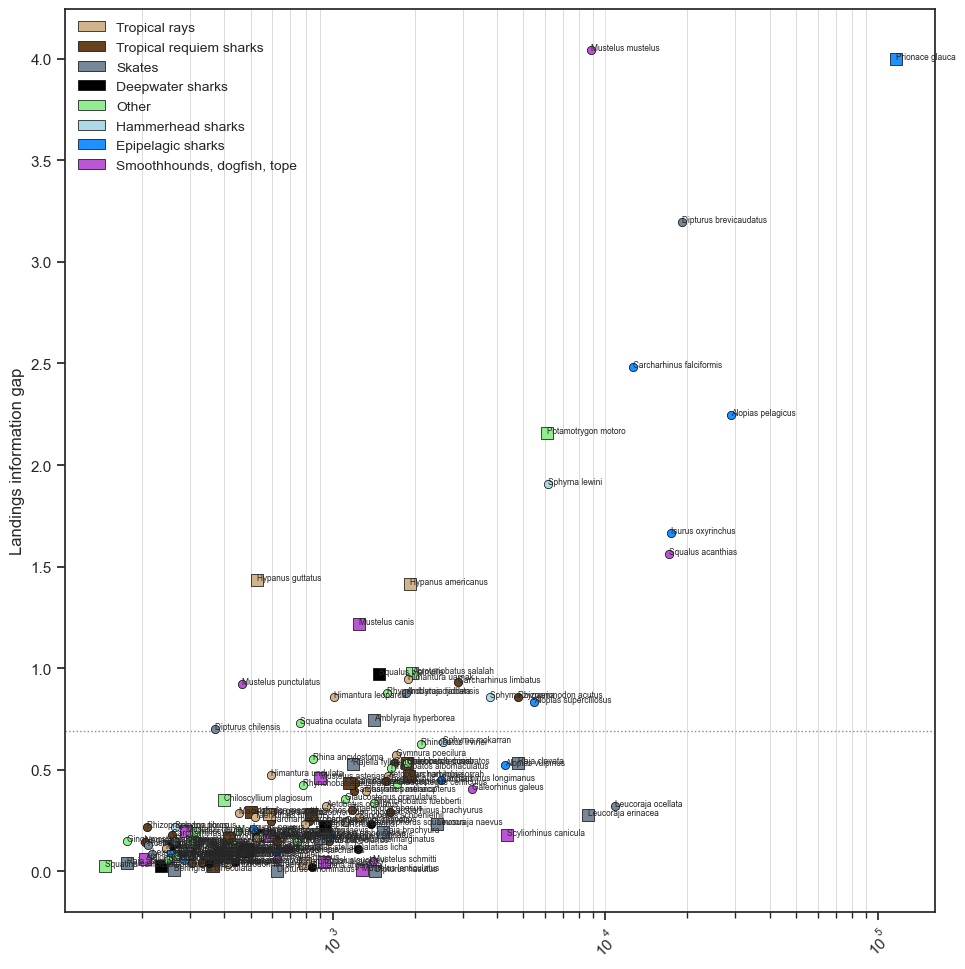

In [261]:
# = = = = = Set up plot
_, ax = plt.subplots(1,1,figsize=(10, 10))

# Set up plot
sns.set_theme(style="ticks", palette="hls")

miy = 0.15
may = 1.4

# a) Average information gap vs biomass in the trade, coloured by dulvy groups
#cony = ['DD', 'LC', 'NT', 'VU', 'EN', 'CR']
cony = ['Not','VUENCR']
ccoy = np.array([3,2,2,3,4,4])[match(trade_vol_spp.IUCN,cony)]
ccox = np.array(['black','black','black','black','red','red'])[match(trade_vol_spp.IUCN,cony)]
ccow = np.array([.5,.5,.5,.5,.7,.7])[match(trade_vol_spp.IUCN,cony)]
ccoz = np.array(['s',"o","o","o","o","o"])[match(trade_vol_spp.IUCN,cony)]
#conx = ['Coastal Rays','Coastal Sharks','Deepwater Rays','Deepwater Sharks','Pelagic Rays','Pelagic Sharks']
#colx = ['#d2b48c', '#654321', '#555555','#000000', '#add8e6','#00008b']
conx = hab_ord
colx = hab_col
ccol = np.array(colx)[match(trade_vol_spp.sel(species=spp_100).Habitat,conx)]
cutz = match(spp_100,list(species_))
icol = ccol
[ax.scatter(x, y, facecolor=c, s=(3*s)**2, marker=m,
               edgecolor=z,linewidth=w) for x,y,c,s,m,z,w in zip(
                (trade_vol_spp.sel(species=spp_100)), 
                mean_IGw_spp, 
                icol,
                ccoy,
                ccoz,
                ccox,
                ccow
                )]
[ax.text(x, y, t, fontsize=6) for x,y,t in zip(
                trade_vol_spp.sel(species=spp_100), 
                mean_IGw_spp, 
                spp_100
                )]

#legend_elements = [patches.Patch(facecolor='red', label='Endangered c.2020', edgecolor='black', linewidth=0.5)]
legend_elements1 = [patches.Patch(facecolor=c, label=i, edgecolor='black', linewidth=0.5) for i,c in zip(conx, colx)]
legend1 = ax.legend(handles=legend_elements1, fontsize=10)
ax.add_artist(legend1)
ax.legend(fontsize=10)
ax.set_xlabel('')
ax.set_ylabel('Landings information gap')
ax.set(
    xscale="log", 
    #xlim=(1000, 20000),
    #ylim=(miy, may)
)
ax.xaxis.grid(True, "minor", linewidth=.5)
ax.yaxis.grid(False)
for tick in ax.get_xticklabels():
    tick.set_rotation(45)
ax.axvline(x=10000, color='#88888855', zorder=0, linewidth=.5)
ax.axhline(y=-np.log(0.5), color='#888888', zorder=0, linewidth=1, linestyle=":")



# Set common labels
fig.text(.5, 0.04, '         Estimated trade (t)', ha='center', va='center')
plt.tight_layout(pad=1.5)
plt.savefig(bf+'/Global/'+'Information_gaps_spp_labels.jpg',dpi=300);

In [262]:
trade_vol_spp.sel(species='Carcharhinus falciformis'), mean_IGw_spp[spp_100=='Carcharhinus falciformis']

(<xarray.DataArray 'amount_exported' ()>
 array(12648.41448107)
 Coordinates:
     species  <U33 'Carcharhinus falciformis'
     IUCN     <U6 'VUENCR'
     CITES    <U10 'Listed'
     Habitat  object 'Epipelagic sharks',
 array([2.48314777]))

In [263]:
trade_vol_spp

<xarray.DataArray 'amount_exported' (species: 156)>
array([  1959.91407752,    571.08236677,   1598.77854051,    948.04010806,
          360.11293607,    650.48752853,  28770.94890231,   5479.22466523,
         4279.87161563,   1420.87015653,   1863.19015077,    204.72586143,
          251.39742079,    331.09958726,    262.13527399,    256.91264708,
          967.83611239,    816.4834543 ,    809.37717272,   1616.56279393,
         1202.74468355,    414.24812689,  12648.41448107,    305.18608515,
         1682.02541462,   2887.26894566,   2499.65437451,    378.46145804,
         1192.27437864,    595.60554651,   1571.00157384,    385.63377541,
          977.12788788,   1905.5299332 ,    301.69762579,    617.24320947,
          618.93410264,   1381.62265371,    466.34314389,    285.05853444,
          399.47947623,    311.03614532,   1242.79834019,    489.48654763,
         1321.13934703,    485.73639964,    260.88028569,  19121.90052004,
          371.00923969,    623.93397942,   1424.77147282,    307.32186181,
          234.65502662,    270.43225275,   1869.96443046,   3232.66629884,
          486.42393361,    175.86361894,   1716.13934514,   1113.1861407 ,
         1112.45966652,   1704.74822997,    271.01448565,    791.03390695,
          935.14714776,    533.94774432,   1010.39254396,   1890.72039952,
          594.78083465,   1919.28523404,    526.24476393,  17373.97186795,
          510.82167544,    270.2277761 ,    357.30372675,    297.29290007,
         8652.98316745,    218.34221283,   2422.28949483,  10824.58378076,
          418.04228572,    452.18781225,    261.35507498,    450.00835656,
          340.36891644,    550.67917159,    898.7602256 ,   1251.74865322,
          626.36424225,    290.59114665,   1279.65264971,    470.70374867,
          585.39544262,   8858.77592826,    464.84189549,   1410.68685342,
          244.6751866 ,    351.15293803,    331.75884876,    205.85262745,
          737.33902015,    624.6353295 ,    295.11376061,   6091.54406252,
          381.6791053 ,    259.19439656,    304.31857687,    175.47121236,
         1531.72426836,   4770.4437916 ,    293.14783164,    900.00778324,
          264.24937847,   1182.37449493,    844.93960537,    685.45037474,
         1631.38642851,   2099.95868   ,   1867.78443731,    789.93853491,
          413.84279943,   4777.2666542 ,    832.87941794,    207.61109739,
          363.29249422,    778.24673178,   1583.58800651,    710.64245575,
         1411.58468574,    209.8231422 ,   1143.26605927,    503.04902561,
         4359.90907863,    682.22508852,   6151.42869378,   2543.14180883,
          263.5265214 ,   3776.30771379,  17050.88152961,   1479.64563426,
          391.03509605,    438.71108552,    353.30289473,    927.36821511,
          838.66565982,    145.79324184,    759.21270574,    248.40998912,
          584.96844728,    520.93031315,    437.43981421,    265.96753585,
         1179.74802394,    525.77501171,   1244.68292988, 116252.59725919])
Coordinates:
  * species  (species) <U33 'Acroteriobatus salalah' ... 'Prionace glauca'
    IUCN     (species) <U6 'Not' 'VUENCR' 'VUENCR' ... 'VUENCR' 'VUENCR' 'Not'
    CITES    (species) <U10 'Listed' 'Not listed' ... 'Not listed' 'Listed'
    Habitat  (species) object 'Other' 'Tropical rays' ... 'Epipelagic sharks'

In [264]:
trade_vol_ex.sel(exporter=['USA','ESP','TWN']).sum()/trade_vol_ex.sum()

<xarray.DataArray 'amount_exported' ()>
array(0.30878845)

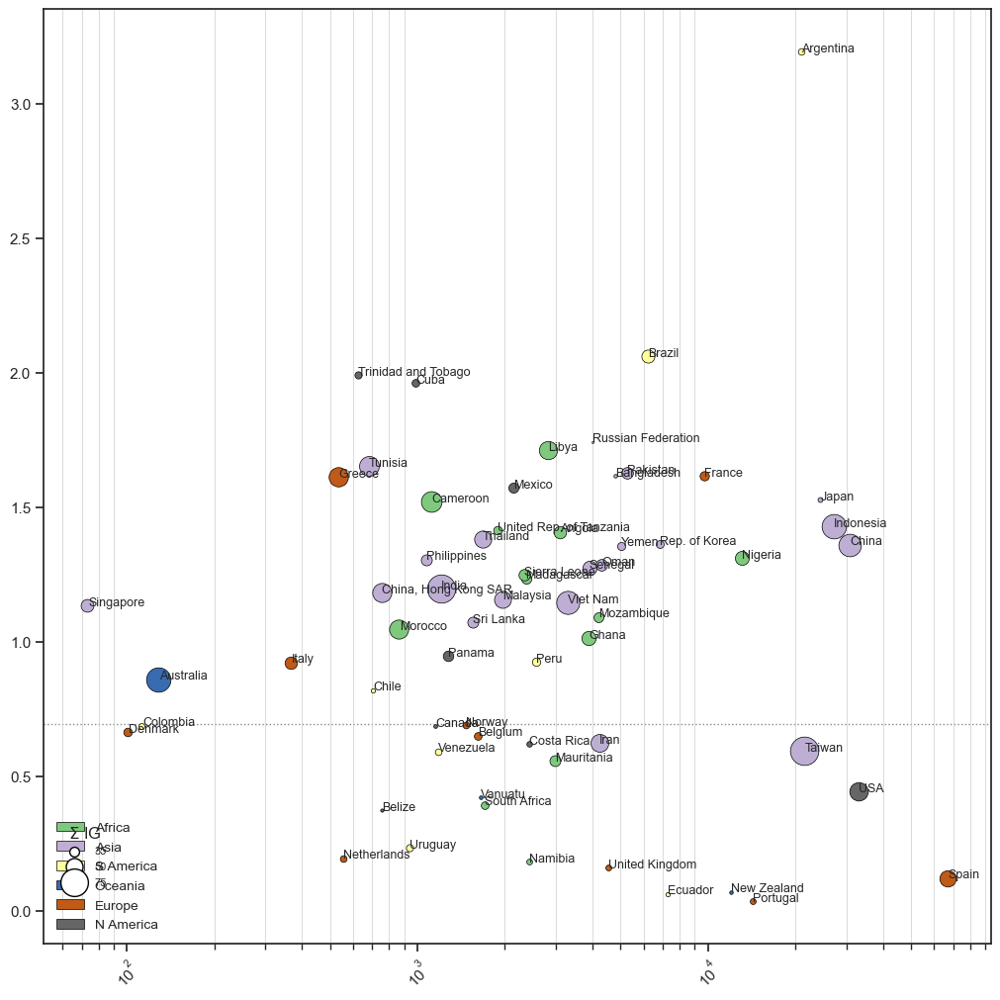

In [265]:
# = = = = = Set up plot
_, ax = plt.subplots(1,1,figsize=(10, 10))

# b) Average information gap per species vs total weighted information gap per country, shapes/colours by continent
conx = ['Africa', 'Asia', 'S America', 'Oceania', 'Europe','N America']
colx = mp.colormaps['Accent'].resampled(len(conx))
ccol = colx(match(trade_vol_ex.Continent.values,['Africa', 'Asia', 'South America', 'Oceania', 'Europe','North America']))
[ax.scatter(x,y,color=c, s=(s/10)**3, edgecolor='black', linewidth=0.5) for x,y,s,c in zip(trade_vol_ex, mean_IGw_ex, total_IG_ex, ccol)]
[ax.text(x+1,s, t, fontsize=9) for x,s,t in zip(trade_vol_ex, mean_IGw_ex, biggest_countries_long_a)]

legend_elements1 = [patches.Patch(facecolor=c, label=i, edgecolor='black', linewidth=0.5) for i,c in zip(conx, colx(np.arange(len(conx))))]
legend1 = ax.legend(handles=legend_elements1, fontsize=10, loc='lower left')
ax.add_artist(legend1)

gll = plt.scatter([],[], s=5, marker='o', color='white', edgecolor='black')
gl = plt.scatter([],[], s=50, marker='o', color='white', edgecolor='black')
ga = plt.scatter([],[], s=150, marker='o', color='white', edgecolor='black')
gk = plt.scatter([],[], s=400, marker='o', color='white', edgecolor='black')

ax.legend((gl,ga,gk),
       ('35', '50','75'),
       scatterpoints=1,
       loc='lower left',
       ncol=1,
       fontsize=8,
        title='$\Sigma$ IG',
        bbox_to_anchor=(.01, .05))


ax.set_xlabel('')
ax.set_ylabel('')
ax.set(
    xscale="log", 
    #xlim=(1000, None),
    #ylim=(miy, may)
)
ax.xaxis.grid(True, "minor", linewidth=.5)
for tick in ax.get_xticklabels():
    tick.set_rotation(45)
#ax.axes.get_yaxis().set_visible(False)
ax.axhline(y=-np.log(0.5), color='#888888', zorder=0, linewidth=1, linestyle=":")



In [266]:
-np.log(.02)

3.912023005428146

# CITES fin trade comparison

In [267]:
# Graphing functions for CITES reported fin comparison

def CITES24(sppx,expx):
    tmp_land = (
        idata_landings_a.posterior['Latent_landings']
        .sel(species=sppx,exporter=expx)
        .quantile((0.5,0.05,0.95),('chain','draw'))
        .to_dataframe().reset_index()
        .sort_values(by='Latent_landings',ascending=False)
        .pivot_table(columns=['quantile'],index=['Exporter'],values='Latent_landings')
        .reset_index()
    )
    tmp_land.columns = [sppx,'l90% UI landings', 'Median landings', 'u90% UI landings']
    tmp_trade = (
            trade_spp
            .sel(species=sppx,exporter=expx)
            .sum(['importer'])
            .quantile((0.5,0.05,0.95),('chain','draw'))
            .to_dataframe().reset_index()
            .sort_values(by='',ascending=False)
            .pivot_table(columns=['quantile'],index=['Exporter'],values='')
            .reset_index()
        )
    tmp_trade.columns = [sppx,'l90% UI trade', 'Median trade', 'u90% UI trade']
    return tmp_land.merge(tmp_trade)

def CITES24_all(sppx):
    tmp_land = (
        idata_landings_a.posterior['Latent_landings']
        .sel(species=sppx)
        .quantile((0.5,0.05,0.95),('chain','draw'))
        .to_dataframe().reset_index()
        .sort_values(by='Latent_landings',ascending=False)
        .pivot_table(columns=['quantile'],index=['Exporter'],values='Latent_landings')
        .reset_index()
    )
    tmp_land.columns = [sppx,'l90% UI landings', 'Median landings', 'u90% UI landings']
    tmp_trade = (
            trade_spp
            .sel(species=sppx)
            .sum(['importer'])
            .quantile((0.5,0.05,0.95),('chain','draw'))
            .to_dataframe().reset_index()
            .sort_values(by='',ascending=False)
            .pivot_table(columns=['quantile'],index=['Exporter'],values='')
            .reset_index()
        )
    tmp_trade.columns = [sppx,'l90% UI trade', 'Median trade', 'u90% UI trade']
    return tmp_land.merge(tmp_trade)

In [268]:
# Grab CITES-reported fin trade
cites_fin = pd.read_csv(bd+'comptab_2024-11-05 14_45_comma_separated.csv')
cites_fin.shape

(823, 16)

In [269]:
# Get average fin trade 2019-2024
FinTrade = (cites_fin.groupby(['Taxon','Year'])
            .sum().reset_index()[['Taxon','Exporter reported quantity','Year']]
           )
FinTrade = FinTrade.loc[FinTrade.Year==2021].groupby(['Taxon']).max().reset_index()

In [270]:
# Fin converstion factors
finCon = {'Alopias pelagicus':0.0340, 
          'Alopias spp.':0.0340, 
          'Alopias superciliosus':0.0340,
       'Alopias vulpinus':0.0340, 
          'Alopiidae spp.':0.0340, 
          'Anoxypristis cuspidata':0.0169,
       'Carcharhinidae spp.':0.0169, 
          'Carcharhinus falciformis':0.0169,
       'Carcharhinus longimanus':0.0169, 
          'Carcharodon carcharias':0.0169,
       'Glaucostegidae spp.':0.0169, 
          'Glaucostegus cemiculus':0.0169,
       'Glaucostegus granulatus':0.0169, 
          'Glaucostegus halavi':0.0169,
       'Glaucostegus obtusus':0.0169, 
          'Glaucostegus spp.':0.0169, 
          'Glaucostegus typus':0.0169,
       'Isurus oxyrinchus':0.0169, 
          'Isurus paucus':0.0169, 
          'Isurus spp.':0.0169, 
          'Lamna nasus':0.0169,
       'Mobula japanica':0.0340, 
          'Mobula mobular':0.0340,
          'Mobula spp.':0.0340,
       'Mobula tarapacana':0.0340,
          'Myliobatidae spp.':0.0340, 
          'Prionace glauca':0.0169,
       'Pristis pristis':0.0169, 
          'Rhina ancylostomus':0.0169, 
          'Rhina spp.':0.0169,
       'Rhinidae spp.':0.0169, 
          'Rhynchobatus australiae':0.0169,
       'Rhynchobatus djiddensis':0.0169, 
          'Rhynchobatus laevis':0.0169,
       'Rhynchobatus luebberti':0.0169, 
          'Rhynchobatus palpebratus':0.0169,
       'Rhynchobatus spp.':0.0169,
          'Rhynchobatus springeri':0.0169,
       'Rhynchorhina mauritaniensis':0.0169,
          'Sphyrna lewini':0.0169,
       'Sphyrna mokarran':0.0169,
          'Sphyrna spp.':0.0169, 
          'Sphyrna zygaena':0.0169,
       'Sphyrnidae spp.':0.0169}

In [271]:
# Append conversion factors
FinTrade['finCon'] = np.array([finCon[x] for x in FinTrade.Taxon.values])
# Convert to total kgs
FinTrade['tonnes'] = (FinTrade['Exporter reported quantity']/FinTrade.finCon)/1000

In [272]:
FinTrade.Taxon.values[1][-4:]

'spp.'

In [273]:
tmpSpp = []
for s in FinTrade.Taxon.values:
    if s[-4:]=='spp.':
        pass
    else:
        tmpSpp += [s]
tmpSpp = np.array(tmpSpp)

In [274]:
tmpSpp

array(['Alopias pelagicus', 'Alopias superciliosus', 'Alopias vulpinus',
       'Anoxypristis cuspidata', 'Carcharhinus falciformis',
       'Carcharhinus longimanus', 'Carcharodon carcharias',
       'Glaucostegus cemiculus', 'Glaucostegus granulatus',
       'Glaucostegus obtusus', 'Isurus oxyrinchus', 'Isurus paucus',
       'Lamna nasus', 'Mobula mobular', 'Pristis pristis',
       'Rhina ancylostomus', 'Rhynchobatus australiae',
       'Rhynchobatus djiddensis', 'Rhynchobatus laevis',
       'Rhynchobatus luebberti', 'Rhynchobatus palpebratus',
       'Rhynchobatus springeri', 'Rhynchorhina mauritaniensis',
       'Sphyrna lewini', 'Sphyrna mokarran', 'Sphyrna zygaena'],
      dtype='<U27')

In [275]:
"""
fig, ax = plt.subplots(5, 7,figsize=(13,13))

for tx,axx in zip(tmpSpp,ax.flatten()):
    ttax = tx
    if FinTrade['tonnes'].values[FinTrade.Taxon==ttax]<50:
        pass
    else:
        xxtmp = trade_spp.sel(species=tx).sum(('exporter','importer'))
        az.plot_density(xxtmp, colors='#1f77b4', ax=axx, shade=0.6, hdi_prob=0.9)
        #az.plot_posterior(xxtmp, color='#1f77b4',ax=ax, linewidth=.5, hdi_prob=0.9) 
        axx.axvline(x=FinTrade['tonnes'].values[FinTrade.Taxon==ttax], color='red', zorder=0, linewidth=.5, label='CITES fins\nconversion')
        axx.set_title(ttax, fontsize=8)
        #plt.xlabel('Total exports (kg/yr)')
#plt.savefig(bf+'/Species/'+tmpSpp.replace(" ", "_")+'total_trade.jpg',dpi=300);
"""

'\nfig, ax = plt.subplots(5, 7,figsize=(13,13))\n\nfor tx,axx in zip(tmpSpp,ax.flatten()):\n    ttax = tx\n    if FinTrade[\'tonnes\'].values[FinTrade.Taxon==ttax]<50:\n        pass\n    else:\n        xxtmp = trade_spp.sel(species=tx).sum((\'exporter\',\'importer\'))\n        az.plot_density(xxtmp, colors=\'#1f77b4\', ax=axx, shade=0.6, hdi_prob=0.9)\n        #az.plot_posterior(xxtmp, color=\'#1f77b4\',ax=ax, linewidth=.5, hdi_prob=0.9) \n        axx.axvline(x=FinTrade[\'tonnes\'].values[FinTrade.Taxon==ttax], color=\'red\', zorder=0, linewidth=.5, label=\'CITES fins\nconversion\')\n        axx.set_title(ttax, fontsize=8)\n        #plt.xlabel(\'Total exports (kg/yr)\')\n#plt.savefig(bf+\'/Species/\'+tmpSpp.replace(" ", "_")+\'total_trade.jpg\',dpi=300);\n'

## Comparison to Cardenosa estimates

In [276]:
# Grab CITES-reported fin trade
card_data = pd.read_csv(bd+'cardenosa_table2.csv')
card_data.head(5)

,Order,Scientific name,Common name,IUCN,CITES status,Size,Habitat,CountGZ,% of samples GZ,Count HK,% of samples HK
0,Carcharhiniformes,Prionace glauca,Blue shark,NT,NaN,Large,Oceanic,616,36.11,"2,979",39.01
1,Carcharhiniformes,Carcharhinus falciformis,Silky shark,VU,Appendix II,Large,Oceanic,327,19.17,973,12.74
2,Carcharhiniformes,"Carcharhinus limbatus, Carcharhinus leiodon, C...","Blacktip, Graceful, Smoothtooth blacktip, Aust...",NT,NaN,Large,Coastal,37,2.17,356,4.66
3,Carcharhiniformes,Carcharhinus spp.,Requiem sharks,NaN,NaN,NaN,NaN,139,8.15,336,4.40
4,Carcharhiniformes,Sphyrna lewini,Scalloped hammerhead shark,CR,Appendix II,Large,Oceanic,71,4.16,323,4.23


In [277]:
# Grab full list of species
tmpSpp = np.array([x.split(', ')[0] for x in card_data['Scientific name']])
# Grab species level IDs
tmpSpp = tmpSpp[np.array(['spp.' not in x for x in tmpSpp])]
# Grab only species we have
tmpSpp = tmpSpp[np.array([t in species_a for t in tmpSpp])]

In [278]:
tmpSpp

array(['Prionace glauca', 'Carcharhinus falciformis',
       'Carcharhinus limbatus', 'Sphyrna lewini', 'Sphyrna zygaena',
       'Isurus oxyrinchus', 'Rhizoprionodon acutus',
       'Carcharhinus leucas', 'Alopias pelagicus',
       'Carcharhinus amboinensis', 'Carcharhinus brevipinna',
       'Lamna ditropis', 'Mustelus punctulatus', 'Carcharhinus sorrah',
       'Sphyrna mokarran', 'Mustelus canis', 'Carcharhinus longimanus',
       'Carcharhinus obscurus', 'Mustelus schmitti',
       'Carcharhinus altimus', 'Galeocerdo cuvier',
       'Rhynchobatus australiae', 'Negaprion acutidens',
       'Rhizoprionodon taylori', 'Galeorhinus galeus',
       'Carcharhinus amblyrhynchos', 'Chiloscyllium punctatum',
       'Rhizoprionodon porosus', 'Carcharhinus dussumieri',
       'Carcharhinus limbatus', 'Rhynchobatus laevis',
       'Carcharhinus acronotus', 'Carcharhinus brachyurus',
       'Mustelus henlei', 'Hemipristis elongata', 'Mustelus mosis',
       'Mustelus mustelus', 'Squalus acanth

In [279]:
# Grab trade data related to cardenosa species
tmpFinCtrade = trade_spp.sel(species=tmpSpp).sum(('exporter','importer'))

In [280]:
total_sharks = trade_spp.sum(('exporter','importer')).median(('chain','draw')).loc[trade_spp.Group=='sharks'].sum().values

In [281]:
total_sharks

array(239557.02325922)

In [282]:
# Latent trade
late_trad = trade_spp.sel(species=tmpSpp).sum(('exporter','importer')).rename("")
tmp_lt = late_trad.median(('chain','draw')).to_dataframe().reset_index()
tmp_lt['l95'] = late_trad.quantile((.05),('chain','draw')).values
tmp_lt['u95'] = late_trad.quantile((.95),('chain','draw')).values
tmp_lt['l50'] = late_trad.quantile((.25),('chain','draw')).values
tmp_lt['u50'] = late_trad.quantile((.75),('chain','draw')).values

tmp_lt.columns = ['species','group','mu','l95','u95','l50','u50']
tmp_lt['proportion'] = (tmp_lt['mu']/total_sharks).round(3)
tmp_lt['pl95'] = (tmp_lt['l95']/total_sharks).round(3)
tmp_lt['pu95'] = (tmp_lt['u95']/total_sharks).round(3)
tmp_lt['pl50'] = (tmp_lt['l50']/total_sharks).round(3)
tmp_lt['pu50'] = (tmp_lt['u50']/total_sharks).round(3)

#FinMeat = tmp_lt.sort_values(by='proportion',ascending=False).reset_index().loc[:15,].sort_values(by='proportion').reset_index()
FinMeat = tmp_lt.sort_values(by='proportion',ascending=False).reset_index().sort_values(by='proportion').reset_index()

In [283]:
card_data.loc[card_data['Scientific name']=='Squalus acanthias']

,Order,Scientific name,Common name,IUCN,CITES status,Size,Habitat,CountGZ,% of samples GZ,Count HK,% of samples HK
46,Squaliformes,Squalus acanthias,Spiny dogfish,VU,NaN,Small,Coastal,2,0.12,12,0.16


In [284]:
FinMeat.loc[FinMeat['species']=='Squalus acanthias']

,level_0,index,species,group,mu,l95,u95,l50,u50,proportion,pl95,pu95,pl50,pu50
71,1,37,Squalus acanthias,sharks,17067.561049,9984.901646,24577.659686,14279.767532,19761.177994,0.071,0.042,0.103,0.06,0.082


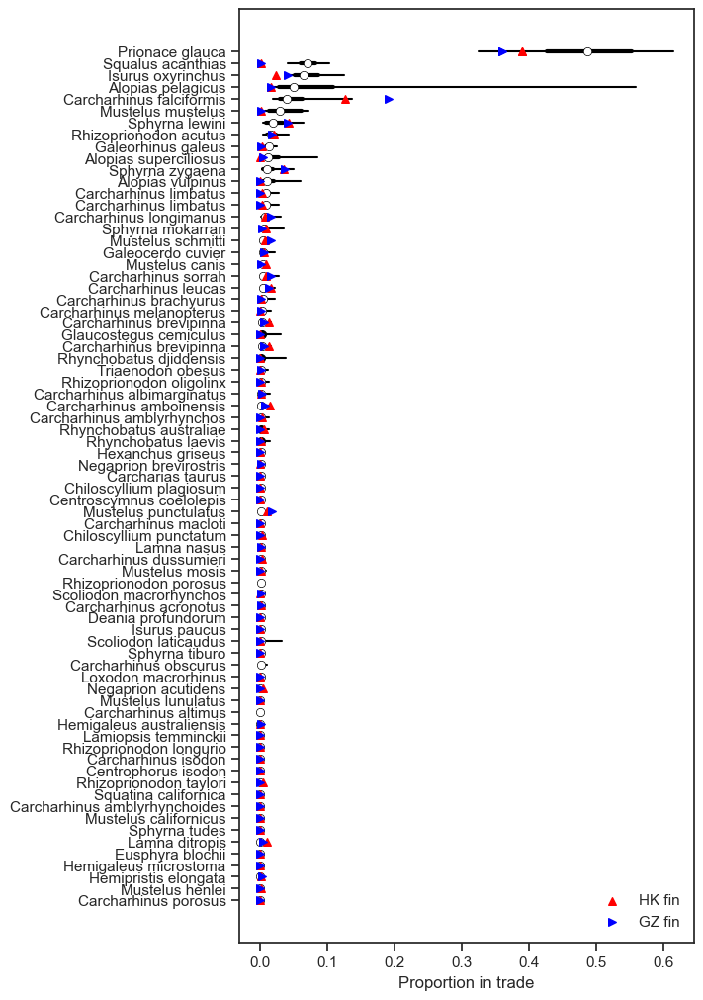

In [285]:
_, ax = plt.subplots(1,1,figsize=(7, 10))

#['ff7f0e','#ff7f0e']

for i in range(FinMeat.shape[0]):
    tmp = FinMeat.loc[i]
    ax.plot((tmp.pl95,tmp.pu95),(i,i),zorder=0,c='black')
    ax.plot((tmp.pl50,tmp.pu50),(i,i),linewidth=3,zorder=0,c='black')
    ax.scatter(tmp.proportion,i,s=30,c='black')
    if tmp.group=='sharks':
        ax.scatter(tmp.proportion,i,s=20,c='white')
    if tmp.group=='rays':
        ax.scatter(tmp.proportion,i,s=20,c='black')

    if tmp.species in card_data['Scientific name'].values:
        ax.scatter(card_data['% of samples HK'][card_data['Scientific name']==tmp.species]/100,i,s=30,c='red',marker='^')
        ax.scatter(card_data['% of samples GZ'][card_data['Scientific name']==tmp.species]/100,i,s=30,c='blue',marker='>')

if tmp.species in card_data['Scientific name'].values:
    ax.scatter(card_data['% of samples HK'][card_data['Scientific name']==tmp.species]/100,i,s=30,c='red',marker='^',label='HK fin')
    ax.scatter(card_data['% of samples GZ'][card_data['Scientific name']==tmp.species]/100,i,s=30,c='blue',marker='>', label='GZ fin')

ax.set_yticks(range(FinMeat.shape[0]))
ax.set_yticklabels(FinMeat.species)
ax.set_xlabel('Proportion in trade')
plt.legend()
plt.savefig(bf+'/Global/'+'finTrade_validation.jpg',dpi=300);